<a href="https://colab.research.google.com/github/joyjitroy/Machine_Learning/blob/Machine_Learning/%20Bank_Customer_Churn_Prediction_using_Artificial_Neural_Networks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center><font size=6> Bank Churn Prediction </font></center>

## Problem Statement

### Context

Businesses like banks which provide service have to worry about problem of 'Customer Churn' i.e. customers leaving and joining another service provider. It is important to understand which aspects of the service influence a customer's decision in this regard. Management can concentrate efforts on improvement of service, keeping in mind these priorities.

### Objective

You as a Data scientist with the  bank need to  build a neural network based classifier that can determine whether a customer will leave the bank  or not in the next 6 months.

### Data Dictionary

* CustomerId: Unique ID which is assigned to each customer
* Surname: Last name of the customer
* CreditScore: It defines the credit history of the customer.
* Geography: A customer’s location  
* Gender: It defines the Gender of the customer
* Age: Age of the customer  
* Tenure: Number of years for which the customer has been with the bank
* NumOfProducts: refers to the number of products that a customer has purchased through the bank.
* Balance: Account balance
* HasCrCard: It is a categorical variable which decides whether the customer has credit card or not.
* EstimatedSalary: Estimated salary
* isActiveMember: Is a categorical variable which decides whether the customer is active member of the bank or not ( Active member in the sense, using bank products regularly, making transactions etc )
* Exited : whether or not the customer left the bank within six month. It can take two values
** 0=No ( Customer did not leave the bank )
** 1=Yes ( Customer left the bank )

## Importing necessary libraries

In [ ]:
# Installing the libraries with the specified version.
#!pip install tensorflow==2.15.0 scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==2.0.3 imbalanced-learn==0.10.1 scikeras -q --user
#!pip install tensorflow==2.16.2 -U scikit-learn -U seaborn -U matplotlib -U numpy pandas==2.0.3 -U imbalanced-learn -U scikeras -q --user

In [ ]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Library to split data
from sklearn.model_selection import train_test_split

# Library to avoid the warnings
import warnings
warnings.filterwarnings("ignore")

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# Removes the limit for the number of displayed rows
pd.set_option("display.max_rows", None)

# Used to suppress scientific notation
pd.set_option("display.float_format", lambda x: "%.4f" % x)

## Loading the dataset

In [ ]:
# Mount google drive to Colab
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Read the Data from excel into a dataset
folder = '/content/drive/MyDrive/AI_ML/Projects/Artificial Neural Network/'
file = 'Churn.csv'
df = pd.read_csv(folder + file)

In [ ]:
# copying data to another variable to avoid any changes to original data
data = df.copy()

## Data Overview

- Observations
- Sanity checks

### Understand the Shape of the Dataset

In [ ]:
# Check the number of rows and columns in the Dataset Shape
print("There are", data.shape[0], 'rows and', data.shape[1], "columns.")

There are 10000 rows and 14 columns.

### View the first and last 5 rows of the dataset

In [ ]:
# returns the first and last 5 rows from dataset and display them together
pd.concat([data.head(), data.tail()])

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.0000,1,1,1,101348.8800,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.8600,1,0,1,112542.5800,0
2,3,15619304,Onio,502,France,Female,42,8,159660.8000,3,1,0,113931.5700,1
3,4,15701354,Boni,699,France,Female,39,1,0.0000,2,0,0,93826.6300,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.8200,1,1,1,79084.1000,0
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.0000,2,1,0,96270.6400,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.6100,1,1,1,101699.7700,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.0000,1,0,1,42085.5800,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.3100,2,1,0,92888.5200,1
9999,10000,15628319,Walker,792,France,Female,28,4,130142.7900,1,1,0,38190.7800,0


**Observations**: Based on the data dictionary and the above data analysis, the following columns can be removed from the model:

- **RowNumber**: This column is a sequential number and does not carry any meaningful information.
- **CustomerId**: This is a unique identifier for each customer and does not provide any meaningful information for the prediction task.
- **Surname**: The customer's last name is not relevant to the prediction of whether they will leave the bank or not.

### Understand the Structure of the Dataset

In [ ]:
# Print a concise summary of the Dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


**Observations**:
The Dataframe has 10000 Rows and 14 Columns. The first 3 columns should be dropped as mentioned earlier. So out of remaining 11 columns,
- 7 columns are integers
- 2 columns are floats
- 2 columns are non-numerical objects and should be converted to Categorical Variables

### Sanity Check of the Data

Check for duplicate values in the Dataset

In [ ]:
# Check for duplicate values in the Dataset
data.duplicated().sum() # aggregating the duplicate values of a dataset

0

Check presence of missing, NaN or negative value in the dataset

In [ ]:
# Check presence of missing, NaN or negative value in the dataset
pd.DataFrame({
    'Missing_Counts': data.isnull().sum(),                                # Check for missing values in the Dataset
    'NaN_Counts': data.isna().sum(),                                      # Check for NaN (Not an Number) values in the Dataset
    'Has_Negative': (df.select_dtypes(include='number') < 0).any(),       # Check for negative values in the Dataset
})

,Missing_Counts,NaN_Counts,Has_Negative
Age,0,0,False
Balance,0,0,False
CreditScore,0,0,False
CustomerId,0,0,False
EstimatedSalary,0,0,False
Exited,0,0,False
Gender,0,0,NaN
Geography,0,0,NaN
HasCrCard,0,0,False
IsActiveMember,0,0,False


**Observations**: The dataset is clean and complete, with no duplicate rows, missing values, or NaN (Not a Number) values. Additionally, all numerical values in the dataset are non-negative.

### Statistical and Concise Summary

In [ ]:
# Print statistical summary of the data of numerical columns using describe() method
data.describe().T

,count,mean,std,min,25%,50%,75%,max
RowNumber,10000.0000,5000.5000,2886.8957,1.0000,2500.7500,5000.5000,7500.2500,10000.0000
CustomerId,10000.0000,15690940.5694,71936.1861,15565701.0000,15628528.2500,15690738.0000,15753233.7500,15815690.0000
CreditScore,10000.0000,650.5288,96.6533,350.0000,584.0000,652.0000,718.0000,850.0000
Age,10000.0000,38.9218,10.4878,18.0000,32.0000,37.0000,44.0000,92.0000
Tenure,10000.0000,5.0128,2.8922,0.0000,3.0000,5.0000,7.0000,10.0000
Balance,10000.0000,76485.8893,62397.4052,0.0000,0.0000,97198.5400,127644.2400,250898.0900
NumOfProducts,10000.0000,1.5302,0.5817,1.0000,1.0000,1.0000,2.0000,4.0000
HasCrCard,10000.0000,0.7055,0.4558,0.0000,0.0000,1.0000,1.0000,1.0000
IsActiveMember,10000.0000,0.5151,0.4998,0.0000,0.0000,1.0000,1.0000,1.0000
EstimatedSalary,10000.0000,100090.2399,57510.4928,11.5800,51002.1100,100193.9150,149388.2475,199992.4800


**Based on Statistical Summary**:

- **Credit Score**: Credit scores span from 350 to 850, with an average of approximately 650.
- **Age**: Customer ages range from 18 to 92, with a mean of approximately 38.9 and a 75th percentile of 44, suggesting potential outliers.
- **Tenure**: Customer tenure ranges from 0 to 10 years, with an average of approximately 5.01 years.
- **Balance**: Account balances vary from 0 to approximately 250,898, with a mean of approximately 76,485.89. Notably, the maximum value of 250,898.09 is significantly higher than the 75th percentile (127,644.24) and the mean (76,485.89), indicating the presence of outliers.
- **NumOfProducts**: The number of products purchased ranges from 1 to 4, indicating that the bank offers four different products.
- **HasCrCard**: The binary indicator for credit card ownership (0 or 1) has a mean of approximately 0.7055, indicating that around 70.55% of customers possess a credit card.
- **IsActiveMember**: The binary indicator for active membership (0 or 1) has a mean of approximately 0.5151, indicating that around 51.51% of customers are active members.
- **EstimatedSalary**: Estimated salaries range from approximately \$11,580 to 199,992, with a mean of approximately \$100,090.24. The minimum salary of \$11.58 is significantly lower than the 25th percentile (\$51,002.11), and the maximum salary of \$199,992.48 is significantly higher than the 75th percentile (\$149,388.25), indicating the presence of outliers.


- **Exited** (Target Column): The binary indicator for customers who have exited (0 or 1) has a mean of approximately 0.2037, indicating that around 20.37% of customers have exited. This column is the target variable, and the rest of the columns are predictor variables.

In [ ]:
# Print statistical summary of the object columns
data.describe(include=["object"]).T

,count,unique,top,freq
Surname,10000,2932,Smith,32
Geography,10000,3,France,5014
Gender,10000,2,Male,5457


**Based on Statistical Summary**:

- **Geography**: The bank customers belong to 3 different unique locations.
- **Gender**: The gender column has 2 unique values, should be indicating male and female customers.

**Drop the Meaningless columns not useful for model**

In [ ]:
# Drop the Meaningless Columns
try:
  data = data.drop(['RowNumber', 'CustomerId', 'Surname'], axis=1)
  print("Meaningless Columns dropped successfully.")
except KeyError:
  print(f"Meaningless Columns must already be dropped.")

Meaningless Columns dropped successfully.

## Exploratory Data Analysis

### Define Useful Functions for Improved Graphical Representations

#### Render a Boxplot and histogram combined

In [ ]:
def histogram_boxplot(data, feature,
                      Title = None,
                      xlabel = None,
                      figsize = (12, 7), fontsize = 15,
                      kde = False,
                      bins = None,
                      boxPlot_Color = None,
                      histPlot_Color = None,
                      hist_palette = "winter",
                      stat_summary_loc = {'x':0.015, 'y':0.76}
                      ):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    fig, (ax_box, ax_hist) = plt.subplots(
        nrows = 2,          # Number of rows of the subplot grid= 2
        sharex = True,      # x-axis will be shared among all subplots
        gridspec_kw = {"height_ratios": (0.25, 0.75)},
        figsize = figsize)

    # Create boxplot with mean indicator, and histogram with mean and median lines
    # boxplot will be created and a star will indicate the mean value of the column
    sns.boxplot( data = data, x = feature, ax = ax_box, showmeans = True, color = boxPlot_Color)  # For Boxplot
    sns.histplot(data = data, x = feature, kde = kde, ax = ax_hist, bins = bins, color = histPlot_Color, palette = hist_palette
    ) if bins else sns.histplot(
        data = data, x = feature, color = histPlot_Color, kde = kde, ax = ax_hist
        )  # For histogram

    ax_hist.axvline(data[feature].mean(), color = "black", linestyle="--")   # Add mean to the histogram
    ax_hist.axvline(data[feature].median(), color = "black", linestyle="-")  # Add median to the histogram
    ax_hist.legend(['Mean', 'Median'])                                       # Add a legend with Mean and Median

    # Displaying summary statistics for the feature distribution
    text = f"Mean: {data[feature].mean():.2f}" + \
            "\nMedian: " + f"{data[feature].median():.2f}" + \
            "\nCount: " + f"{data[feature].count()}" + \
            "\nMax: " + f"{data[feature].max():.2f}" + \
            "\nMin: " + f"{data[feature].min():.2f}"
    ax_hist.text(stat_summary_loc['x'], stat_summary_loc['y'], text,
                 transform = ax_hist.transAxes,
                 bbox = dict(facecolor ='white',alpha = 0.3)
                 )

    # Set the Title of the Plot
    # If Title is Not Specified, then create the Title
    # Lambda Function Utilized
    Title = (("Distribution of " + feature) if Title is None else (Title)).replace("_", " ")

    # Assign a Suitable Title to the Plot
    fig.suptitle(Title, fontsize = fontsize, y = 0.95)

    # Set the label of the x column
    ax_hist.set_xlabel(((feature) if xlabel is None else (xlabel)).replace("_", " "),
               fontsize = fontsize)

    plt.show()  # show the plot

#### Render a labeled Barplot

In [ ]:
# function to create labeled barplots
def labeled_barplot(data,             # dataframe
                    feature,          # dataframe column name
                    hue = None,       # second dataframe column name
                    mapping = {},     # if column represent binary value then map to the actual value
                    perc = False,     # whether to display percentages instead of count (default is False)
                    n = None,         # displays the top n category levels (default is None, i.e., display all levels)
                    Title = None,
                    xlabel = None,
                    palette = "Paired",
                    fontsize = 12, degree = 0):

    # Handling NaN values
    data[feature] = data[feature].fillna("Missing")

    # Apply the mapping to the feature column if a mapping dictionary is provided
    if mapping:
        data[feature] = data[feature].map(mapping)

    hue_count = 0 if hue == None else data[hue].nunique() # number of unique values in the hue column
    count = data[feature].nunique() + hue_count           # number of unique values
    total = len(data[feature])                            # length of the column

    # Set the Plot size
    plt.figure(figsize = (count + 1, 5)) if n is None else plt.figure(figsize = (n + 1, 5))

    # Generate the Plot
    ax = sns.countplot(data = data, x = feature, hue = hue, palette = palette,
        order = data[feature].value_counts().index[:n].sort_values(),
    )
    # For each bar: Place a label
    ax = annotate_the_labels(ax, total, perc = perc)

    # Render the barplot
    plot_styling(data, feature, mapping,
                 Title, "Barplot of ",
                 xlabel, degree = degree,
                 )

    sns.despine(left=True)    # Hide the plot border
    plt.show()                # show the plot

In [ ]:
def annotate_the_labels(ax, col, fontsize = 12, perc = True):
  for p in ax.patches:
    # Set the Label
    label = "{:.1f}%".format(100 * p.get_height() / col) if perc else p.get_height()

    # Get the x and y position of the label
    x = p.get_x() + p.get_width() / 2   # width of the plot
    y = p.get_height()                  # height of the plot

    # Annotate the Labels
    ax.annotate(label, (x, y), ha = "center", va = "center",
      size = fontsize, xytext = (0, 5), textcoords="offset points",
      )  # annotate the percentage

  return ax

#### Render a Stacked Barplot

In [ ]:
from matplotlib.ticker import FuncFormatter  # Import FuncFormatter

# Render a interactive bar chart for Bivariate analysis
def stacked_barplot(data,
                    predictor,              # independent variable
                    target,                 # target variable
                    Title = None,           # Title of the plot
                    xlabel = None,          # x-axis label
                    index_mapping = {},
                    column_mapping = {},
                    order = None,
                    figsize = (12, 7),
                    kind = 'bar', stacked = True,
                    fontsize = 12, degree = 0,
                    normatized_by_index = True,
                    figsize_height = 5,
                    linewidth = 0.5,
                    ):

    # Define useful variables
    count = data[predictor].nunique()               # Return the unique value count of predictor column
    predictor_ = (predictor).replace("_", " ") if xlabel is None else (xlabel)
                                                    # set the label of X axis
    target_ = target.replace("_", " ")              # set the label of Legand

    # Create Plot data by creating a Crosstab with predictor and target column
    plotdata = pd.crosstab(data[predictor], data[target], normalize = "index"
                           ) if normatized_by_index else pd.crosstab(data[predictor], data[target]
                                                                  ).sort_values(by=data[target].value_counts().index[1], ascending=False)

    # Replace index and column values using the rename method
    plotdata.rename(index = index_mapping, columns = column_mapping, inplace=True)

    ## Reindex DataFrame
    plotdata = plotdata.loc[order] if order is not None else plotdata

    # Plot the data
    plotdata.plot(kind = kind, stacked = stacked, figsize=(count + 5, figsize_height), width = linewidth)

    # If Title is Not Specified, then define the Title
    Title = (predictor_ + " v/s " + target_) if Title is None else (Title)

    plt.title(Title, fontsize = fontsize, y=1.04)                       # Display the Title of the Plot
    plt.xlabel(predictor_, fontsize = fontsize)                         # Display the plot accross X Axis
    plt.xticks(rotation = degree, fontsize = fontsize)                  # Display labels of xticks
    plt.yticks(fontsize = fontsize)                                     # Display labels of xticks
    plt.legend(title = target_, loc="upper left", bbox_to_anchor=(1, 1)) # display the Legand

    plt.gca().yaxis.set_major_formatter(FuncFormatter(to_percentage)) if normatized_by_index else None  # Format the y-axis

    sns.despine(top = True, right = True)       # Hide the plot border
    plt.show()                                  # Display the Plot

#### Render a distributions plot and Box plot in one Frame

In [ ]:
### function to plot distributions with restpect to target

def distribution_plot_wrt_target(data, predictor, target,
                                  Title = None,
                                  xlabel = None,
                                  mapping = None,
                                  ked = False,
                                  hist_stat = "density",
                                  Color = ["teal", "orange"],
                                  figsize=(12, 10),
                                  fontsize = 12, degree = 0,
                                  Adjust_Title = False,
                                  Title_len_per_line = 20,
                                  ):

    # Set up labels text
    predictor_ = (predictor).replace("_", " ") if xlabel is None else (xlabel)
    target_ = target.replace("_", " ")

    # Get all the unique value of Target variable
    target_uniq = sorted(data[target].unique())

    # Map each unique numeric target to its corresponding non-numeric value
    target_val = [mapping.get(item, item) for item in (target_uniq)] if mapping != None else target_uniq

    # Define a 2x2 Subplot
    fig, axs = plt.subplots(2, len(target_uniq), figsize = figsize)

    # Add space between Subplots
    fig.subplots_adjust(hspace=0.3)

    # Render the Histplots
    for i in range(len(target_uniq)):
      # Set title for Histplots
      title = "Distribution of " + predictor_ + " w.r.t. " + target_ + " = " + str(target_val[i])
      title = break_line(title, Title_len_per_line) if Adjust_Title else title
      axs[0, i].set_title(title)

      # Plot the Histograms
      sns.histplot(data = data[data[target] == target_uniq[i]],
                x=predictor, kde=ked, ax=axs[0, i], color= Color[i], stat = hist_stat)

      # Set the Lavel of X Axis by replacing Underscores in the Column Name with Spaces
      axs[0, i].set_xlabel(predictor_, fontsize = fontsize)

    # Render the Boxplots
    for i in range(len(target_uniq)):
      # Set title for Boxplot
      plot_title = "Boxplot of " + predictor_ + " w.r.t. " + target_ + " = " + str(target_val[i])
      plot_title = break_line(plot_title, Title_len_per_line) if Adjust_Title else plot_title
      axs[1, i].set_title(plot_title)

      # plot the Bixplots
      sns.boxplot(data = data[data[target] == target_uniq[i]], x = predictor,
                  ax=axs[1, i], color = Color[i])

      # Set the Lavel of X Axis by replacing Underscores in the Column Name with Spaces
      axs[1, i].set_xlabel(predictor_, fontsize = fontsize)

    # Set a title for the figure object
    fig.suptitle((target_ + " v/s " + predictor_)if Title is None else (Title),
                 fontsize = fontsize, y=0.95)

    plt.show() # Display the Plot

#### Print a table

In [ ]:
# Import Library to display data in Table format
from tabulate import tabulate

# Fuinction to print a table
def print_table(data, predictor, target,
                index_mapping = {},
                column_mapping = {},
                tablefmt ='fancy_grid',
                ):

    # Define useful variables
    sorter = data[target].value_counts().index[-1]  # Returns the least common value in the target column

    # Creater a Crosstab with predictor and target column
    cross_tab = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter)

    # Replace index and column values using the rename method
    cross_tab.rename(index = index_mapping, columns = column_mapping, inplace=True)

    # Define the new index name by combining the column name and index name
    # Additionally, replace any underscores in the new index name with spaces
    table_index_name = (cross_tab.columns.name + "\n" + cross_tab.index.name).replace("_", " ")

    # Set the name of the axis for the index with new name
    cross_tab.rename_axis(table_index_name, axis='index', inplace = True)

    # Print the table
    print(tabulate(cross_tab, headers='keys', tablefmt = tablefmt))

#### Other Useful Functions

In [ ]:
def plot_styling (  data,
                    feature,
                    mapping = {},
                    Title = None,
                    Title_prefix = "",
                    xlabel = None,
                    fontsize = 12, degree = 0,
                    ):
    # If Title is Not Specified, Set the Title of the Plot
    Title = (Title_prefix + " " + (feature.replace("_", " "))) if Title is None else Title

    # Add the Title to the Plot
    plt.title(Title, fontsize = fontsize, y=1.02)

    # if x Axis label is not specified, then
    # Set the x axis label by replacing Underscores in the Column Name with Spaces
    plt.xlabel(((feature.replace("_", " ")) if xlabel is None else xlabel),
               fontsize = fontsize)

    # map the xticks label
    labels = [mapping.get(x, x) for x in np.sort(data[feature].unique())]

    # Set the xticks labels
    plt.xticks(tuple(range(0, len(labels))),
               labels = labels,
               rotation = degree, fontsize = fontsize # Rotate the x-Axis Label and set the front side
               )

In [ ]:
# Function to format y-axis as percentage
def to_percentage(y, position):
    return f'{100 * y:.0f}%'

In [ ]:
# Break line if it is two long
def break_line(text, max_length_per_line = 20):

  # Check if the text is too long
  if len(text) > max_length_per_line:
    # Find a suitable place to split the title (e.g., at spaces)
    split_index = text.rfind(' ', 0, max_length_per_line) if ' ' in text[:max_length_per_line] else max_length_per_line
    # No suitable split found, split at max length
    split_index = max_length_per_line if split_index == -1 else split_index
    text = text[:split_index] + '\n' + text[split_index:]

  return text

### Univariate Analysis

#### **Customers' Demographic Information**

##### Observations on Age

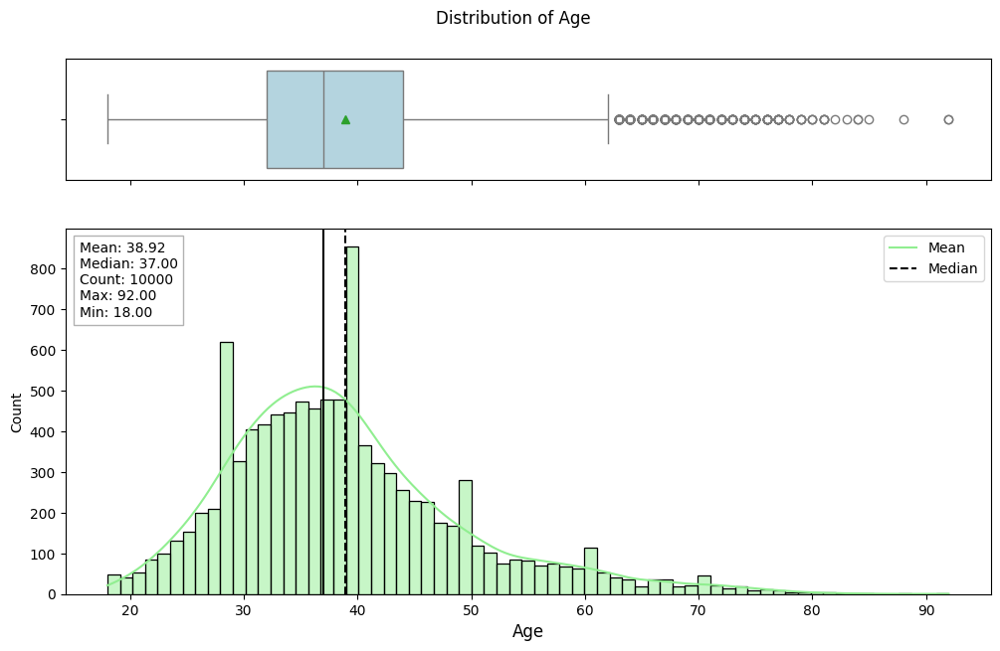

In [ ]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "Age", fontsize = 12, kde=True, boxPlot_Color = 'lightblue', histPlot_Color = 'lightgreen')

**Observations**
- The age distribution of bank customers is right-skewed, indicating a higher proportion of younger customers.
- The data suggests a diverse age range, with a concentration of individuals in their late 30s.
- The data has some extreme outliers with few customers belong to the age range of 80 to 92. Since these ages represent real customers, they shouldn't be treated as errors.
- The close proximity of the mean and median suggests that the central tendency (typical age) is not significantly affected by the outliers.


##### Observations on Gender

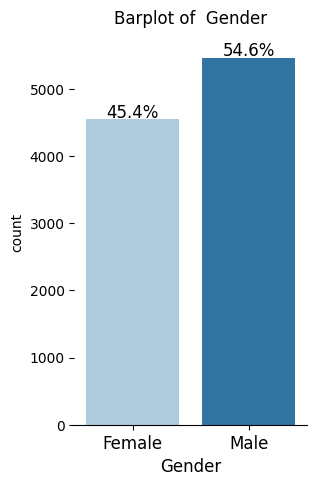

In [ ]:
# Call the Function with Display The labeled barplot
labeled_barplot(data, "Gender", perc=True)

**Observations**
- The data indicates that the bank's customer base is predominantly male, with 54.6% of customers being male and 45.4% being female.

##### Observations on Geography

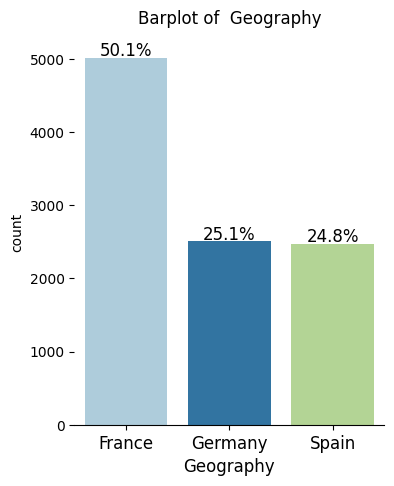

In [ ]:
# Call the Function with Display The labeled barplot
labeled_barplot(data, "Geography", perc=True)

**Observations**
- The bar chart illustrates the distribution of geography across three countries: France (50.1%), Germany (25.1%), and Spain (24.8%). France has approximately half of the customers, while Germany and Spain each have approximately one-fourth.

#### **Customers' Finantial Information**

##### Observations on Credit Score

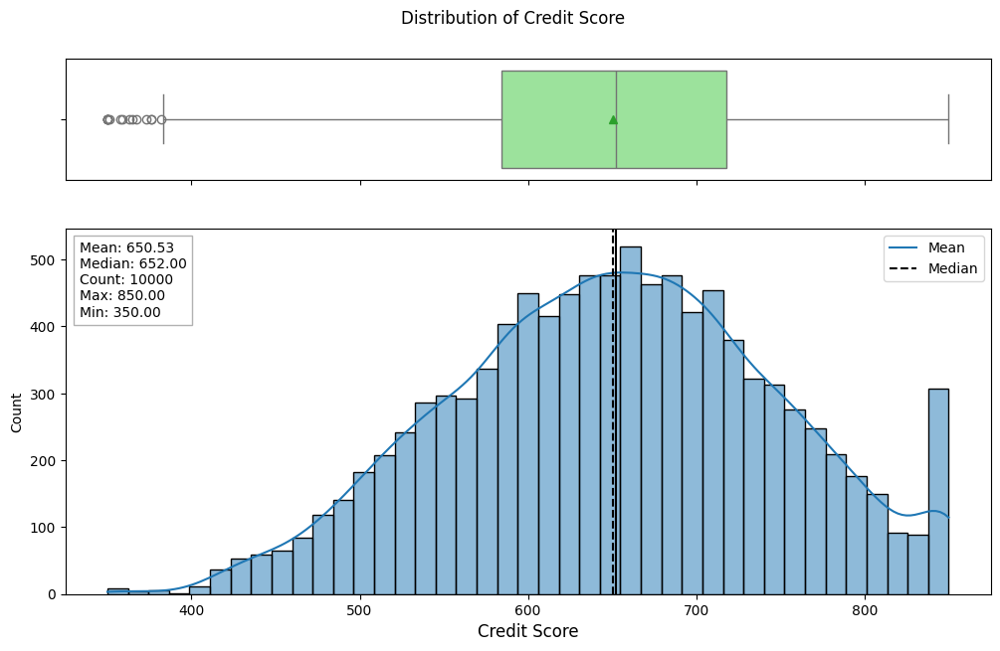

In [ ]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "CreditScore", fontsize = 12, kde=True, boxPlot_Color = 'lightgreen',
                  Title = "Distribution of Credit Score",
                  xlabel = "Credit Score",
                  )

**Observation**
- The credit scores of customers exhibit left skewness, with outliers on the left side of the boxplot indicating a small number of customers with very low credit scores.
- Despite these outliers, the close proximity of the mean and median suggests that the central tendency is not significantly impacted.
- It's important to recognize that these credit scores represent real customers and should not be treated as errors.

##### Observations on Balance

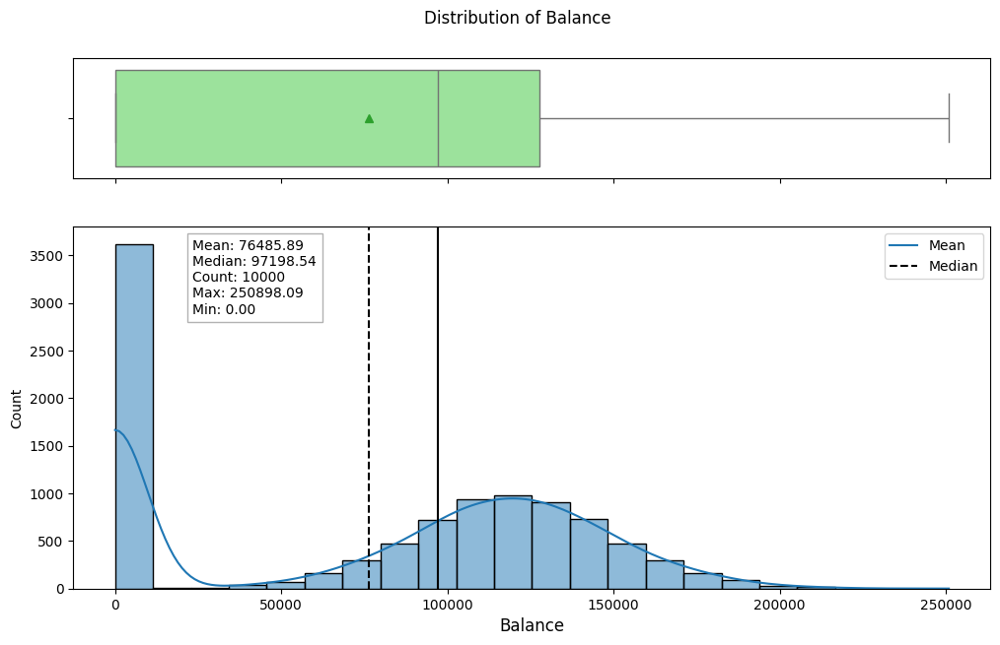

In [ ]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "Balance", fontsize = 12, kde=True, boxPlot_Color = 'lightgreen',
                  stat_summary_loc = {'x':0.13, 'y':0.76},
                  )

**Observation**
- Over 3,500 customers have zero balances, and most of them should have already left the bank. However, in the dataset total 20.37% of customers who left the bank, indicating that there are still existing customers with zero balances who require further analysis. Therefore, it is essential to examine the distribution of non-zero balances among active customers during the bivariate analysis.
- It is important to examine the distribution of balance among customers who doesn't have zero balance.

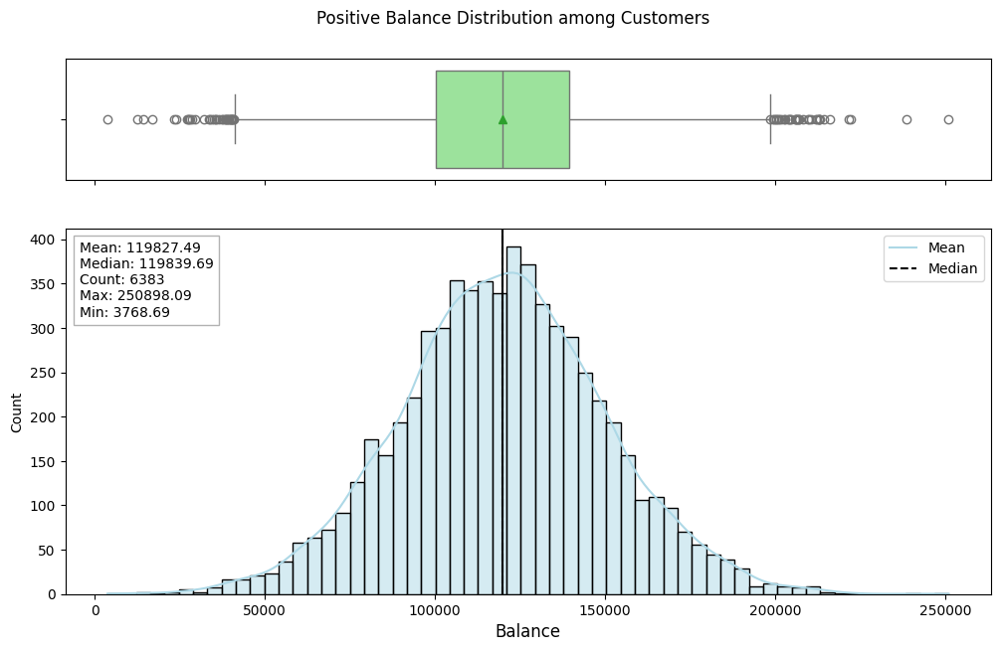

In [ ]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data.loc[data['Balance'] != 0], "Balance", fontsize = 12, kde=True, boxPlot_Color = 'lightgreen', histPlot_Color = 'lightblue',
                  Title = "Positive Balance Distribution among Customers",
                  )

**Observation**
- The distribution of customers with positive balances is relatively even, with most customers' balances clustering around the median value.
- Outliers are visible beyond both whiskers, indicating extreme low and high balances among a few customers (lowest balance is \$3769,69 and height is \$250898.09). Since this dataset represents real customer data, there is no need to treat or remove these outliers.

##### Observations on Tenure

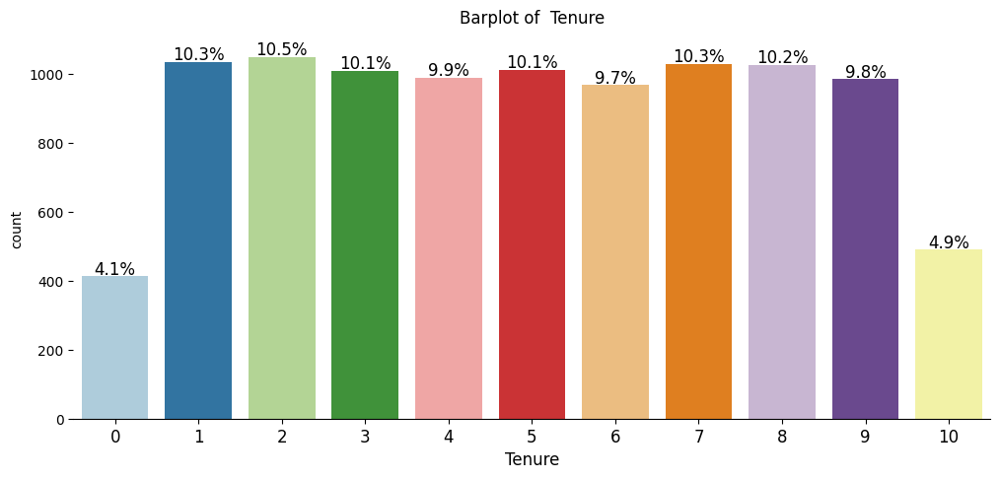

In [ ]:
# Call the Function with Display The labeled barplot
labeled_barplot(data, "Tenure", perc=True)

**Observations**
- A small proportion of customers (4.1%) are new to the bank, with a tenure of less than 1 year.
- Customers with a tenure of 1-9 years are relatively evenly distributed, with each year of tenure within this range accounting for approximately 10% of the total customer base.
- Notably, 4.9% of customers have been with the bank for 10 years, indicating a decline in customer retention after 9 years of tenure with the bank.

##### Observation of Number of products customers purchased (NumOfProducts)

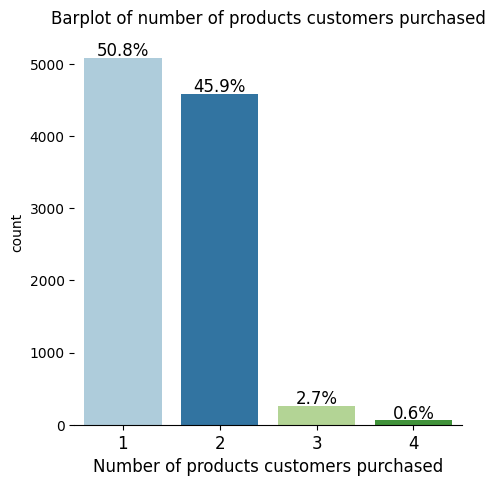

In [ ]:
# Call the Function with Display The labeled barplot
labeled_barplot(data, "NumOfProducts", perc=True,
                Title = "Barplot of number of products customers purchased",
                xlabel = "Number of products customers purchased")

**Observations**
- The bank offers four products.
- over 96% of customers have purchased one or two products (50.8% purchasing one product, 45.9% purchasing two products).
- While a small minority have purchased three or four products (2.7% and 0.6%, respectively).

##### Observations on Estimated Salary

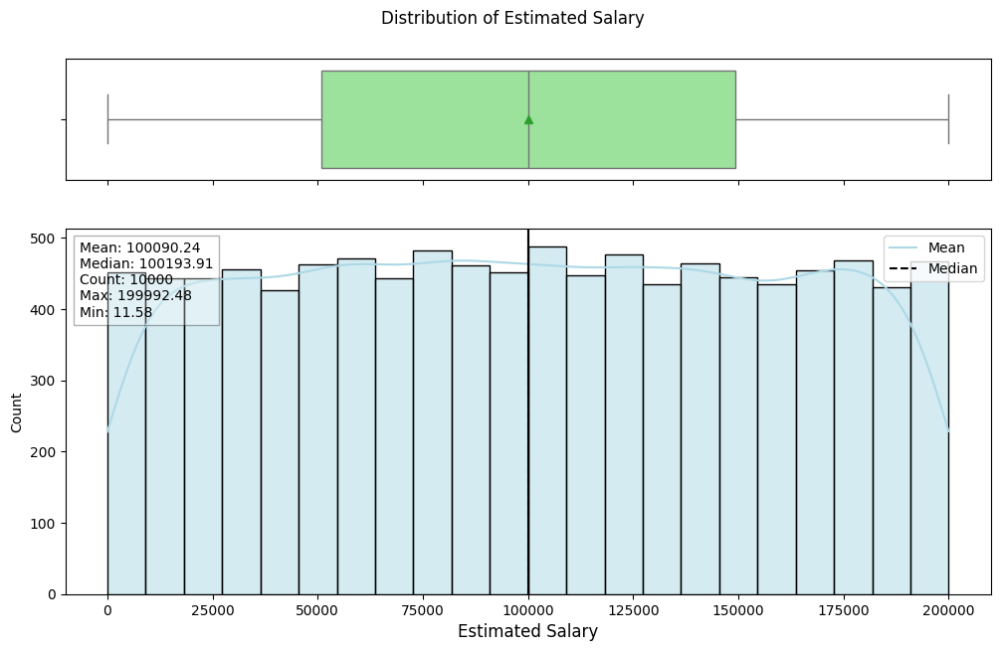

In [ ]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "EstimatedSalary", fontsize = 12, kde=True, boxPlot_Color = 'lightgreen', histPlot_Color = 'lightblue',
                  Title = "Distribution of Estimated Salary",
                  xlabel = "Estimated Salary",
                  )

**Observations**
- The Customer's Estimated Salary is distributed uniformly across the range. The mean and median are very close, also indicating a symmetric distribution.
- The Minimum and Maximum salary is respectively \$11.58 and \$199992.48, suggests that the bank's customers have a wide range of estimated salaries, with most salaries being distributed relatively evenly across the spectrum.
- The minimum estimated salary is \$11.58 indicating that there are unemployed or retired customers. For employed individuals, a minimum salary of \$15,000 to \$20,000 is reasonable, while for retired or unemployed individuals, an estimated salary of $0 can be appropriate.

##### Observations on Has Credit Card (HasCrCard)

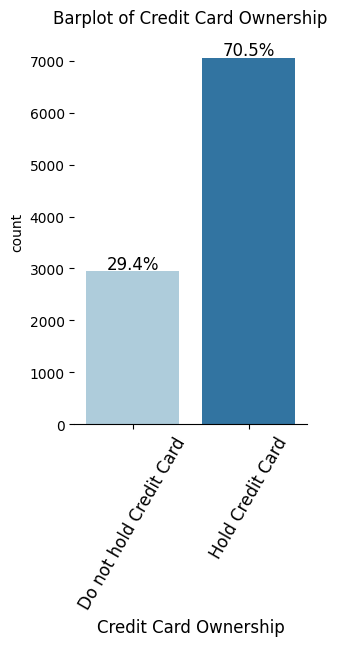

In [ ]:
# Mapping for Holding credit Card
cc_mapping = {0: "Do not hold Credit Card", 1: "Hold Credit Card"}

# Call the Function with Display The labeled barplot
labeled_barplot(data.copy(), "HasCrCard", perc=True,
                mapping = cc_mapping,
                Title = "Barplot of Credit Card Ownership",
                xlabel = "Credit Card Ownership",
                degree = 60,
                )

**Observations**
- 70.5% customers hold credit card where 29.4% customer do not.

##### Observations of Active vs. Inactive Customers (isActiveMember)

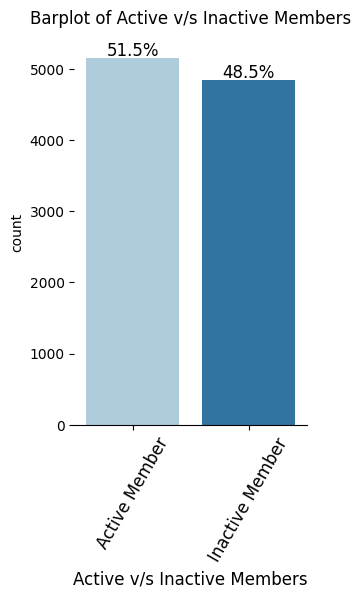

In [ ]:
# Mapping of active vs inactive customers
cust_activity_mapping = {0: "Inactive Member", 1: "Active Member"}

# Call the Function with Display The labeled barplot
labeled_barplot(data.copy(), "IsActiveMember", perc=True,
                mapping = cust_activity_mapping,
                Title = "Barplot of Active v/s Inactive Members",
                xlabel = "Active v/s Inactive Members",
                degree = 60,
                )

**Observations**
- Almost half of the bank's members (48.5%) are inactive, meaning they do not regularly conduct transactions or utilize bank products. This suggests a significant portion of customers are not actively engaging with the bank's services.

##### Observation on Exited customers

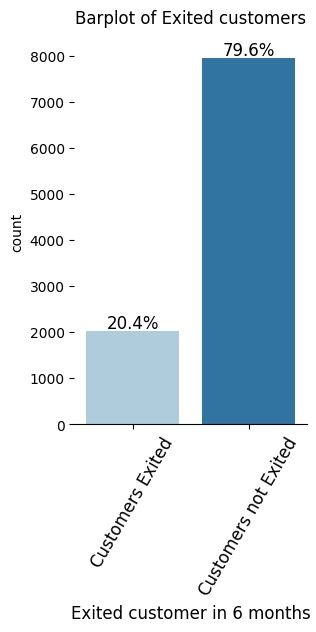

In [ ]:
# Mapping for Exitev vs not exited customers
mapping = {0: "Customers not Exited", 1: "Customers Exited"}

# Call the Function with Display The labeled barplot
labeled_barplot(data.copy(), "Exited", perc=True,
                mapping = mapping,
                Title = "Barplot of Exited customers",
                xlabel = "Exited customer in 6 months",
                degree = 60,
                )

**Observations**
- 20.4% of our customers have departed from the bank in just the last six months, indicating a concerning level of attrition.


### Bivariate Analysis

#### **Correlation Check**

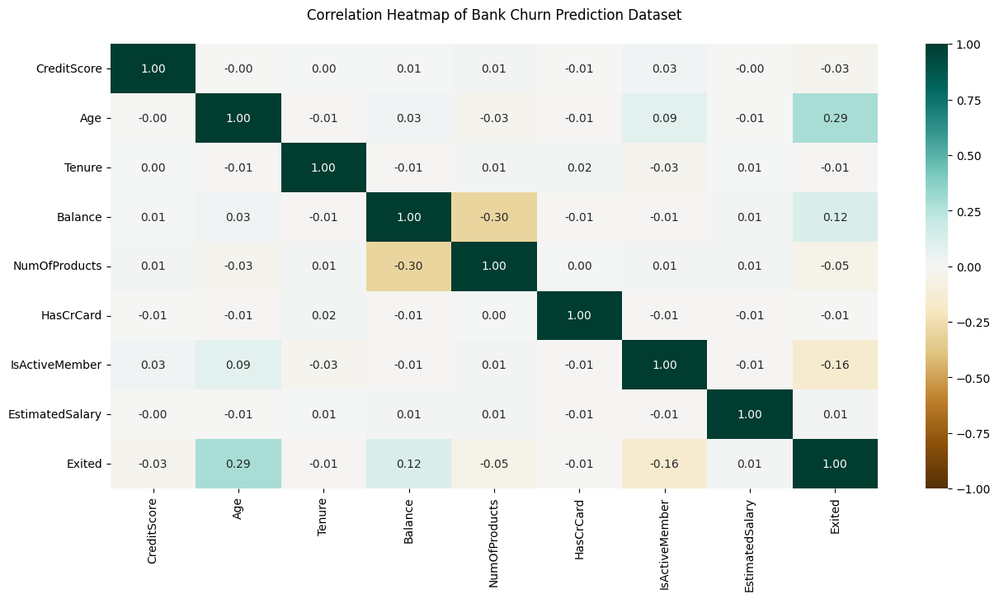

In [ ]:
# Assess the correlation among all columns.
# Exclude the Client Number (CLINTNUM) field because it is a unique identifier and cannot be correlated with any other independent variable
plt.figure(figsize=(15, 7))                                     # Set the figure size
correlation_matrix = (data.select_dtypes(include=['number']))   # Select only numerical columns and create a correlation matrix

# Plot the heatmap using Seaborn
heatmap = sns.heatmap(correlation_matrix.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="BrBG")
heatmap.set_title('Correlation Heatmap of Bank Churn Prediction Dataset', y=1.04)   # Set the title and position it
plt.show()                                                                          # Display the Plot

**Observations**
- The correlation of -0.3 between Balance and Number of products used by customers indicates a moderate negative relationship, suggesting that as the number of products a customer has increases, their account balance tends to decrease.
- The correlation of 0.29 between Age and Exited indicates a weak positive relationship, suggesting that older customers tend slightly more to leave the bank within the next six months.
- If there are no further significant correlations observed

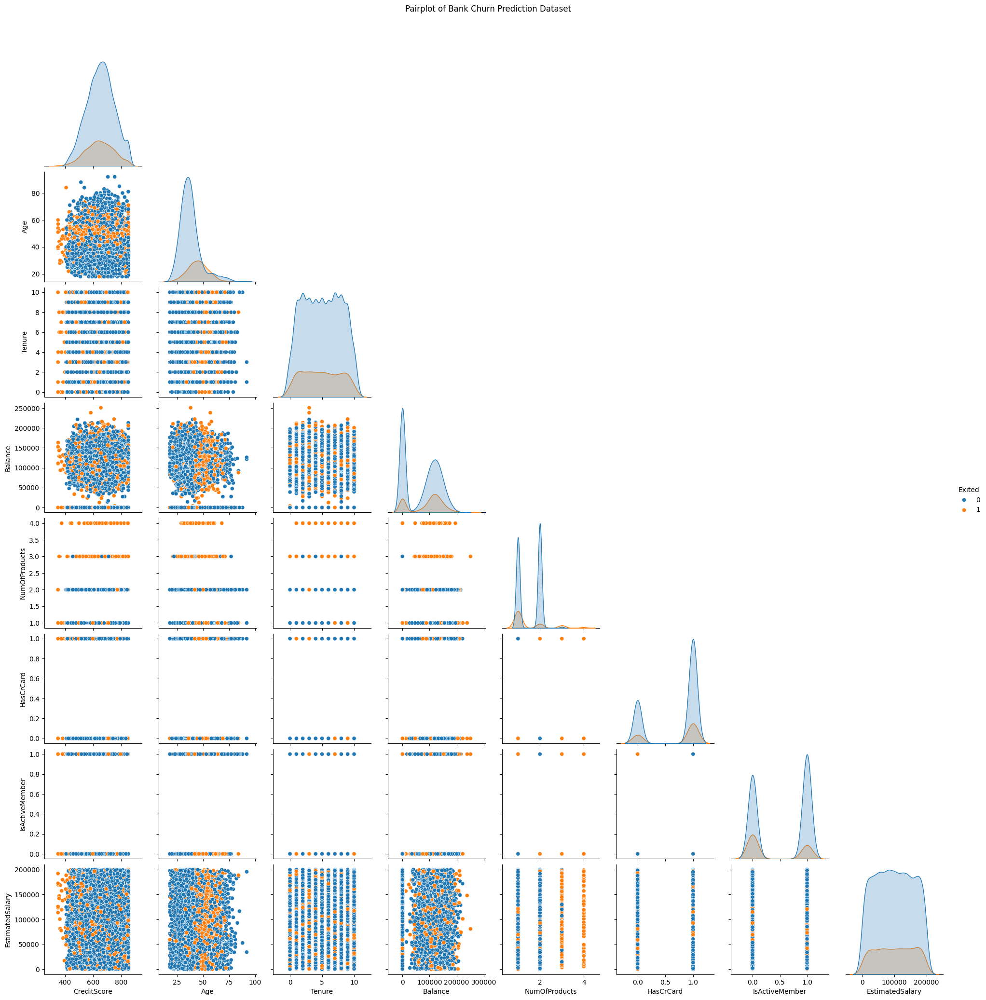

In [ ]:
# Create a pairplot for Bivariate analysis
sns.pairplot(data, diag_kind = "kde", hue = "Exited", corner = True)
plt.suptitle('Pairplot of Bank Churn Prediction Dataset', y = 1.04)
plt.show()

**Observations**
- The pair plot reveals distinct clustering in several variables: Balance (2 clusters), Numof Products (3-4 clusters), HasCrCards (2 clusters), and isActiveMember (2 clusters).
- Both exited and non-exited customers are distributed across these clusters, with non-exited customers significantly less represented due to class imbalance.

#### **Exited Customers Compared to Demographic Attributes**

##### Exited Customers vs Age

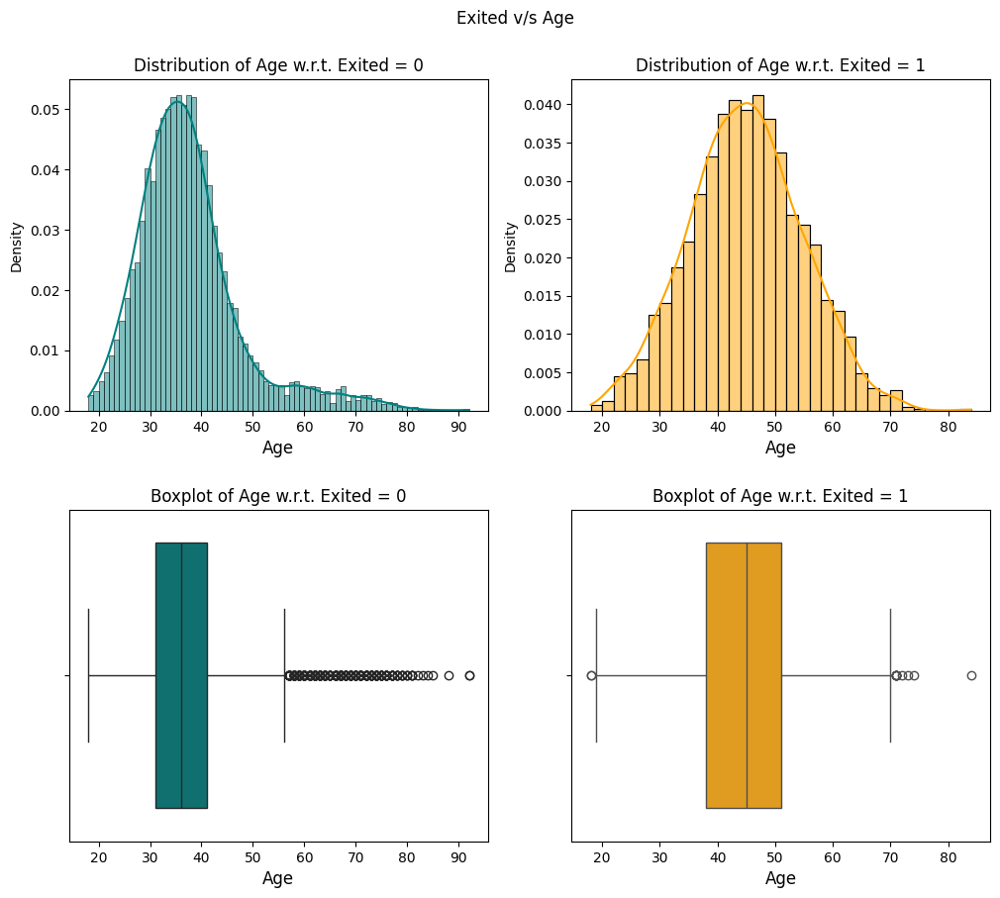

In [ ]:
# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Age", "Exited", ked = True,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observations**
- The median age of exited customers is approximately 45, whereas the median age of non-exited customers is around 35, indicating that younger customers tend to have a higher tendency to stay with the bank.
- Additionally, the right-skewed distribution of customers who remain with the bank supports this observation.

##### Exited Customers vs Gender

╒══════════╤════════════════════════╤════════════════════╤═══════╕
│ Exited   │   Customers not Exited │   Customers Exited │   All │
│ Gender   │                        │                    │       │
╞══════════╪════════════════════════╪════════════════════╪═══════╡
│ Male     │                   4559 │                898 │  5457 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ Female   │                   3404 │               1139 │  4543 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ All      │                   7963 │               2037 │ 10000 │
╘══════════╧════════════════════════╧════════════════════╧═══════╛

-------------------------------------------------------------------------------------------------------------------
-----

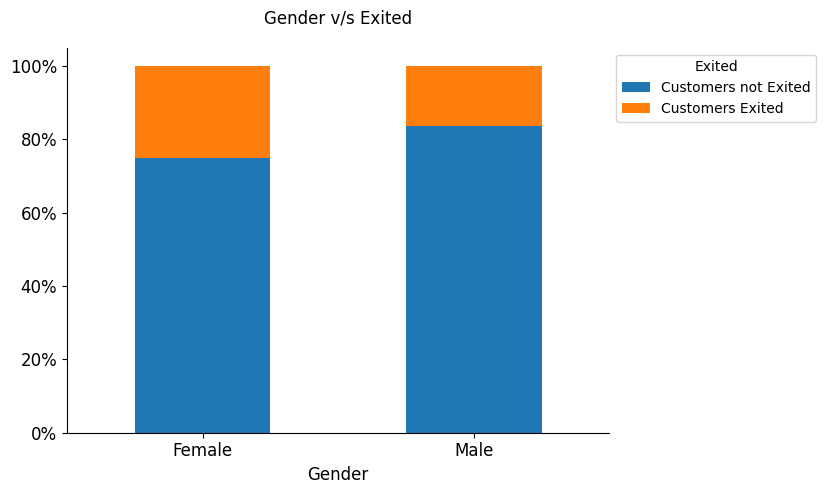

In [ ]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "Gender", "Exited",
            column_mapping = mapping)
print("-" * 120)

stacked_barplot(data, "Gender", "Exited",
                column_mapping = mapping) # Stached a Custom Barplot

**Observations**
- Attrition rate among females is much higher compared to males.

##### Exited Cutomers vs Geography

╒═════════════╤════════════════════════╤════════════════════╤═══════╕
│ Exited      │   Customers not Exited │   Customers Exited │   All │
│ Geography   │                        │                    │       │
╞═════════════╪════════════════════════╪════════════════════╪═══════╡
│ Spain       │                   2064 │                413 │  2477 │
├─────────────┼────────────────────────┼────────────────────┼───────┤
│ France      │                   4204 │                810 │  5014 │
├─────────────┼────────────────────────┼────────────────────┼───────┤
│ Germany     │                   1695 │                814 │  2509 │
├─────────────┼────────────────────────┼────────────────────┼───────┤
│ All         │                   7963 │               2037 │ 10000 │
╘═════════════╧════════════════════════╧════════════════════╧═══════╛

-------------------------------------------------------------------------------------------------------------------
-----

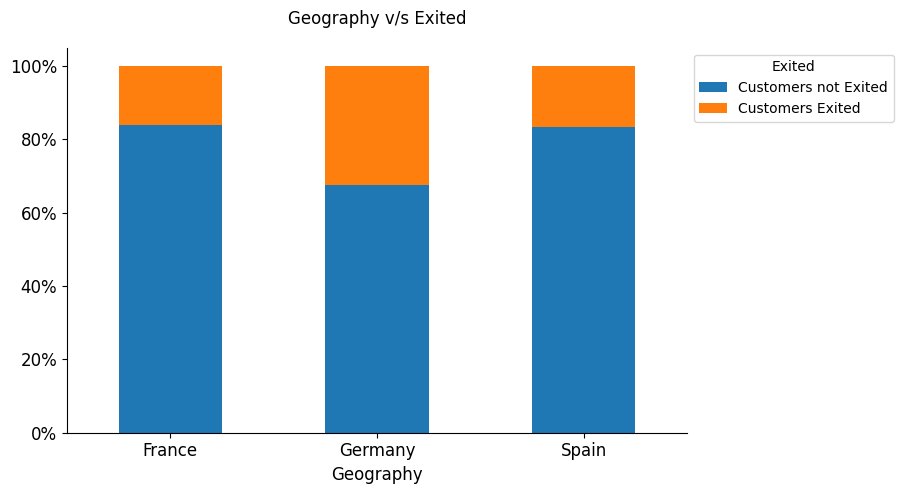

In [ ]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "Geography", "Exited",
            column_mapping = mapping)
print("-" * 120)

stacked_barplot(data, "Geography", "Exited",
                column_mapping = mapping) # Stached a Custom Barplot

**Observations**
- The customer retention rate is significantly low among customers in Germany, at approximately 65%, compared to customers in France and Spain, where it is notably higher around 85%.

#### **Exited Customers Compared to Financial Attributes**


##### Exited Customers vs Credit Score

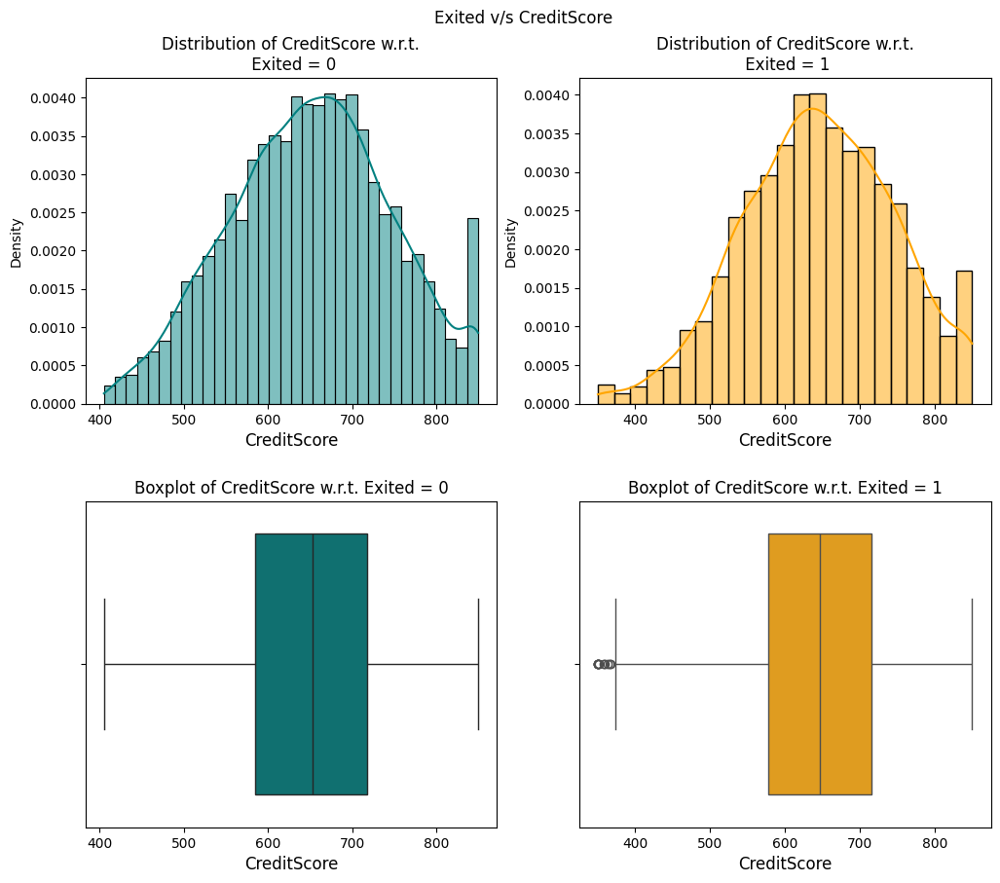

In [ ]:
# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "CreditScore", "Exited", ked = True,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**
- Customers with credit scores below 400 have all exited, indicating that those with scores lower than 400 definitely left the bank.
- The highest credit score observed for both exited and retained customers is 850, with a median close to 650, suggesting that credit score alone may not strongly differentiate between customers who leave and those who stay, unless it is below 400.

##### Exited Customers vs Tenure

╒══════════╤════════════════════════╤════════════════════╤═══════╕
│ Exited   │   Customers not Exited │   Customers Exited │   All │
│ Tenure   │                        │                    │       │
╞══════════╪════════════════════════╪════════════════════╪═══════╡
│ 0        │                    318 │                 95 │   413 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ 10       │                    389 │                101 │   490 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ 7        │                    851 │                177 │  1028 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ 6        │                    771 │                196 │   967 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ 8        │                    828 │                197 │  1025 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ 2        │                    847 │                201 │  1048 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ 4        │                    786 │                203 │   989 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ 5        │                    803 │                209 │  1012 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ 3        │                    796 │                213 │  1009 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ 9        │                    771 │                213 │   984 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ 1        │                    803 │                232 │  1035 │
├──────────┼────────────────────────┼────────────────────┼───────┤
│ All      │                   7963 │               2037 │ 10000 │
╘══════════╧════════════════════════╧════════════════════╧═══════╛

-------------------------------------------------------------------------------------------------------------------
-----

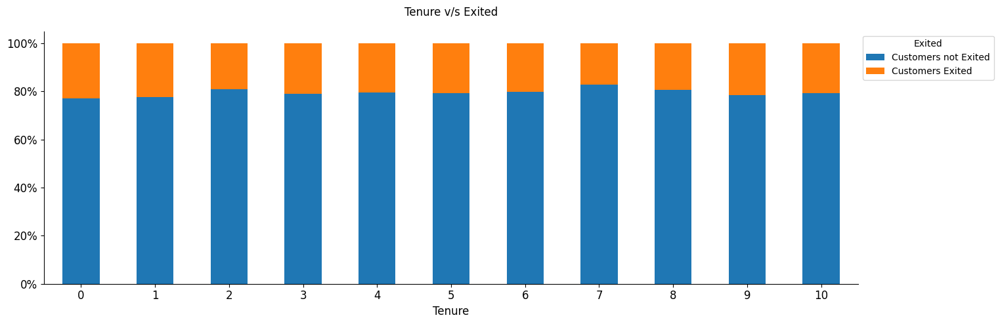

In [ ]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "Tenure", "Exited",
            column_mapping = mapping)
print("-" * 120)

stacked_barplot(data, "Tenure", "Exited",
                column_mapping = mapping) # Stached a Custom Barplot

**Observations**
- Customers with a tenure between 2 to 8 years show higher retention rates. However, those with 1 year or less and 9 to 10 years demonstrate comparatively higher attrition rates (more than 20%).
- Specifically, customers with less than one year with the bank have the highest attrition, while those with 7 years demonstrate the highest retention.

##### Exited Customers vs Number of products customers purchased from Bank (NumOfProducts)

╒═════════════════╤════════════════════════╤════════════════════╤═══════╕
│ Exited          │   Customers not Exited │   Customers Exited │   All │
│ NumOfProducts   │                        │                    │       │
╞═════════════════╪════════════════════════╪════════════════════╪═══════╡
│ 4               │                      0 │                 60 │    60 │
├─────────────────┼────────────────────────┼────────────────────┼───────┤
│ 3               │                     46 │                220 │   266 │
├─────────────────┼────────────────────────┼────────────────────┼───────┤
│ 2               │                   4242 │                348 │  4590 │
├─────────────────┼────────────────────────┼────────────────────┼───────┤
│ 1               │                   3675 │               1409 │  5084 │
├─────────────────┼────────────────────────┼────────────────────┼───────┤
│ All             │                   7963 │               2037 │ 10000 │
╘═════════════════╧════════════════════════╧════════════════════╧═══════╛

-------------------------------------------------------------------------------------------------------------------
-----

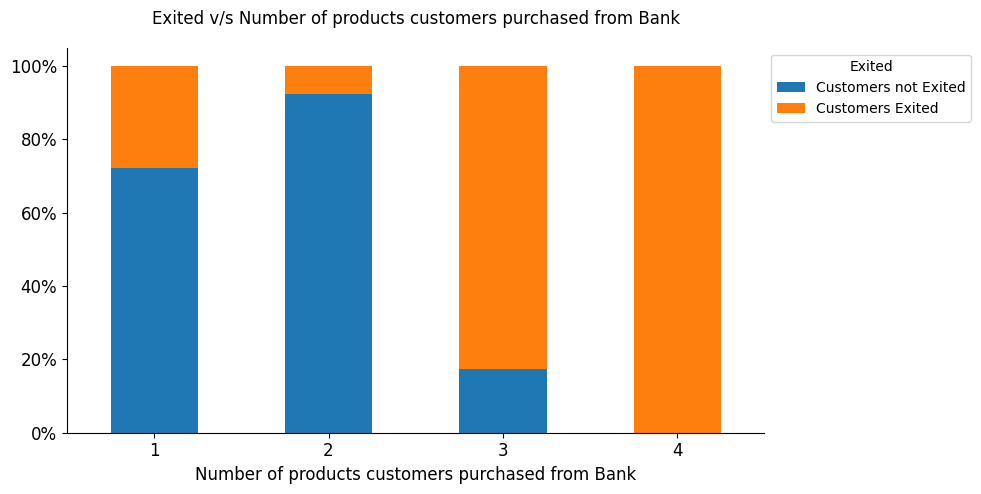

In [ ]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "NumOfProducts", "Exited",
            column_mapping = mapping)
print("-" * 120)

stacked_barplot(data, "NumOfProducts", "Exited",
                column_mapping = mapping,
                xlabel = "Number of products customers purchased from Bank",
                Title = "Exited v/s Number of products customers purchased from Bank") # Stached a Custom Barplot

**Observations**
- Customers using 1 or 2 products exhibit significantly higher retention rates. Specifically, customers using 2 products show the highest retention rate (over 90%), while those using 1 product have a retention rate of more than 70%.
- In contrast, attrition rates are notably higher among customers using 3 or 4 products. In fact, customers using 4 products have a 100% attrition rate, and those using 3 products experience attrition rates exceeding 80%.

##### Exited Customers vs Balance

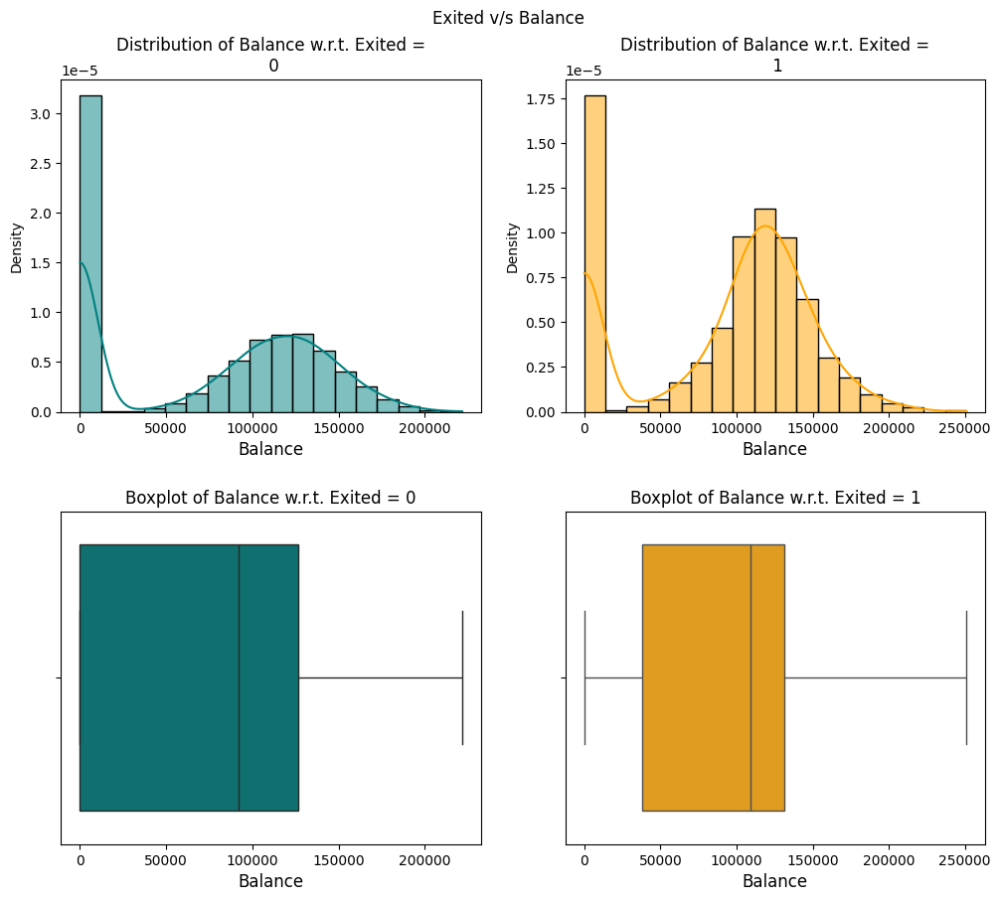

In [ ]:
# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Balance", "Exited", ked = True,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**
- The median balance of customers who left the bank is around 120,000, while the median balance of retained customers is close to 80,000, suggesting that customers with higher balances were more likely to leave the bank.
- Both groups of customers, those who left and those who stayed, include individuals with zero balance, but the proportion of zero-balance customers is significantly higher among exited customers. This emphasizes the importance of examining the distribution of customers who left relative to those who stayed among those with zero balances.

╒══════════════════╤════════════════════════╤════════════════════╤═══════╕
│ Exited           │   Customers not Exited │   Customers Exited │   All │
│ Balance Type     │                        │                    │       │
╞══════════════════╪════════════════════════╪════════════════════╪═══════╡
│ Zero balance     │                   3117 │                500 │  3617 │
├──────────────────┼────────────────────────┼────────────────────┼───────┤
│ Non-zero balance │                   4846 │               1537 │  6383 │
├──────────────────┼────────────────────────┼────────────────────┼───────┤
│ All              │                   7963 │               2037 │ 10000 │
╘══════════════════╧════════════════════════╧════════════════════╧═══════╛

-------------------------------------------------------------------------------------------------------------------
-----

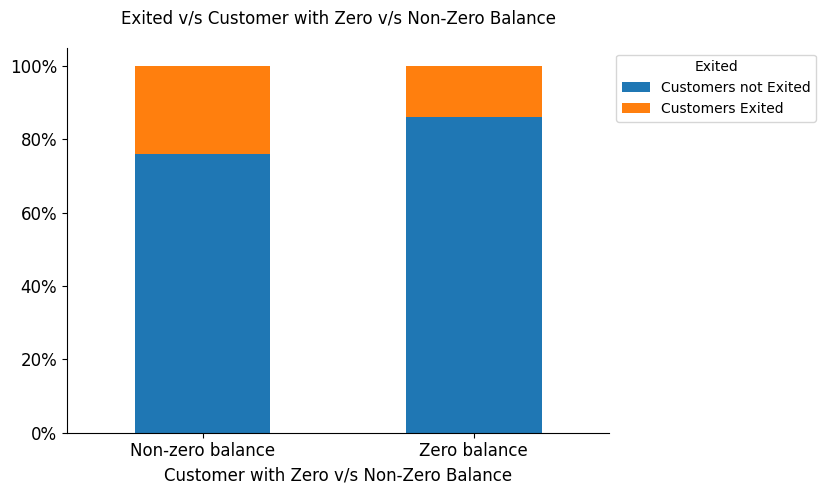

In [ ]:
# Create a new DataFrame with the additional column using method chaining
df = data.copy().assign(Balance_Type = data['Balance'].apply(lambda x: 'Zero balance' if x == 0 else 'Non-zero balance'))

# Print a table with data where predictor is on x column and target is stacked
print_table(df, "Balance_Type", "Exited", column_mapping = mapping)
print("-" * 120)

stacked_barplot(df, "Balance_Type", "Exited",
                column_mapping = mapping,
                xlabel = "Customer with Zero v/s Non-Zero Balance",
                Title = "Exited v/s Customer with Zero v/s Non-Zero Balance") # Stached a Custom Barplot

**Observations**
- As expected, the attrition rate is higher, at more than 20%, among customers with non-zero balances, whereas it is around 15% among customers with zero balances.

##### Exited vs Estimated Salary

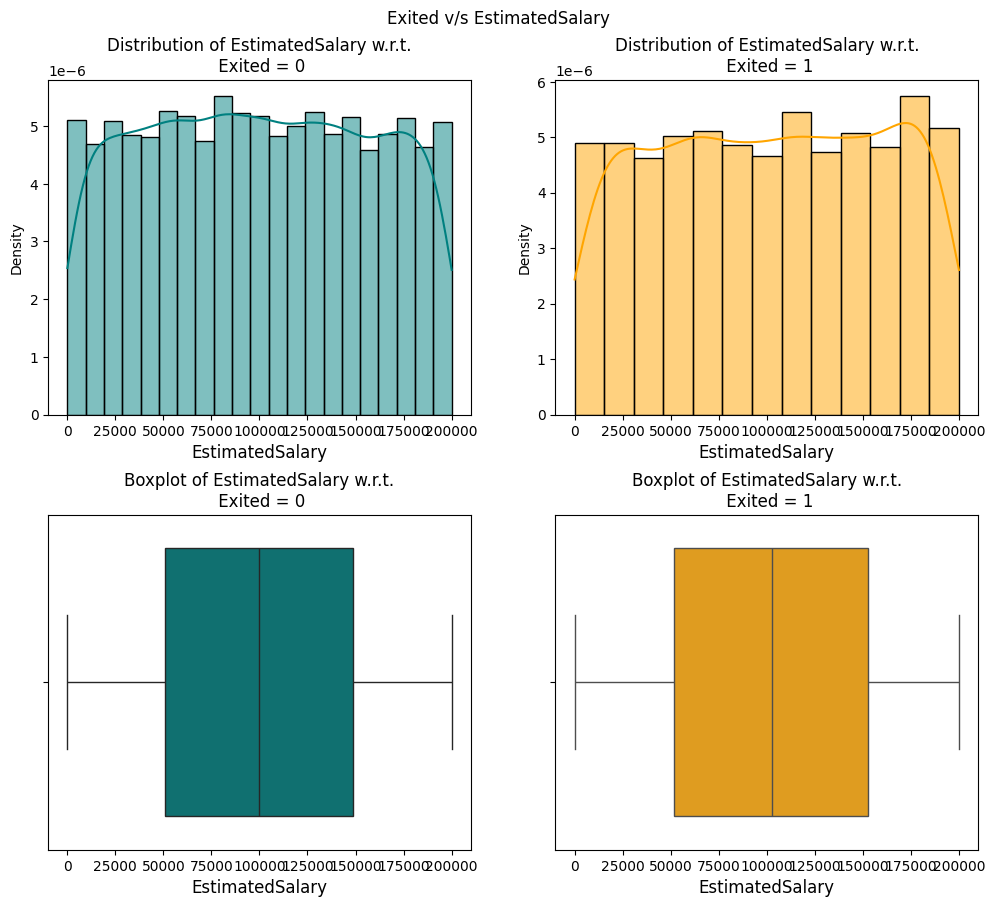

In [ ]:
# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "EstimatedSalary", "Exited", ked = True,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observations**
- The median Estimated Salary for both Exited and Retained customers is around \$100,000, suggesting that Estimated Salary does not appear to influence customer retention.
- Additionally, the distribution of Estimated Salary is similar for both groups of customers, indicating that salary alone may not be a determining factor in whether a customer stays or leaves the bank.


##### Exited vs Hold Credit Card (HasCrCard)

╒═════════════════════════╤════════════════════════╤════════════════════╤═══════╕
│ Exited                  │   Customers not Exited │   Customers Exited │   All │
│ HasCrCard               │                        │                    │       │
╞═════════════════════════╪════════════════════════╪════════════════════╪═══════╡
│ Do not hold Credit Card │                   2332 │                613 │  2945 │
├─────────────────────────┼────────────────────────┼────────────────────┼───────┤
│ Hold Credit Card        │                   5631 │               1424 │  7055 │
├─────────────────────────┼────────────────────────┼────────────────────┼───────┤
│ All                     │                   7963 │               2037 │ 10000 │
╘═════════════════════════╧════════════════════════╧════════════════════╧═══════╛

-------------------------------------------------------------------------------------------------------------------
-----

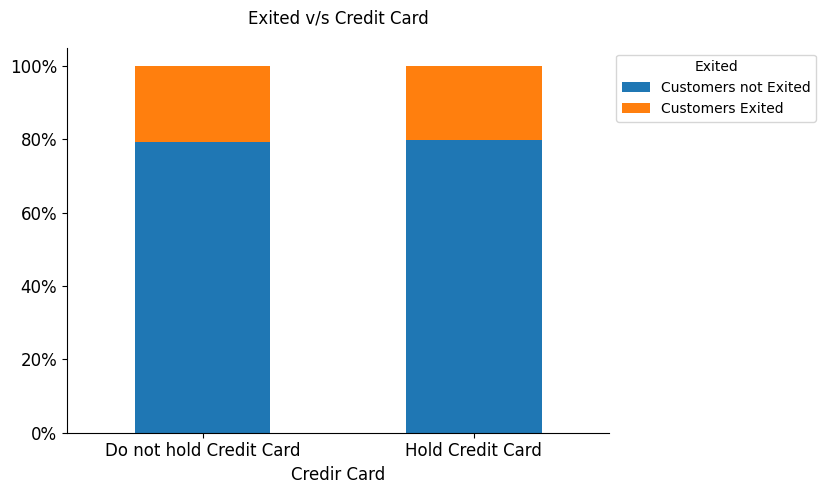

In [ ]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "HasCrCard", "Exited",
            column_mapping = mapping,
            index_mapping = cc_mapping,
            )
print("-" * 120)

stacked_barplot(data, "HasCrCard", "Exited",
                column_mapping = mapping,
                index_mapping = cc_mapping,
                xlabel = "Credir Card",
                Title = "Exited v/s Credit Card") # Stached a Custom Barplot

**Observations**
- The ratio of exited customers is approximately the same for both customers with and without credit cards

##### Exited vs Customer is active member of the Bank or not (isActiveMember)

╒═════════════════════════╤════════════════════════╤════════════════════╤═══════╕
│ Exited                  │   Customers not Exited │   Customers Exited │   All │
│ IsActiveMember          │                        │                    │       │
╞═════════════════════════╪════════════════════════╪════════════════════╪═══════╡
│ Hold Credit Card        │                   4416 │                735 │  5151 │
├─────────────────────────┼────────────────────────┼────────────────────┼───────┤
│ Do not hold Credit Card │                   3547 │               1302 │  4849 │
├─────────────────────────┼────────────────────────┼────────────────────┼───────┤
│ All                     │                   7963 │               2037 │ 10000 │
╘═════════════════════════╧════════════════════════╧════════════════════╧═══════╛

-------------------------------------------------------------------------------------------------------------------
-----

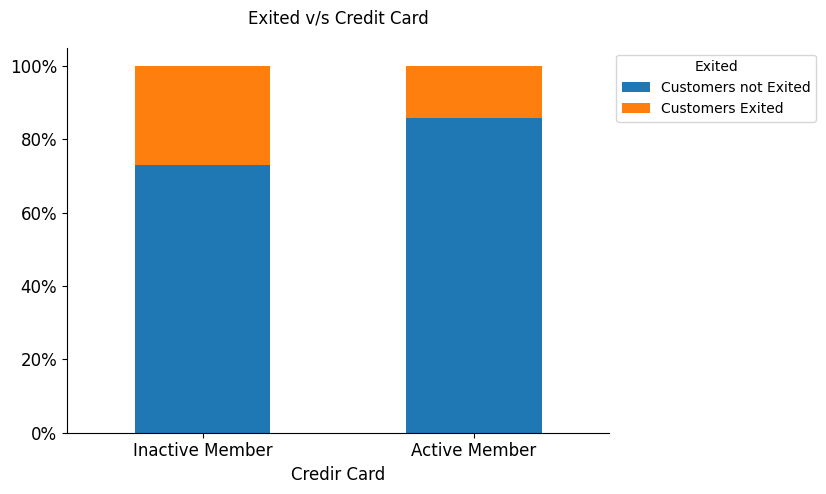

In [ ]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "IsActiveMember", "Exited",
            column_mapping = mapping,
            index_mapping = cc_mapping,
            )
print("-" * 120)

stacked_barplot(data, "IsActiveMember", "Exited",
                column_mapping = mapping,
                index_mapping = cust_activity_mapping,
                xlabel = "Credir Card",
                Title = "Exited v/s Credit Card") # Stached a Custom Barplot

**Observations**
- The attrition rate is higher, approximately 25%, among customers who have been inactive for more than 6 months, compared to around 15% for active customers.

## Data Preprocessing

### Outlier Detection

#### Define Useful functions

In [ ]:
# Function to display boxplots of numerical columns to check for outliers
def display_boxplots(data, whis = 1.5, title = None, figsize = (18, 8), color = "lightgreen"):
  # Identify numerical columns in the DataFrame
  numerical_columns = data.select_dtypes(include=[np.number]).columns

  # Create subplots for each numerical column
  fig, axs = plt.subplots(1, len(numerical_columns), figsize = figsize)

  # Loopthrough all the variables
  for i, variable in enumerate(numerical_columns):
    sns.boxplot(data[variable], whis = whis, ax = axs[i], color = color)  # Create a boxplot for each variable
    axs[i].set_title(variable.replace("_", " "))                          # Set the title of the Box plot
    axs[i].set_ylabel('')                                                 # Remove y-axis label

    # Calculate lower whisker, upper whisker, and number of outliers
    lower, upper = calculate_whiskers(data[variable])

    # get the outliers and get the counts of all the outliers
    outlier_count = get_outliers(data[variable], lower, upper).sum()
    percentage_outliers = "{:.2f}".format(outlier_count / len(data[variable]) * 100)      # Calculate % of Outliers

    # Add text with whisker information and outlier count to the plot
    text = (
        f"Lower Whisker: {lower:.2f}\n"
        f"Upper Whisker: {upper:.2f}\n"
        f"Number of outliers: {outlier_count}\n"
        f"% of outliers: {percentage_outliers}%"
    )
    # Add text to the plot
    axs[i].text(0.05, -0.11, text, fontsize = 10, ha = 'left', va = 'bottom', transform = axs[i].transAxes)

  fig.suptitle(title)                 # Set the title of the entire plot
  plt.subplots_adjust(wspace = 0.1)   # Adjust the spacing between subplots
  plt.tight_layout()                  # Adjust the layout to prevent overlapping of subplots
  plt.show()                          # Display the plot

In [ ]:
# Function to calculate whiskers
def calculate_whiskers(df):
    # Calculate quartiles
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)

    # Calculate IQR and whiskers
    IQR = Q3 - Q1
    lower_whisker = Q1 - 1.5 * IQR
    upper_whisker = Q3 + 1.5 * IQR

    # return the lower whisker and upper whisker after rounding to 2 decimal place
    return round(lower_whisker, 2), round(upper_whisker,2)

In [ ]:
# Function to get the outliers
def get_outliers(df, lower, upper):
    # return the outliers
    # Use bitwise OR operator (|) to combine the two conditions
    return ((df < lower) | (df > upper))

In [ ]:
# functions to treat outliers by flooring and capping
def treat_outliers(df, col):
    Lower, Upper = calculate_whiskers(df, col)      # identify the outliers

    # all the values smaller than Lower Whisker will be assigned the value of Lower
    # all the values greater than Upper Whisker will be assigned the value of Upper
    df[col] = np.clip(df[col], Lower, Upper)

    return df      # return the modified DataFrame

In [ ]:
# Function to treat outliers for all the columns
def treat_outliers_all(df, col_list):
  # Loop through each column in the list
  for c in col_list:
    df = treat_outliers(df, c)  # Treat outliers for the current column

  return df  # Return the modified DataFrame

#### Outlier Visualization

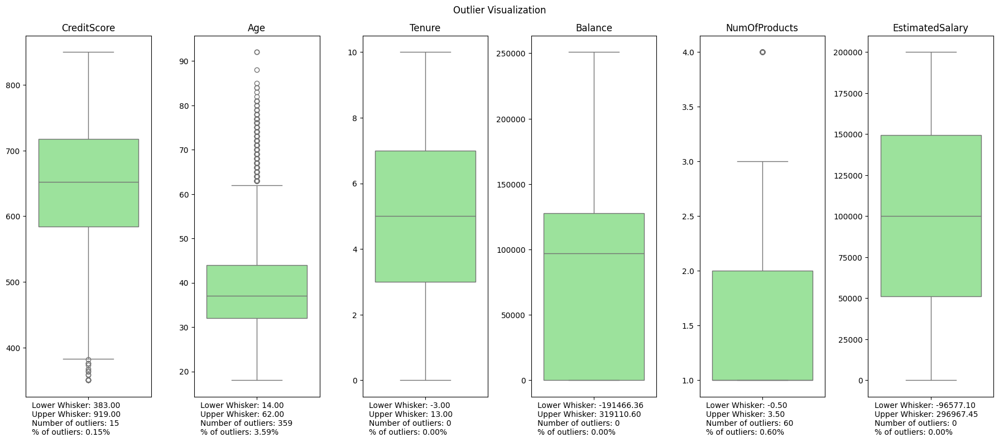

In [ ]:
# Display Boxplot of numerical columns with outliers
display_boxplots(data[['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary']], title = "Outlier Visualization")

**Observations**

The following columns contain outliers; however, they should not be adjusted as these data points represent real customer data.
- 'Age'
- 'CreditScore'
- 'NumOfProducts'

### Define Categorical Columns

In [ ]:
cat_cols = ["Geography","Gender"]                   # Define the Categorical Columns
data[cat_cols] = data[cat_cols].astype("category")  # Convert the Categorical Columns

### Label Encoding

In [ ]:
from sklearn.preprocessing import LabelEncoder  # Import LabelEncoder

# Encode the Gender Column
label_encoder = LabelEncoder()
data['Gender'] = label_encoder.fit_transform(data['Gender'])

### One Hot Encoding

In [ ]:
# One-Hot Encoding using Pandas
data = pd.get_dummies(data, columns=['Geography'], drop_first=True, dtype='int')

In [ ]:
# Check the dataset after Encoding
data.head()

,CreditScore,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_Germany,Geography_Spain
0,619,0,42,2,0.0000,1,1,1,101348.8800,1,0,0
1,608,0,41,1,83807.8600,1,0,1,112542.5800,0,0,1
2,502,0,42,8,159660.8000,3,1,0,113931.5700,1,0,0
3,699,0,39,1,0.0000,2,0,0,93826.6300,0,0,0
4,850,0,43,2,125510.8200,1,1,1,79084.1000,0,0,1


### Split the Data in Train, Test and Validation Set

In [ ]:

# Split the dataset into independent and dependent variables
X = data.drop(["Exited"], axis=1)
y = data["Exited"]

In [ ]:
# Import Library to tune different models
from sklearn.model_selection import train_test_split

random_state = 1  # Set a random state for reproducibility

# Function to split data into training, validation, and test sets
def split_data(X, y, test_size = 0.2, val_size  = 0.2, random_state = random_state):
  # Splitting data into training, validation, and test sets
  X_temp, X_test, y_temp, y_test = train_test_split(
     X, y, test_size = test_size, random_state = random_state, stratify = y
  )

  X_train, X_val, y_train, y_val = train_test_split(
     X_temp, y_temp, test_size=val_size/(1-test_size),  # Adjusting val_size to be a fraction of the training set
     random_state = random_state, stratify = y_temp
  )

  return X_train, X_val, X_test, y_train, y_val, y_test

In [ ]:
# Splitting data in train, validation and test sets
X_train, X_val, X_test, y_train, y_val, y_test = split_data(X, y, test_size = 0.15, val_size = 0.20, random_state = random_state)

# Print information about the split
print("Data split into:")
print("Train set:", X_train.shape, y_train.shape)
print("Validation set:", X_val.shape, y_val.shape)
print("Test set:", X_test.shape, y_test.shape)

Data split into:

Train set:
(6499, 11)
(6499,)

Validation set:
(2001, 11)
(2001,)

Test set:
(1500, 11)
(1500,)

### Sampling data

Applying SMOTE (Synthetic Minority Over-sampling Technique) to the training data to create a balanced dataset, which will be used to build a Neural Network model

In [ ]:
# Synthetic Minority Over Sampling Technique
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

sampling_strategy = 1  # Oversample the minority class by a factor of 1

# Perform sampling on the training data based on the specified sampling type
def sampling_data(X_train, y_train, sampling_type):
  """
  Parameters:   - X_train: Features of the training data
                - y_train: Labels of the training data
                - sampling_type: Type of sampling ("Over" for oversampling, "Under" for undersampling)
                - sampling_strategy: Sampling ratio for the minority class (default is 1, meaning no change)
  Returns:      - X_resampled: Resampled features
                - y_resampled: Resampled labels
  """
  # For Over Sampling apply Synthetic Minority Over Sampling Technique
  # For Under Sampling apply Random undersampler for under sampling the data
  sm = SMOTE(sampling_strategy = sampling_strategy, k_neighbors = 5, random_state = random_state
             ) if sampling_type == "Over" else RandomUnderSampler(
                 random_state = random_state, sampling_strategy = sampling_strategy
                 )
  x_train_sampled, y_train_sampled = sm.fit_resample(X_train, y_train)

  # Print the number of samples in the training and test datasets before and after applying Understampling techniques
  print(f"Before {sampling_type} Sampling, counts of label '1 - Existing Customers': {sum(y_train == 1)}")
  print(f"Before {sampling_type} Sampling, counts of label '0 - Attrited customers': {sum(y_train == 0)}\n")

  print(f"After {sampling_type} Sampling, counts of label '1 - Existing Customers': {sum(y_train_sampled == 1)}\n")
  print(f"After {sampling_type} Sampling, counts of label '0 - Attrited customers': {sum(y_train_sampled == 0)}\n")

  print(f"After {sampling_type} Sampling, the shape of train_X: {x_train_sampled.shape}")
  print(f"After {sampling_type} Sampling, the shape of train_y: {x_train_sampled.shape}\n")

  return x_train_sampled, y_train_sampled

In [ ]:
# Perform over sampling on the training data
X_train_over, y_train_over = sampling_data(X_train, y_train, sampling_type = "Over")

Before Over Sampling, counts of label '1 - Existing Customers': 1324

Before Over Sampling, counts of label '0 - Attrited customers': 5175

After Over Sampling, counts of label '1 - Existing Customers': 5175

After Over Sampling, counts of label '0 - Attrited customers': 5175

After Over Sampling, the shape of train_X: (10350, 11)

After Over Sampling, the shape of train_y: (10350, 11)

### Data Normalization

**Note** - Binary columns represent categorical information in a clear and interpretable manner with 0s and 1s. Normalizing them would change their fundamental meaning and could lead to incorrect interpretations by both humans and machine learning algorithms. Therefore, it's important to keep binary columns as they are, without normalization, to preserve their categorical nature and ensure accurate representation in data analysis and modeling tasks.

In [ ]:
from sklearn.preprocessing import StandardScaler  # Import the StandardScaler class

# Create an instance of the StandardScaler class
sc = StandardScaler()

# create a list of the columns should be Normalized
cols_list = ['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary']

X_train[cols_list] = sc.fit_transform(X_train[cols_list])           # Apply Normalization on Training Dataset
X_train_over[cols_list] = sc.fit_transform(X_train_over[cols_list]) # Apply Normalization on Training Oversampled Dataset

X_val[cols_list] = sc.transform(X_val[cols_list])                   # Apply Normalization on Validation Dataset
X_test[cols_list] = sc.transform(X_test[cols_list])                 # Apply Normalization on Test Dataset

## Model Building

### Model Evaluation Criterion

The model's predictions can be incorrect in two ways:

 - **False Positive (FP) or Type I Error**: Predicting that a customer will churn when they actually won't. This could lead to unnecessary retention efforts and costs.
 - **False Negative (FN) or Type II Error**: Predicting that a customer will not churn when they actually will. This could lead to loss of customers, which is potentially more harmful as retaining existing customers is generally more cost-effective than acquiring new ones.

**Prediction Focus**:
Given the business context where the cost of losing a customer is higher, the primary focus should be minimizing False Negatives (FN).

**Reducing False Negatives**:
To minimize False Negatives, we should aim to maximize the Recall score. High recall means fewer false negatives. This metric is useful if the cost of false negatives (losing customers) is high. Since losing a customer is more costly for a bank, recall becomes very important.

   **Recall (Sensitivity) = TP / (TP + FN)**

Where TP = True Positives (correctly predicted who will be exited)

However, we also need to ensure that Accuracy is reasonably high to avoid excessive costs from false positives.

   **Accuracy = (TP + TN) / (TP + FP + TN + FN)**

### Define useful functions

#### Define useful functions to Build Model

In [ ]:
# Import Important Libraries
import tensorflow as tf
from tensorflow import keras
from keras import backend
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.callbacks import EarlyStopping

# importing different functions to build models
def create_model(models, params):
    if params["model"] in models:
        del models[params["model"]]             # Delete the existing model if it exists

    clear_session()                             # Clear the Keras session to reset the state

    model = Sequential(name = params["model"])  # Initialize the Sequential model with a specific name

    for layer in params["layers"]:
      layer_type = next(iter(layer.keys()))     # Get the first key in the dictionary

      # Dynamically get the layer class from tf.keras.layers
      layer_class = getattr(tf.keras.layers, layer_type)
      model.add(layer_class(**layer[layer_type]))  # Add the layer to the model

    # Compile the model with the specified optimizer and loss function
    model.compile(**params["compile"])

    return model                                # Return the compiled model


In [ ]:
import random # Import the random module

def clear_session():
    backend.clear_session()
    #Fixing the seed for random number generators so that we can ensure we receive the same output everytime
    np.random.seed(2)
    random.seed(2)
    tf.random.set_seed(2)
    model = Sequential()  # Initialize the Sequential model

#### Define useful functions to Evaluate Performance

Let's start by developing a suite of reusable functions to assess model performance. This will enable us to efficiently calculate various metrics, such as confusion matrices and performance curves, without duplicating code for each model. By abstracting these calculations into separate functions, we can streamline our workflow and focus on model development and comparison.

##### Define useful functions for Confusion Matrix

In [ ]:
# Define
def set_cm_structure_param(Frame_Title = None, Frame_Size = 6, Frame_Fontsize = 14, Model_Fontsize = 14, Model_Annotsize = 12):
  # Parameters to create a confusion matrix
  # Define Titles of the Confusion Models
  cm_model_titles = {
    'Model_Titles':  [
        'Confusion Matrix on Training Dataset',
 'Confusion Matrix on Validation Dataset'
    ],
    'Frame_Title': 'Confusion Matrixes of ' if Frame_Title == None else Frame_Title,
    'Frame_Size': Frame_Size,
    'Frame_Fontsize': Frame_Fontsize,
    'Model_Fontsize': Model_Fontsize,
    'Model_Annotsize': Model_Annotsize,
  }
  return cm_model_titles

In [ ]:
# New function to create subplots and call the confusion_matrix_sklearn function multiple times
def plot_confusion_matrices_side_by_side(preds, targets, caption, titles, model_name = "Artificial Neural Network"):

    num_matrices = len(preds)
    fig, axes = plt.subplots(1, num_matrices, figsize =(titles['Frame_Size'] * num_matrices, titles['Frame_Size']))  # create subplots with 1 row and num_matrices columns
    cm_data = []

    # Loop through each subplot and plot the confusion matrix
    for i in range(num_matrices):
        plt.sca(axes[i])  # set current axis to the i-th subplot

        # call the confusion_matrix_sklearn function
        confusion_matrix_sklearn(preds[i], targets[i], caption,
                                 titles['Model_Titles'][i],
                                 titles['Model_Fontsize'],
                                 titles['Model_Annotsize'],
        )

    fig.suptitle((titles['Frame_Title'] + model_name), fontsize = titles['Frame_Fontsize'])  # set the title of the entire figure
    plt.tight_layout()
    plt.show()

In [ ]:
# importing metrics
from sklearn.metrics import confusion_matrix
# function to plot the confusion_matrix
def confusion_matrix_sklearn(pred, target, caption, title, fontsize = 12, annotsize = 12):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for binary classification
    title: title of the plot
    fontsize: font size of the plot
    """
    # predicting using the independent variables
    cm = confusion_matrix(target, pred)   # build the Confusion Matrix

    labels = np.asarray(                    # define the lebels for the Matrix
        [
            ["{0:0.0f}\n".format(item) + "{0:.2%}\n".format(item / cm.flatten().sum()) + caption[index]]
            for index, item in enumerate(cm.flatten())
        ]
    ).reshape(2, 2)

    # Define the frame and return the confusion Matrix plot
    sns.heatmap(cm, annot = labels, fmt="", annot_kws={"size": annotsize})     # plot the confusion matrix
    plt.ylabel("Actual Values", fontsize = fontsize)                          # set the y-axis label
    plt.xlabel("Predicted Values", fontsize = fontsize)                       # set the x-axis label
    plt.xticks([0.5, 1.5], ['Negative', 'Positive'])                    # set the x-axis tick labels
    plt.yticks([0.5, 1.5], ['Negative', 'Positive'], rotation = 90)       # set the y-axis tick labels
    plt.title(title, fontsize = fontsize)                                     # set the title of the plot
    return plt                                                          # Return the plot

##### Define useful functions to measure Performances Matrics

In [ ]:
# Evaluate multiple machine learning models
def evaluate_multiple_models(models, model_list, X_train, y_train, X_val, y_val, verbose = 0):
    """
    Parameters:   - models (dict): Dictionary of trained models.
                  - model_name_list (list): List of model names to evaluate.
                  - X_TRAIN (dict): Dictionary containing training data for each model.
                  - y_TRAIN (dict): Dictionary containing target labels for each model.
                  - X_val (array-like): Validation data.
                  - y_val (array-like): Validation labels.
    Returns:      - train_perf (dict): Dictionary of performance metrics on the training set.
                  - val_perf (dict): Dictionary of performance metrics on the validation set.
    """
    # Initialize dictionaries to store training and validation performance metrics
    train_perf_ , val_perf_ = {}, {}

    # Loop through all the models
    for name in model_list:
        # Evaluate the model on the training and validation sets
        # Set Threashold to Zero for binary Classification
        train_perf_[name] = model_performance_classification_sklearn(models[name], X_train, y_train, threshold = 0.5, verbose = verbose)
        val_perf_[name] = model_performance_classification_sklearn(models[name], X_val, y_val, threshold = 0.5, verbose = verbose)

    return train_perf_, val_perf_  # Return the training and validation performance metrics

In [ ]:
from sklearn.metrics import(          # Import the necessary libraries
    accuracy_score,
    recall_score,
    precision_score,
    f1_score,
)
# Function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target, threshold = False, verbose = 0):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for binary classification
    """
    # predicting using the independent variables
    # Use threshold for Binary Classification
    pred = prediction(model, predictors, threshold)

    # evaluating the model performance
    acc = accuracy_score(target, pred)          # to compute Accuracy
    recall = recall_score(target, pred)         # to compute Recall
    precision = precision_score(target, pred)   # to compute Precision
    f1 = f1_score(target, pred)                 # to compute F1-score

    # creating and return a dataframe of metrics
    return pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1 Score": f1},
        index=[0],
    )

In [ ]:
def classification_report(model, param, history, train_perf, val_perf, duration):

    units_list, activation_list = [], []  # Initialize lists to store units and activation for each layer
    weight_initializer = []               # Initialize list to store weight initializers
    weight_regularizer = []               # Initialize list to store weight regularizers
    hidden_layer = 0                      # Hidden Layers, initiate to 0

    #[<keras.src.regularizers.L2 object at 0x781550a923e0>, 'Dropout(0.02)', <keras.src.regularizers.L2 object at 0x781550a91d20>, 'Dropout(0.02)']

    # Loop through each layer in the model parameters
    for layer in param['layers']:
        # loop through all ther items in Layers
        for layer_type, layer_params in layer.items():
            if 'Dense' in layer_type: hidden_layer += 1                 # Count the Hidden Layers
            if 'units' in layer_params: units_list.append(layer_params['units'])
            if 'activation' in layer_params: activation_list.append(layer_params['activation'])
            if 'BatchNormalization' in layer_type: weight_regularizer.append('Batch_Normalization')     # Count the Hidden Layers
            if 'Dropout' in layer_type: weight_regularizer.append(f"Dropout({layer_params['rate']})")                # Set the Dropout Flag
            if 'kernel_initializer' in layer_params: weight_initializer.append(layer_params['kernel_initializer'])                    # Find Karnel Initializer
            if 'kernel_regularizer' in layer_params: weight_regularizer.append(f"l2({layer_params['kernel_regularizer'].l2:.4f})")

    # Remove duplicates from an array if all elements are same
    weight_initializer = ['GlorotUniform'] if len(weight_initializer) == 0 else remove_duplicates(weight_initializer)
    weight_regularizer = sorted(remove_duplicates(weight_regularizer))

    # Assuming dropout and rate are defined earlier in the code
    optimizer_name = model.optimizer.get_config()['name']
    learning_rate = str("{:.5f}".format(model.optimizer.get_config()['learning_rate']))
    momentum = model.optimizer.get_config().get('momentum', '-')

    # Prepare the data for the DataFrame row
    data = {
        'Model': param['model'],
        'Model Name': param['model_name'],
        'Hidden Layers': (hidden_layer - 1),  # Remove the output layer
        'Units': str(units_list[:-1]),
        'Activation': str(activation_list[:-1]),
        'Weight Initializer': str(weight_initializer),
        'Weight Regularizer': "-" if len(weight_regularizer) == 0 else str(weight_regularizer),
        'Epochs': param['fit']['epochs'],
        'Batch Size': param['fit']['batch_size'],
        'Optimizer, Learning Rate, Momentum':str(f"[{optimizer_name},{learning_rate},{momentum}]"),
        'Duration (Sec)': duration,
        'Train Loss': history.history["loss"][-1],
        'Validation Loss': history.history["val_loss"][-1],
        'Train Recall': train_perf['Recall'][0],
        'Validation Recall': val_perf['Recall'][0],
        'Train Precision': train_perf['Precision'][0],
        'Validation Precision': val_perf['Precision'][0],
        'Train Accuracy': train_perf['Accuracy'][0],
        'Validation Accuracy': val_perf['Accuracy'][0],
        'Train F1 Score': train_perf['F1 Score'][0],
        'Validation F1 Score': val_perf['F1 Score'][0],
    }

    # Create and return a DataFrame with a single row
    return pd.DataFrame(data, columns = data.keys(), index=[0])

In [ ]:
def prediction (model, predictors, threshold = False, verbose = 0):
    # predicting using the independent variables
    # Use threshold for Binary Classification
    return model.predict(predictors, verbose = verbose) if not threshold else (model.predict(predictors, verbose = verbose) > threshold)

In [ ]:
def remove_duplicates(array):
    return list(set(array))

##### Define useful functions to measure Performance Curves

In [ ]:
# importing metrics
from sklearn.metrics import roc_curve

# Function to compute different metrics to check performance of a classification model built using sklearn
def calculate_roc_curve(target, probs):
    """Compare machine learning model to baseline performance.
    Computes statistics and shows ROC curve."""

    # Calculate false positive rates and true positive rates for the ROC curves
    base_fpr, base_tpr, _ = roc_curve(target, [1 for _ in range(len(target))])
    model_fpr, model_tpr, _ = roc_curve(target, probs)

    # return a dictionary containing the false positive rates and true positive rates for the baseline and the model
    return {"base_fpr": base_fpr, "base_tpr": base_tpr, "model_fpr": model_fpr, "model_tpr": model_tpr}

In [ ]:
def calculate_CAP(y_true, y_score):
    """Calculate the Cumulative Accuracy Profile (CAP) curve."""

    # Combine true labels and predicted scores
    combined = np.array(sorted(zip(y_score, y_true), reverse=True))

    total_positives = np.sum(y_true)            # Total positive instances
    total_instances = len(y_true)               # Total instances
    cum_positives = np.cumsum(combined[:, 1])   # Cumulative sum of positive instances

    # Cumulative percentage of total instances
    cum_percent_instances = np.arange(1, total_instances + 1) / total_instances

    # Calculate CAP curve
    CAP_x = cum_percent_instances
    CAP_y = cum_positives / total_positives

    return {"base_fpr": [0,1], "base_tpr": [0,1], "model_fpr": CAP_x, "model_tpr": CAP_y}

#### Define useful functions for display purposes

In [ ]:
def plot(data, param = {
                          'title':"",
                          'xlabel':"x axis",
                          'ylabel': "y axis",
                          'color': ['b', 'g'],
                          'linestyle': ['-', '-'],
                          'marker': ['o','s'],
                          'legend':[],
                          'legend_loc':'best'
                        },
          ):
    for i, d in enumerate(data):
      plt.plot(*d, color = param['color'][i], label = param['label'][i], linestyle = param['linestyle'][i], marker = param['marker'][i] )

    plt.title(param['title'])    # Set the title of the plot
    plt.xlabel(param['xlabel'])  # Set the x-axis label to 'Epoch'
    plt.ylabel(param['ylabel'])  # Set the y-axis label to the metric being plotted
    plt.legend(loc = param['legend_loc'])  # Add a legend to the plot

    # Hide the top and right spines (borders)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

    return plt  # Return the plot

In [ ]:
def plot_side_by_side(plots, plot_data, params,
                      title = None,
                      figsize = (15, 6),
                      fontsize = 14,
                      ):
    """Plot two plots side by side."""
    # Check if at least two plots are provided
    if len(plots) < 2:
        raise ValueError("At least two plots are required")

    # Create a figure and a set of subplots
    fig, axs = plt.subplots(1, len(plots), figsize = figsize)  # Create a figure and a set of subplots

    for i, (ax, plot_func, data, param) in enumerate(zip(axs, plots, plot_data, params)):
        plt.sca(ax)  # Set the current axes to the subplot's axis
        plot_func(data, param)  # Call the plot function with the axis

    fig.suptitle(title, fontsize = fontsize, y = 1.05)  # Assign a suitable title to the plot
    fig.subplots_adjust(wspace = 0.3)  # Add some space between the subplots
    plt.show()  # Show the plot


In [ ]:
def print_model_summary(model, param):

  model.summary()  # Print the model summary

  print(f"Epoch: {param['fit']['epochs']}")               # Print the Loss Function
  print(f"Batch Size: {param['fit']['batch_size']}")       # Print the Optimizer
  print(f"Optimizer: {param['compile']['optimizer'].__class__.__name__}")   # Print the Optimizer
  print(f"Loss function: {param['compile']['loss'].__name__}")     # Print the Loss Function
  print(f"Metrics: {param['compile']['metrics'][0].__class__.__name__}\n")  # Print the Metrics

#### Define Constants and Variables

In [ ]:
# Define metadata of the model performance matrics
Loss_Matrics = {
    # Loss Matric
        'type' : 'Loss',                               # Type of the Curve
        'title': 'Training v/s Validation Loss',       # Title of the Loss Curve
        'xlabel': 'Epoch',                             # Label for the x-axis
        'ylabel': 'Loss',                              # Label for the y-axis
        'color': ['b', 'g'],                           # Define the Color
        'linestyle': ['-', '-'],                       # Define the Linestyle
        'marker': [None, None],                        # Define the Marker
        'label': ['Train', 'Validation'],              # Define the Legend
        'legend_loc': 'best',                          # Define the Legend Location
}

In [ ]:
Recall_Matrics = {
    # Recall Matric
        'type' : 'Recall',                             # Type of the Curve
        'title': 'Training v/s Validation Recall',     # Title of the Recall Curve
        'xlabel': 'Epoch',                             # Label for the x-axis
        'ylabel': 'Recall',                            # Label for the y-axis
        'color': ['b', 'm'],                           # Define the Color
        'linestyle': ['-', '-'],                       # Define the Linestyle
        'marker': [None, None],                        # Define the Marker
        'label': ['Train', 'Validation'],              # Define the Legend
        'legend_loc': 'upper right',                   # Define the Legend Location
}

In [ ]:
# Define metadata for Receiver Operating Characteristic (ROC) Curve
ROC_curve_metadata = ({
    # ROC Curve of Training Dataset
        'type' : 'ROC_Training_Data',                             # Type of the Curve
        'title': 'ROC Curve of Training Data',                    # Title of the Loss Curve
        'xlabel': 'False Positive Rate (Specificity -1)',         # Label for the x-axis
        'ylabel': 'True Positive Rate (Sensitivity)',             # Label for the y-axis
        'color': ['b', 'r'],                                      # Define the Color
        'linestyle': ['--', '-'],                                 # Define the Linestyle
        'marker': [None, None],                                       # Define the Marker
        'label': ['Baseline', 'Model'],                           # Define the Legend
        'legend_loc': 'lower right',                              # Define the Legend Location
},
{
    # ROC Curve of Validation Dataset
        'type' : 'ROC_Validation_Data',                           # Type of the Curve
        'title': 'ROC Curve of Validation Data',                  # Title of the CAP plot
        'xlabel': 'False Positive Rate (Specificity -1)',         # Label for the x-axis
        'ylabel': 'True Positive Rate (Sensitivity)',             # Label for the y-axis
        'color': ['b', 'r'],                                      # Define the Color
        'linestyle': ['--', '-'],                                 # Define the Linestyle
        'marker': [None, None],                                       # Define the Marker
        'label': ['Baseline', 'Model'],                           # Define the Legend
        'legend_loc': 'lower right',                              # Define the Legend Location
})

In [ ]:
# Define metadata for Cumulative Accuracy Profile (CAP) Curve
CAP_curve_metadata = ({
    # CAP Curve of Training Dataset
        'type' : 'CAP_Training_Data',                       # Type of the Curve
        'title': 'CAP Curve of Training Data',              # Title of the Loss Curve
        'xlabel': 'Number of Observations',                 # Label for the x-axis
        'ylabel': 'Cumulative Accuracy',                    # Label for the y-axis
        'color': ['b', 'm'],                                # Define the Color
        'linestyle': ['--', '-'],                           # Define the Linestyle
        'marker': [None, None],                                 # Define the Marker
        'label': ['Random Model', 'Model'],                 # Define the Legend
        'legend_loc': 'lower right',                        # Define the Legend Location
},
{
    # CAP Curve of Validation Dataset
        'type' : 'CAP_Validation_Data',                     # Type of the Curve
        'title': 'CAP Curve of Validation Data',            # Title of the CAP plot
        'xlabel': 'Number of Observations',                 # Label for the x-axis
        'ylabel': 'Cumulative Accuracy',                    # Label for the y-axis
        'color': ['b', 'm'],                                # Define the Color
        'linestyle': ['--', '-'],                           # Define the Linestyle
        'marker': [None, None],                             # Define the Marker
        'label': ['Random Model', 'Model'],                 # Define the Legend
        'legend_loc': 'lower right',                        # Define the Legend Location
})

In [ ]:
model_sequence = 0                      # Define a sequence for all the models

model_parameters = {}                   # Initialize empty Dictionary to hold model parameters
models = {}                             # Initialize empty Dictionary to hold models
history = {}                            # Initialize empty Dictionary to hold training history
train_perf, val_perf = {}, {}           # Initialize empty dictionary to store training and validation performance metrics
y_train_pred, y_val_pred = {}, {}       # Initialize empty dictionary to store training and validation predictions
train_loss,  val_loss = {}, {}          # Initialize empty list to store training and validation loss
train_recall,  val_recall = {}, {}      # Initialize empty list to store training and validation recall

In [ ]:
# Column names of Result dataset
columns = ['Model', 'Model Name', 'Hidden Layers', 'Units', 'Activation', 'Epochs', 'Batch Size', 'Weight Initializer', 'Weight Regularizer',
           'Optimizer, Learning Rate, Momentum','Duration (Sec)',
           'Train Loss', 'Validation Loss',
           'Train Recall', 'Validation Recall',
           'Train Precision', 'Validation Precision',
           'Train Accuracy', 'Validation Accuracy',
           'Train F1 Score', 'Validation F1 Score',
           ]

# Initialize empty DataFrame to store the results
# Set the model name as index
results = pd.DataFrame(columns = columns)

In [ ]:
# Define heading of Dataframe which will capture the performance parameter against different Models
perf_column = ['Recall', 'Precision', 'Accuracy','F1 Score']
# Define heading of Pivot table display the Performance comparison Matrix
display_perf_columns = ['Model', 'Set'] + perf_column

In [ ]:
# Define the caption of confusion Matrix
cm_caption = (
            "True Negative (TN)",
            "False Positive (FP)\n Type I Error",
            "False Negative (FN) \n Type II Error",
            "True Positive (TP)",
            )

### Neural Network with SGD Optimizer

We will design and train a Neural Network model using the **Stochastic Gradient Descent (SGD)** optimizer. We'll explore different combinations of epochs and batch sizes to optimize its performance.

#### **Model 1**

**Model 1**: Build a model with following hyperparameters:
 - Hidden layers = 2
 - epochs = 10
 - Batch Size = Batch mode (Batch Size equal to total Dataset)
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (suitable for classification problems)
 - Optimizer = SGD (Stochastic Gradient Descent)

In [ ]:
# Import the necessary libraries
from keras.optimizers import SGD
from keras.metrics import Recall
from keras.losses import binary_crossentropy

# Define hyperparameters
model_name = "NN with SGD Optimizer"      # Define the model name
model = "Model_1"                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": SGD(),                                           # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 10,                                                # Number of training epochs
                "batch_size" : X_train.shape[0],                              # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with SGD Optimizer (Model_1):

Model: "Model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 10

Batch Size: 6499

Optimizer: SGD

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
import time  # Import the time module

print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset
history[model] = models[model].fit(X_train, y_train,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with SGD Optimizer (Model_1)...

Epoch 1/10
1/1 [==============================] - 1s 1s/step - loss: 0.6837 - recall: 0.4486 - val_loss: 0.6880 - val_recall: 0.4668
Epoch 2/10
1/1 [==============================] - 0s 57ms/step - loss: 0.6790 - recall: 0.4245 - val_loss: 0.6831 - val_recall: 0.4349
Epoch 3/10
1/1 [==============================] - 0s 54ms/step - loss: 0.6744 - recall: 0.3950 - val_loss: 0.6784 - val_recall: 0.4103
Epoch 4/10
1/1 [==============================] - 0s 74ms/step - loss: 0.6700 - recall: 0.3625 - val_loss: 0.6739 - val_recall: 0.3636
Epoch 5/10
1/1 [==============================] - 0s 57ms/step - loss: 0.6657 - recall: 0.3323 - val_loss: 0.6694 - val_recall: 0.3391
Epoch 6/10
1/1 [==============================] - 0s 76ms/step - loss: 0.6615 - recall: 0.3157 - val_loss: 0.6651 - val_recall: 0.3292
Epoch 7/10
1/1 [==============================] - 0s 57ms/step - loss: 0.6574 - recall: 0.2900 - val_loss: 0.6609 - val_recall: 0.2973
Epoch 8/10
1/1 [==============================] - 0s 78ms

Training Completed for NN with SGD Optimizer (Model_1). Total Time taken: 3.00 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train, y_train, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922


**The loss and recall plots provided offer insights into the model's performance during training and validation**

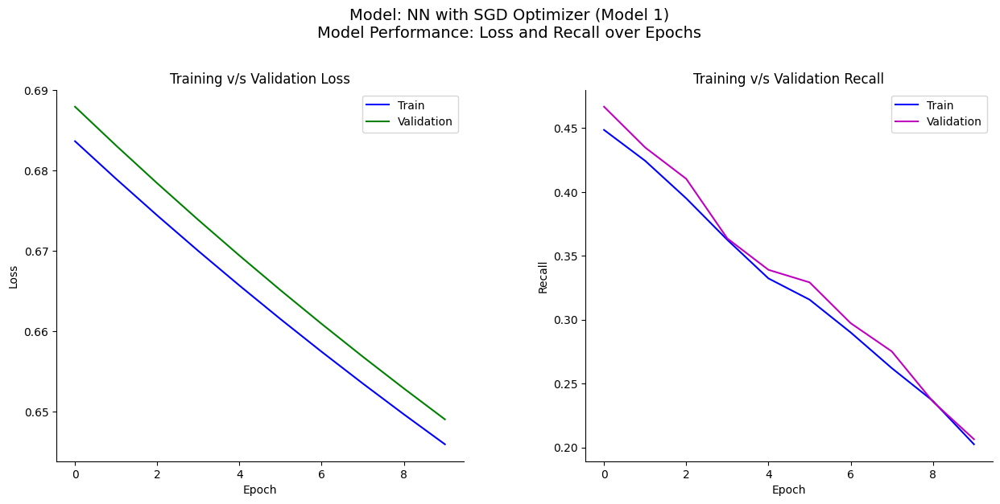

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model], val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model],val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

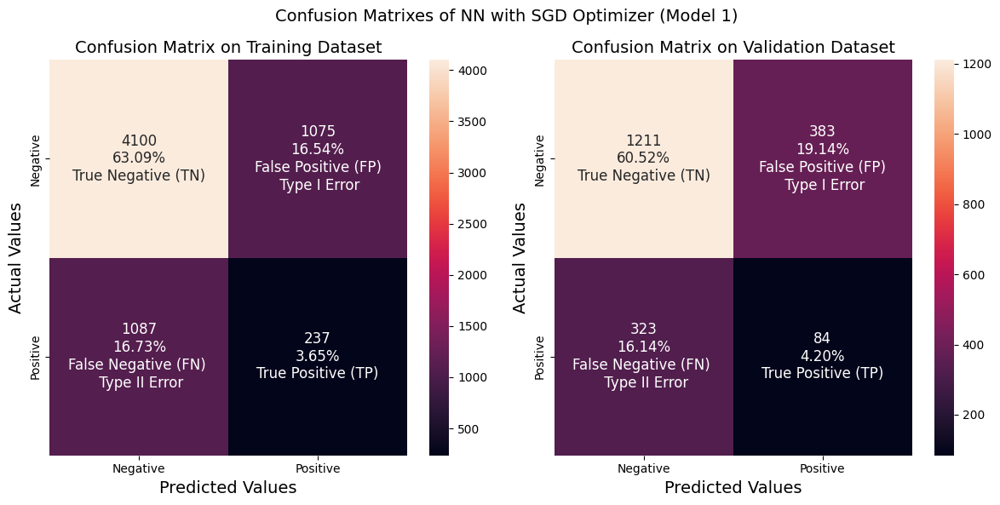

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

# Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observations**:

- **Loss**: Both training and validation losses consistently decrease, indicating effective error minimization throughout training.
- **Recall**: Over epochs, there is a noticeable decline in recall for both training and validation datasets, suggesting a deterioration in the model's ability to correctly identify positives.
- **Precision**: The low value of Precision for both training and validation dataset suggest the model struggles with correctly classifying positive instances, potentially leading to more false positives or a lower proportion of true positives among its predictions.

- **Accuracy**: Training and validation accuracies hover around 0.65, indicating the model's consistent performance across both datasets. However, there remains room for enhancement.
-**Confusion Matrix**: The model is experiencing high rates of both False Positives (Type I error) and False Negatives (Type II error), indicating a need for further performance tuning to improve its accuracy and reduce errors.

**Recommendation**:
- A small discrepancy between training and validation metrics indicates a minor case of overfitting.
- However, to address the decline in recall performance across epochs, additional investigation and hyperparameter tuning are necessary. The decline in recall may be attributed to noise in the data or underfitting, which requires further exploration to resolve.
- Let's explore adjusting the number of Epochs and Batch Size to optimize performance.

#### **Model 2**

**Model 2**: Build with epochs hyperparameters set to 50 and batch size 32:
 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (suitable for classification problems)
 - Optimizer = SGD (Stochastic Gradient Descent)

In [ ]:
# Define hyperparameters
model_name = "NN with SGD Optimizer"      # Define the model name
model = "Model_2"                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": SGD(),                                           # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 32,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with SGD Optimizer (Model_2):

Model: "Model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 32

Optimizer: SGD

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset
history[model] = models[model].fit(X_train, y_train,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with SGD Optimizer (Model_2)...

Epoch 1/50
204/204 [==============================] - 1s 4ms/step - loss: 0.5339 - recall: 0.0249 - val_loss: 0.4888 - val_recall: 0.0000e+00
Epoch 2/50
204/204 [==============================] - 1s 3ms/step - loss: 0.4743 - recall: 0.0000e+00 - val_loss: 0.4602 - val_recall: 0.0025
Epoch 3/50
204/204 [==============================] - 1s 3ms/step - loss: 0.4521 - recall: 0.0106 - val_loss: 0.4433 - val_recall: 0.0172
Epoch 4/50
204/204 [==============================] - 1s 4ms/step - loss: 0.4375 - recall: 0.0574 - val_loss: 0.4278 - val_recall: 0.0811
Epoch 5/50
204/204 [==============================] - 1s 3ms/step - loss: 0.4269 - recall: 0.1246 - val_loss: 0.4192 - val_recall: 0.0983
Epoch 6/50
204/204 [==============================] - 1s 5ms/step - loss: 0.4182 - recall: 0.1601 - val_loss: 0.4106 - val_recall: 0.1204
Epoch 7/50
204/204 [==============================] - 1s 6ms/step - loss: 0.4104 - recall: 0.1918 - val_loss: 0.4016 - val_recall: 0.1744
Epoch 8/50
204/204 [======

Training Completed for NN with SGD Optimizer (Model_2). Total Time taken: 34.42 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train, y_train, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425


**The training and validation data reveal the following insights after increasing the epoch to 50 and batch size to 32**

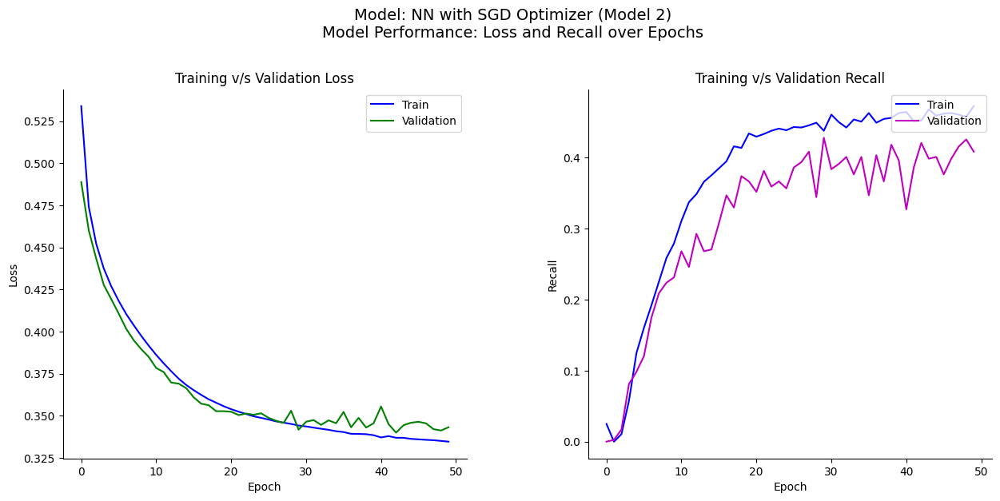

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

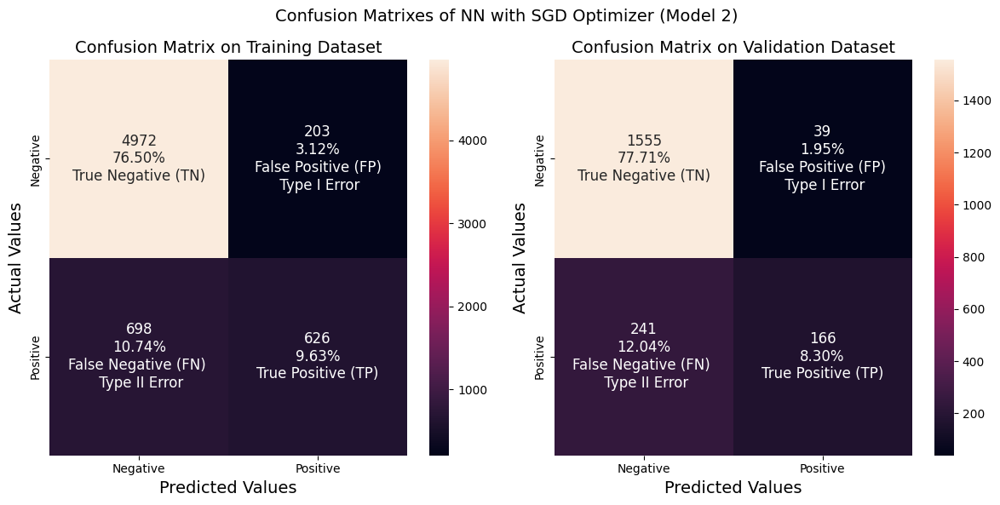

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observations**:

- **Loss**: The training and validation losses initially exhibited a steady decline, indicating successful error minimization. However, after 30 epochs, the validation loss began to fluctuate, suggesting potential overfitting. This oscillation may indicate that the model is becoming too specialized to the training data and losing its ability to generalize effectively to new data.

- **Recall**: During training, recall consistently improves, but validation recall exhibits oscillatory behavior after 10 epochs. The fluctuation in validation recall, combined with the growing disparity between training and validation recall, suggests that the model is overfitting to the training data.

- **Precision**: The significant increase in Precision for both the training and validation sets suggests that the model is performing well in accurately identifying true positives (actual positive cases) among all predicted positive instances, indicating a reasonable level of precision in its predictions.

- **Accuracy**: Achieving high accuracy (exceeding 80%) on both the training and validation datasets, with a narrow gap between the two, suggests excellent generalization capabilities of the models.

- **Confusion Matrix**: The model has achieved significant reductions in both Type I (False Positive) and Type II (False Negative) error rates. However, this model is primarily designed to minimize Type I errors, which does not align with our evaluation criteria for reducing Type II errors.

**Recommendation**:
- To address the overfitting issue, the model requires further optimization.

#### **Model 3**

**Model 3**: Build with epochs 100 and batch size 32:
 - Hidden layers = 2
 - epochs = 100
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = SGD (Stochastic Gradient Descent)

In [ ]:
# Define hyperparameters
model_name = "NN with SGD Optimizer"      # Define the model name
model = "Model_3"                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": SGD(),                                           # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 100,                                                # Number of training epochs
                "batch_size" : 32,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with SGD Optimizer (Model_3):

Model: "Model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 100

Batch Size: 32

Optimizer: SGD

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset
history[model] = models[model].fit(X_train, y_train,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with SGD Optimizer (Model_3)...

Epoch 1/100
204/204 [==============================] - 2s 6ms/step - loss: 0.5339 - recall: 0.0249 - val_loss: 0.4888 - val_recall: 0.0000e+00
Epoch 2/100
204/204 [==============================] - 1s 4ms/step - loss: 0.4743 - recall: 0.0000e+00 - val_loss: 0.4602 - val_recall: 0.0025
Epoch 3/100
204/204 [==============================] - 1s 4ms/step - loss: 0.4521 - recall: 0.0106 - val_loss: 0.4433 - val_recall: 0.0172
Epoch 4/100
204/204 [==============================] - 1s 4ms/step - loss: 0.4375 - recall: 0.0574 - val_loss: 0.4278 - val_recall: 0.0811
Epoch 5/100
204/204 [==============================] - 1s 4ms/step - loss: 0.4269 - recall: 0.1246 - val_loss: 0.4192 - val_recall: 0.0983
Epoch 6/100
204/204 [==============================] - 1s 3ms/step - loss: 0.4182 - recall: 0.1601 - val_loss: 0.4106 - val_recall: 0.1204
Epoch 7/100
204/204 [==============================] - 1s 3ms/step - loss: 0.4104 - recall: 0.1918 - val_loss: 0.4016 - val_recall: 0.1744
Epoch 8/100
204/204

Training Completed for NN with SGD Optimizer (Model_3). Total Time taken: 66.31 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train, y_train, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416


**The performance of the new model with epochs size 100 during training and validation**

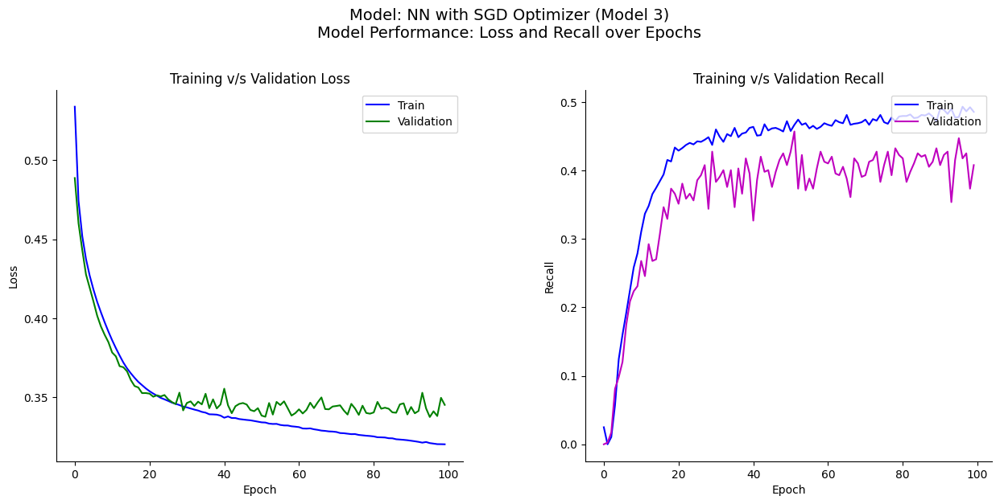

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

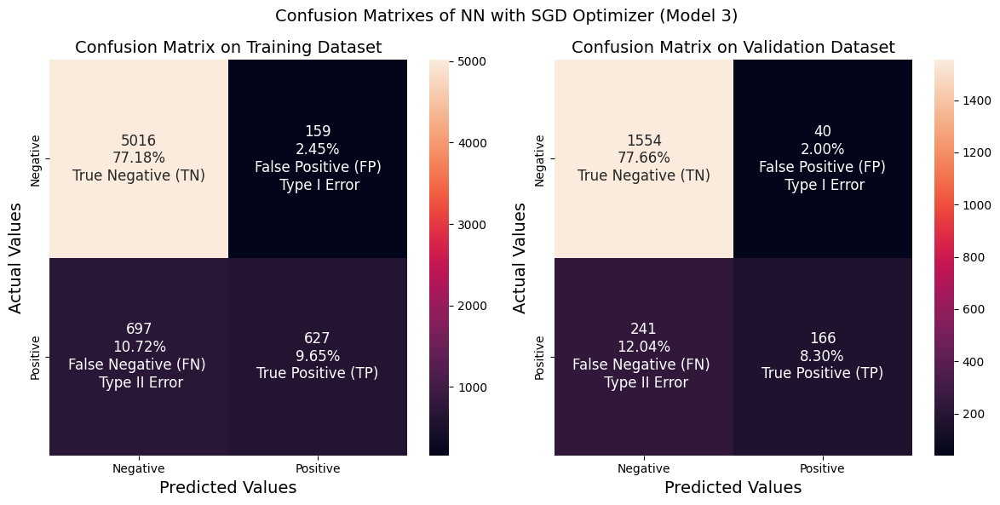

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observations**:

- **Loss**: During training, the training loss consistently decreases, indicating effective model learning. However, the validation loss exhibits irregular behavior and diverges from the training loss after 20 epochs, suggesting potential overfitting issues.

- **Recall**: The model's training recall improves steadily, indicating effective learning. However, the validation recall exhibits oscillatory behavior and diverges from the training recall, suggesting an overfitting issue. The oscillations in validation recall also suggest that the model is not able to consistently predict well on unseen data, further reinforcing the overfitting concern.

- **Precision**: Like privious model, the Precision for both training and validation datasets remains consistently high, indicating that the model excels at accurately identifying true positives. The similarity in values between the two datasets suggests that the model generalizes well and maintains its predictive accuracy across different datasets, demonstrating its robust performance.

- **Accuracy**: High accuracy (exceeding 80%) on both the training and validation datasets achieived suggests excellent generalization capabilities of the models.

- **Confusion Matrix**: The Confusion Matrix of this model exhibits similar performance characteristics to the previous model, indicating a consistent trend in its predictive capabilities, which prioritizes minimizing Type I errors.

**Recommendation**:
- This model's performance is comparable to the previous model, indicating that simply increasing the number of epochs alone will not lead to further improvements. Instead, additional hyperparameter tuning is necessary.

#### **Conclusion**

- The neural network model with Neural Network with SGD Optimizer for bank churn analysis demonstrates a sound initial approach with a standard architecture and optimizer. While the loss curves suggest good model training without overfitting, the recall metric indicates the need for further tuning.
- The confusion matrices of the last two models indicate a tendency to reduce Type I error, which does not align with the model evaluation criteria.
- Improving model performance requires tweaking the optimizer and hyperparameters, addressing class imbalance, and enforcing regularization.

## Model Performance Improvement

### Neural Network with Adam Optimizer

We will design and train a Neural Network model using the **Adam (Adaptive Moment Estimation)** optimizer. We'll explore different combinations of epochs and batch sizes to optimize its performance.

#### **Model 4**

**Model 4**: Build a model with following hyperparameters to improve the performance:
 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Output layer with 1 nodes
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)

In [ ]:
from keras.optimizers import Adam
# Define hyperparameters
model_name = "NN with Adam Optimizer"     # Define the model name
model = "Model_4"                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(),                                          # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 32,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with Adam Optimizer (Model_4):

Model: "Model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 32

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
import time
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset
history[model] = models[model].fit(X_train, y_train,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with Adam Optimizer (Model_4)...

Epoch 1/50
204/204 [==============================] - 2s 4ms/step - loss: 0.4505 - recall: 0.1178 - val_loss: 0.3930 - val_recall: 0.2334
Epoch 2/50
204/204 [==============================] - 1s 3ms/step - loss: 0.3789 - recall: 0.3369 - val_loss: 0.3593 - val_recall: 0.4373
Epoch 3/50
204/204 [==============================] - 1s 3ms/step - loss: 0.3578 - recall: 0.4366 - val_loss: 0.3608 - val_recall: 0.2998
Epoch 4/50
204/204 [==============================] - 1s 4ms/step - loss: 0.3502 - recall: 0.4335 - val_loss: 0.3472 - val_recall: 0.4275
Epoch 5/50
204/204 [==============================] - 1s 4ms/step - loss: 0.3478 - recall: 0.4615 - val_loss: 0.3445 - val_recall: 0.4152
Epoch 6/50
204/204 [==============================] - 1s 4ms/step - loss: 0.3424 - recall: 0.4600 - val_loss: 0.3446 - val_recall: 0.4005
Epoch 7/50
204/204 [==============================] - 1s 4ms/step - loss: 0.3401 - recall: 0.4600 - val_loss: 0.3382 - val_recall: 0.4595
Epoch 8/50
204/204 [==============

Training Completed for NN with Adam Optimizer (Model_4). Total Time taken: 42.18 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train, y_train, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570


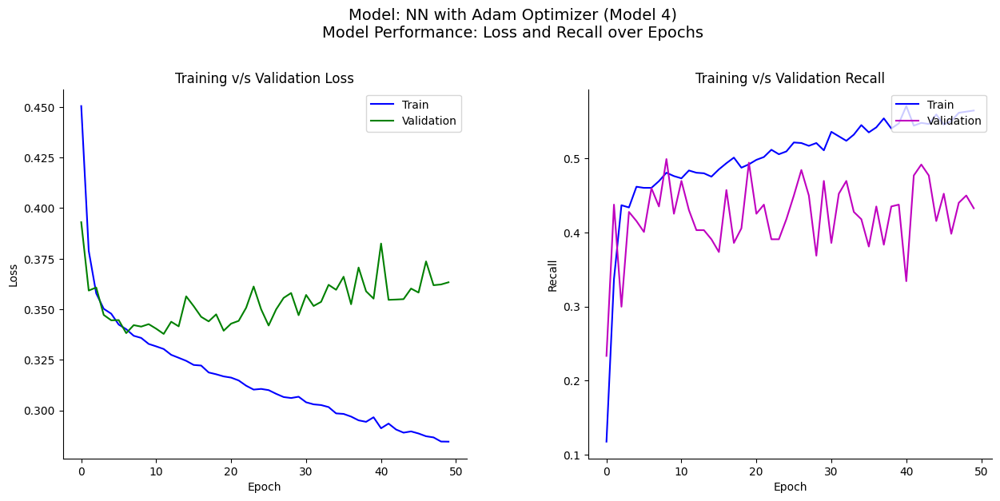

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

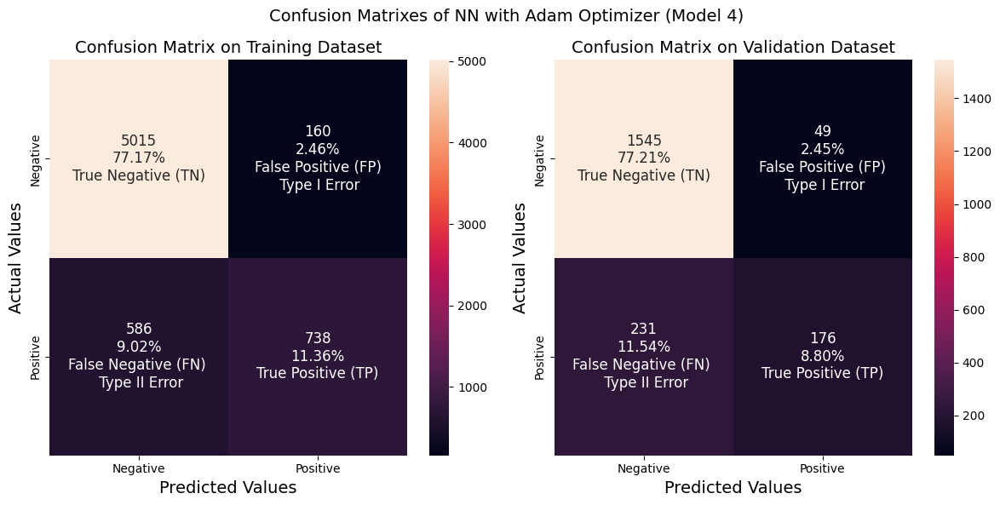

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observations**:

- **Loss**: The training loss exhibits a consistent decline, but the validation loss oscillates erratically, displaying a minimal upward trend. This discrepancy mostly because of noice and indicates a clear overfitting issue and learning instability.

- **Recall**: Training recall exhibits steady growth across epochs, but validation recall, fluctuates rapidly. This also indicates learing inconsistancy along with overfitting.

- **Precision & Accuracy**: The high and consistent value of training and validation accuracy and precision suggests that the model is generalizing well and not overfitting or underfitting. The model has a high degree of predictive accuracy and is reliably identifying true positives.

- **Confusion Matrix**: The model exhibits overfitting, as the training data shows a better prediction rate than the validation data. Additionally, the model's focus on reducing Type I errors misaligns with our objective of minimizing Type II errors.

**Recommendation**:
- The unstable validation losses and recall indicate that the model is facing challenges beyond just overfitting such as noise.
- To address this, we need to conduct a thorough hyperparameter tuning exercise, tune the epochs, batch size and decrease the learning rate.

#### **Model 5**

**Model 5**: Build with increasing batch size and dcreasing learning rate:

 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 64
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (suitable for classification problems))
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001

In [ ]:
# Define hyperparameters
model_name = "NN with Adam Optimizer"     # Define the model name
model = "Model_5"                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                     # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                               # Number of training epochs
                "batch_size" : 64,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with Adam Optimizer (Model_5):

Model: "Model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 64

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset
history[model] = models[model].fit(X_train, y_train,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with Adam Optimizer (Model_5)...

Epoch 1/50
102/102 [==============================] - 1s 6ms/step - loss: 0.6130 - recall: 0.1193 - val_loss: 0.5634 - val_recall: 0.0000e+00
Epoch 2/50
102/102 [==============================] - 1s 5ms/step - loss: 0.5333 - recall: 0.0000e+00 - val_loss: 0.5121 - val_recall: 0.0000e+00
Epoch 3/50
102/102 [==============================] - 0s 4ms/step - loss: 0.4980 - recall: 0.0000e+00 - val_loss: 0.4856 - val_recall: 0.0000e+00
Epoch 4/50
102/102 [==============================] - 0s 4ms/step - loss: 0.4767 - recall: 0.0000e+00 - val_loss: 0.4677 - val_recall: 0.0025
Epoch 5/50
102/102 [==============================] - 0s 4ms/step - loss: 0.4611 - recall: 0.0060 - val_loss: 0.4534 - val_recall: 0.0123
Epoch 6/50
102/102 [==============================] - 0s 4ms/step - loss: 0.4488 - recall: 0.0302 - val_loss: 0.4418 - val_recall: 0.0344
Epoch 7/50
102/102 [==============================] - 0s 5ms/step - loss: 0.4390 - recall: 0.0733 - val_loss: 0.4328 - val_recall: 0.0565
Epoch 8/50

Training Completed for NN with Adam Optimizer (Model_5). Total Time taken: 19.07 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train, y_train, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405


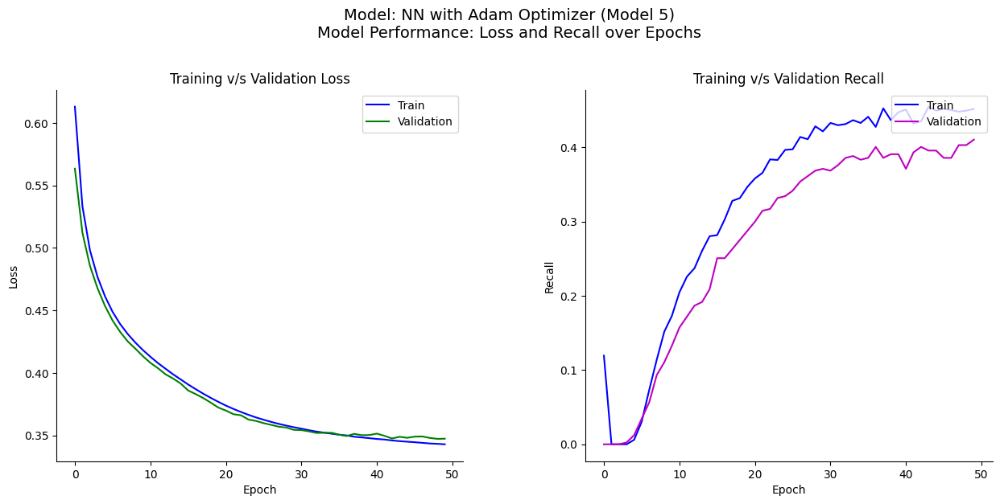

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace("_"," "),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

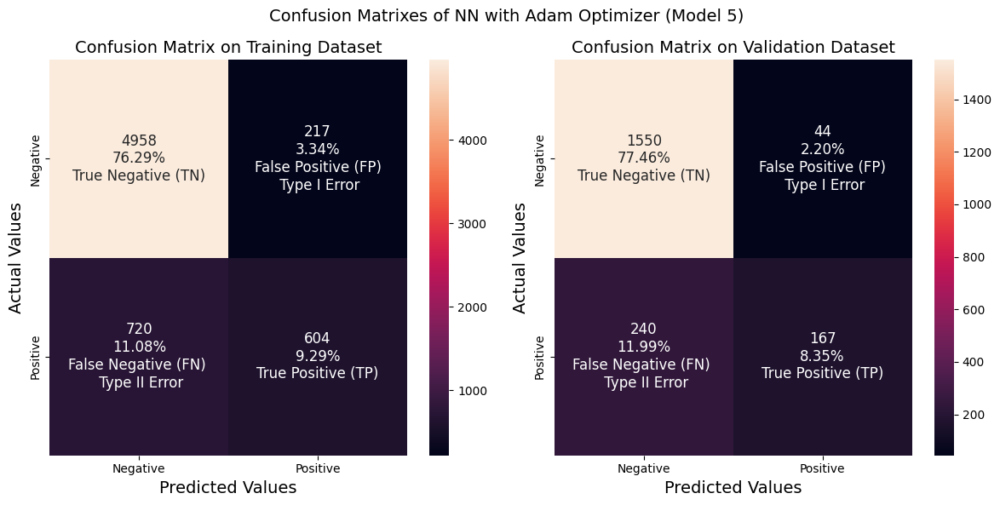

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observations**:

- **Loss**: Decreasing the learning rate leads to convergence between the validation loss and training loss, resulting in reduced overfitting and improved generalization. This suggests that increased batch size abd the higher learning rate is promoting better convergence.

- **Recall**:The validation recall shows steady growth across epochs and diverges from the training recall, indicating that the model is generalizing well.

- **Precision & Accuracy**: In line with the previous model's results, the current model also exhibits high and consistent accuracy and precision, indicating good generalization and no overfitting or underfitting.

- **Confusion Matrix**: Confusion matrix of this model also exhibits similar performance to the previous one, indicating a consistent trend in its predictive capabilities.

**Recommendation**:
- Overfitting has decreased, and consistency has improved for this model. However, the maximum recall achieved is only slightly above 0.4, indicating that alternative tuning approaches are necessary to further improve performance.

#### **Model 6**

**Model 6**: Build with increasing epoch size:

 - Hidden layers = 2
 - epochs = 100
 - Batch Size = 64
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (suitable for classification problems))
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001

In [ ]:
# Define hyperparameters
model_name = "NN with Adam Optimizer"     # Define the model name
model = "Model_6"                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                     # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 100,                                               # Number of training epochs
                "batch_size" : 64,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with Adam Optimizer (Model_6):

Model: "Model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 100

Batch Size: 64

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset
history[model] = models[model].fit(X_train, y_train,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with Adam Optimizer (Model_6)...

Epoch 1/100
102/102 [==============================] - 2s 15ms/step - loss: 0.6130 - recall: 0.1193 - val_loss: 0.5634 - val_recall: 0.0000e+00
Epoch 2/100
102/102 [==============================] - 0s 3ms/step - loss: 0.5333 - recall: 0.0000e+00 - val_loss: 0.5121 - val_recall: 0.0000e+00
Epoch 3/100
102/102 [==============================] - 0s 3ms/step - loss: 0.4980 - recall: 0.0000e+00 - val_loss: 0.4856 - val_recall: 0.0000e+00
Epoch 4/100
102/102 [==============================] - 0s 4ms/step - loss: 0.4767 - recall: 0.0000e+00 - val_loss: 0.4677 - val_recall: 0.0025
Epoch 5/100
102/102 [==============================] - 0s 4ms/step - loss: 0.4611 - recall: 0.0060 - val_loss: 0.4534 - val_recall: 0.0123
Epoch 6/100
102/102 [==============================] - 0s 4ms/step - loss: 0.4488 - recall: 0.0302 - val_loss: 0.4418 - val_recall: 0.0344
Epoch 7/100
102/102 [==============================] - 0s 3ms/step - loss: 0.4390 - recall: 0.0733 - val_loss: 0.4328 - val_recall: 0.0565
Ep

Training Completed for NN with Adam Optimizer (Model_6). Total Time taken: 83.14 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train, y_train, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320


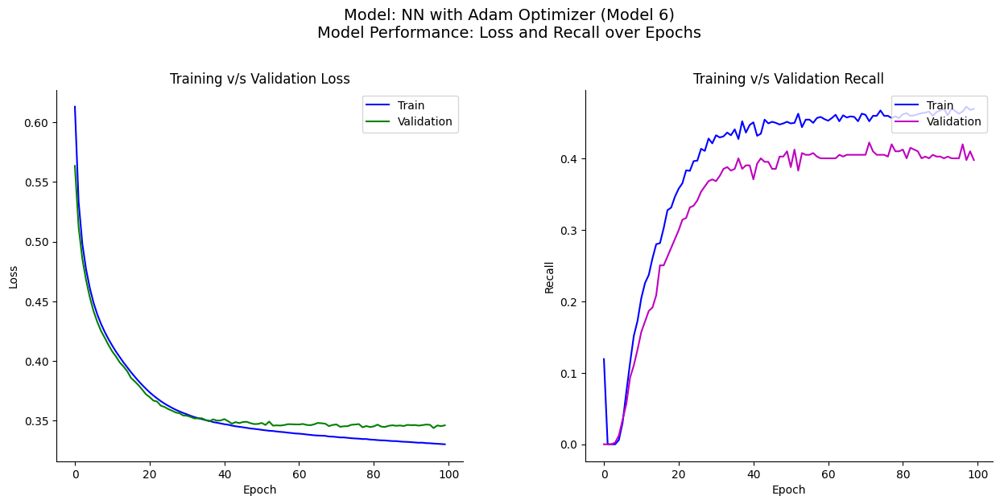

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace("_"," "),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

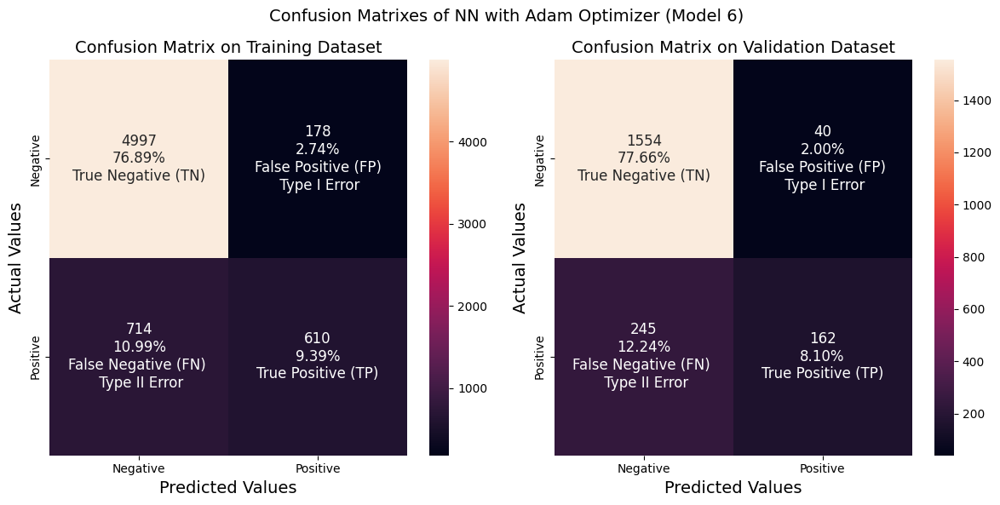

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observations**:

- **Loss**: A comparison of the two models reveals similar convergence patterns in terms of training and validation loss, with both models displaying comparable learning trajectories. This suggests that the models are generalizing well and learning effectively from the training data.

- **Recall**: The consistency between training and validation accuracy indicates that the model performs consistently well on both datasets.

- **Precision & Accuracy**: This model also exhibits high and consistent accuracy and precision.

- **Confusion Matrix**: The confusion matrix of this model shows similar performance characteristics.

**Recommendation**:
- Although the number of epochs has increased, this model exhibits the same performance as the previous model, indicating a plateau. To overcome this plateau and improve performance, implementing regularization techniques such as Dropout and batch normalization can be a effective strategy.

#### **Model 7**

**Model 6**: Build a model by reducing the epoches to 50 and adding batch normalization.
 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 64
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (suitable for classification problems))
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001
 - Regularization Technique: Batch Normalization

In [ ]:
# Define hyperparameters
model_name = "NN with Adam Optimizer"     # Define the model name
model = "Model_7"                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"BatchNormalization":{}},                                    # Batch Normilization layer for Regularization
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"BatchNormalization":{}},                                    # Batch Normilization layer for Regularization
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                    # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 64,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with Adam Optimizer (Model_7):

Model: "Model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 batch_normalization (Batch  (None, 64)                256       
 Normalization)                                                  
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 batch_normalization_1 (Bat  (None, 32)                128       
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 3265 (12.75 KB)
Trainable params: 3073 (12.00

Epoch: 50

Batch Size: 64

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset
history[model] = models[model].fit(X_train, y_train,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with Adam Optimizer (Model_7)...

Epoch 1/50
102/102 [==============================] - 2s 7ms/step - loss: 0.8189 - recall: 0.5861 - val_loss: 0.6100 - val_recall: 0.3464
Epoch 2/50
102/102 [==============================] - 0s 4ms/step - loss: 0.6824 - recall: 0.6405 - val_loss: 0.5679 - val_recall: 0.4128
Epoch 3/50
102/102 [==============================] - 0s 3ms/step - loss: 0.6203 - recall: 0.6450 - val_loss: 0.5435 - val_recall: 0.4939
Epoch 4/50
102/102 [==============================] - 0s 3ms/step - loss: 0.5798 - recall: 0.6427 - val_loss: 0.5259 - val_recall: 0.5332
Epoch 5/50
102/102 [==============================] - 1s 6ms/step - loss: 0.5511 - recall: 0.6458 - val_loss: 0.5097 - val_recall: 0.5504
Epoch 6/50
102/102 [==============================] - 1s 7ms/step - loss: 0.5279 - recall: 0.6224 - val_loss: 0.4907 - val_recall: 0.5479
Epoch 7/50
102/102 [==============================] - 1s 5ms/step - loss: 0.5060 - recall: 0.6088 - val_loss: 0.4762 - val_recall: 0.5553
Epoch 8/50
102/102 [==============

Training Completed for NN with Adam Optimizer (Model_7). Total Time taken: 26.11 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train, y_train, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287


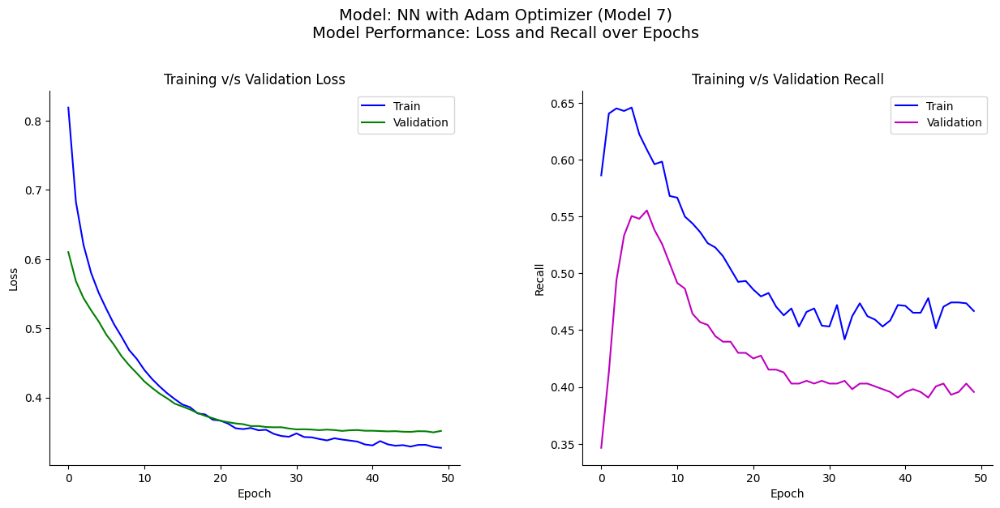

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

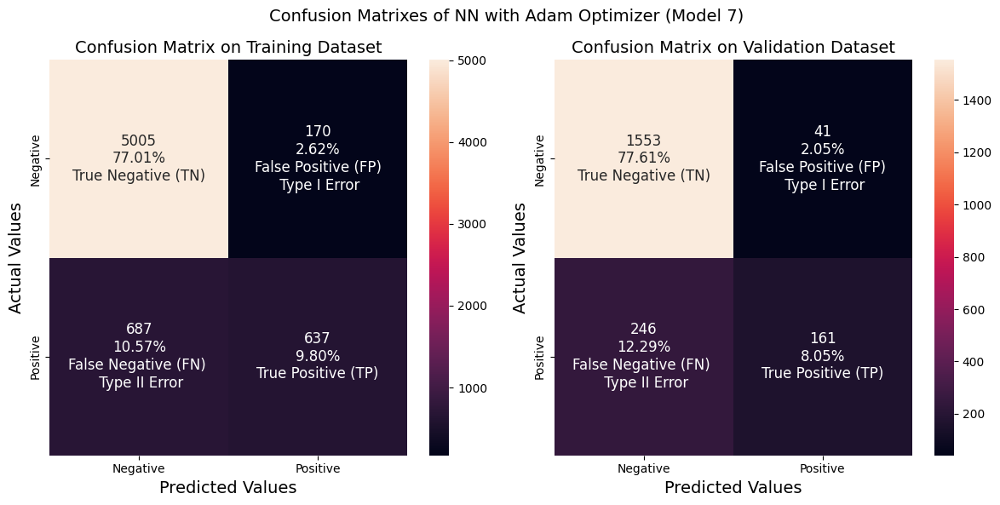

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observations**:

- **Loss**: The training and validation loss curves exhibit a similar trend to the previous model, prior to the implementation of Batch Normalization.

- **Recall**: The erratic and oscillating recall patterns observed in both training and validation data suggest that the model is struggling with stability and is likely overfitting,

- **Precision & Accuracy**: New model continue showing high and consistent accuracy and precision.

- **Confusion Matrix**: This model's confusion matrix shows a similar performance profile.

**Recommendation**:
- Batch Normalization degraded the model's performance, making it an inadvisable technique for this specific case.

#### **Conclusion**

- Despite optimizing hyperparameters and experimenting with SGD and Adam optimizers, our model's recall value remains disappointingly low.
- Moreover, the model demonstrates a propensity to predict Type I errors (False Positives) more accurately.
- To overcome these challenges, we plan to implement regularization techniques and train the model on balanced data, aiming to improve its overall performance and mitigate its biases.

### Neural Network with Adam Optimizer and Dropout

Further we will build Neural Network model using the Adam (Adaptive Moment Estimation) optimizer and dropout to reduce overfit. We'll also explore different combinations of epochs and batch sizes to optimize its performance.

#### **Model 8**

**Model 8**: Build a model with following hyperparameters to improve the performance:
 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 64
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001
 - Regularization Technique: DropOut with rate = 0.5

In [ ]:
model_name = "NN with Adam Optimizer and Dropout"     # Define the model name
model = "Model_8"                                     # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dropout":{"rate": 0.05}},                                   # Drpout layer
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"Dropout":{"rate": 0.05}},                                   # Drpout layer
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                    # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 64,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with Adam Optimizer and Dropout (Model_8):

Model: "Model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 64

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset
history[model] = models[model].fit(X_train, y_train,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with Adam Optimizer and Dropout (Model_8)...

Epoch 1/50
102/102 [==============================] - 2s 6ms/step - loss: 0.6167 - recall: 0.1352 - val_loss: 0.5645 - val_recall: 0.0000e+00
Epoch 2/50
102/102 [==============================] - 0s 3ms/step - loss: 0.5371 - recall: 0.0015 - val_loss: 0.5133 - val_recall: 0.0000e+00
Epoch 3/50
102/102 [==============================] - 0s 4ms/step - loss: 0.5020 - recall: 0.0015 - val_loss: 0.4873 - val_recall: 0.0000e+00
Epoch 4/50
102/102 [==============================] - 0s 4ms/step - loss: 0.4836 - recall: 7.5529e-04 - val_loss: 0.4700 - val_recall: 0.0025
Epoch 5/50
102/102 [==============================] - 0s 3ms/step - loss: 0.4678 - recall: 0.0098 - val_loss: 0.4559 - val_recall: 0.0074
Epoch 6/50
102/102 [==============================] - 0s 3ms/step - loss: 0.4552 - recall: 0.0295 - val_loss: 0.4444 - val_recall: 0.0246
Epoch 7/50
102/102 [==============================] - 0s 3ms/step - loss: 0.4461 - recall: 0.0642 - val_loss: 0.4357 - val_recall: 0.0541
Epoch 8/50
102/102

Training Completed for NN with Adam Optimizer and Dropout (Model_8). Total Time taken: 22.05 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train, y_train, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320


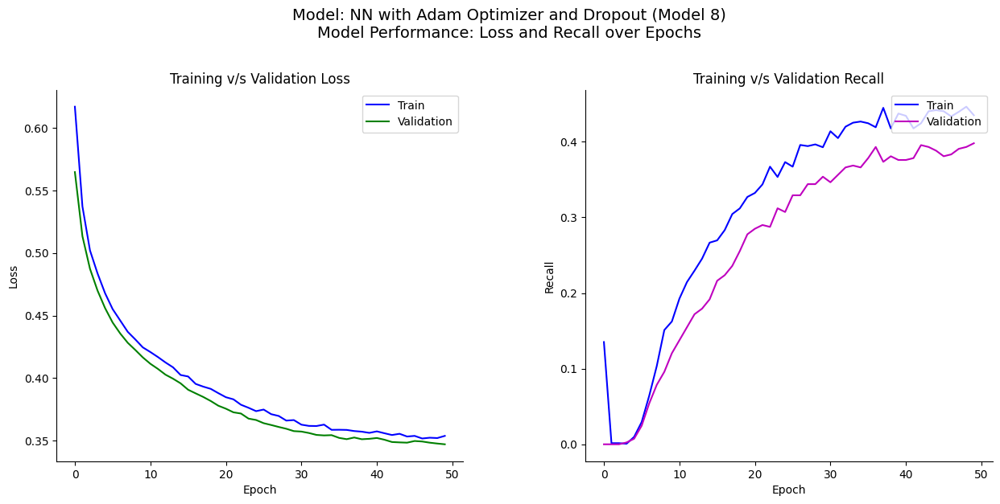

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

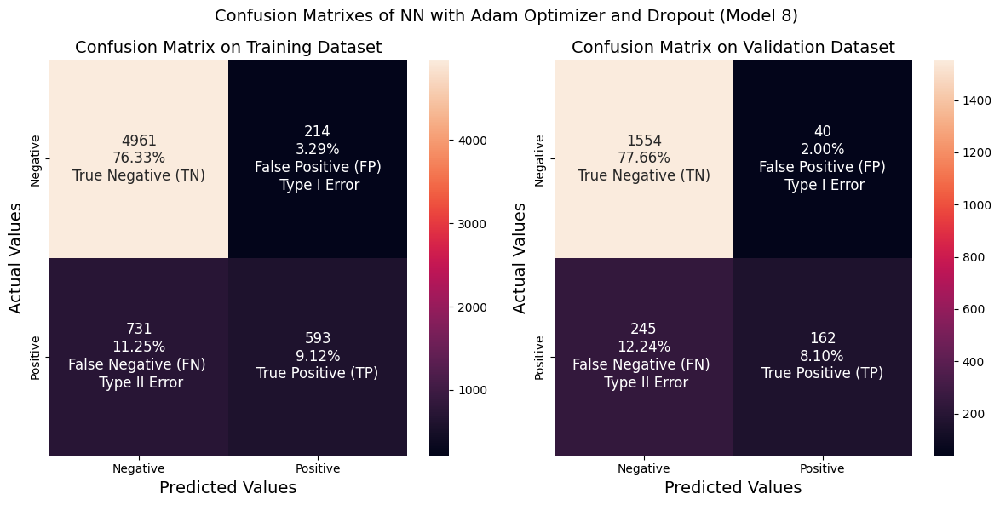

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observation**:
- **Loss**: The introduction of dropout and normalization caused both the training and validation loss to converge perfectly.

- **Recall**: The training and validation recall curves exhibit a similar pattern to the Models 5 and 6, suggesting that the addition of dropout layers did not lead to significant improvements in the model's performance.

- **Precision & Accuracy**: he new model perpetuates the trend of exceptional performance, maintaining high and consistent accuracy and precision, mirroring the impressive results of its predecessor.

- **Confusion Matrix**: The addition of a dropout layer did not improve the model's propensity to predict Type II errors, with its performance in predicting Type I errors remaining consistently better.

**Recommendation**:
- Further we can reduce the dropout rate to confirm any possibility of model improvement.

#### **Model 9**

**Model 9**: Build with reducing the dropout rate:

 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 64
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001
 - Regularization Technique: DropOut with rate = 0.3

In [ ]:
model_name = "NN with Adam Optimizer and Dropout"     # Define the model name
model = "Model_9"                                     # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dropout":{"rate": 0.03}},                                   # Drpout layer
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"Dropout":{"rate": 0.03}},                                   # Drpout layer
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                    # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 64,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with Adam Optimizer and Dropout (Model_9):

Model: "Model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 64

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset
history[model] = models[model].fit(X_train, y_train,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with Adam Optimizer and Dropout (Model_9)...

Epoch 1/50
102/102 [==============================] - 2s 6ms/step - loss: 0.6156 - recall: 0.1239 - val_loss: 0.5642 - val_recall: 0.0000e+00
Epoch 2/50
102/102 [==============================] - 0s 3ms/step - loss: 0.5360 - recall: 7.5529e-04 - val_loss: 0.5129 - val_recall: 0.0000e+00
Epoch 3/50
102/102 [==============================] - 0s 3ms/step - loss: 0.5004 - recall: 7.5529e-04 - val_loss: 0.4866 - val_recall: 0.0000e+00
Epoch 4/50
102/102 [==============================] - 0s 3ms/step - loss: 0.4811 - recall: 7.5529e-04 - val_loss: 0.4691 - val_recall: 0.0025
Epoch 5/50
102/102 [==============================] - 0s 3ms/step - loss: 0.4650 - recall: 0.0098 - val_loss: 0.4550 - val_recall: 0.0098
Epoch 6/50
102/102 [==============================] - 0s 3ms/step - loss: 0.4533 - recall: 0.0279 - val_loss: 0.4434 - val_recall: 0.0270
Epoch 7/50
102/102 [==============================] - 0s 3ms/step - loss: 0.4437 - recall: 0.0627 - val_loss: 0.4346 - val_recall: 0.0565
Epoch 8/50

Training Completed for NN with Adam Optimizer and Dropout (Model_9). Total Time taken: 24.49 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train, y_train, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311


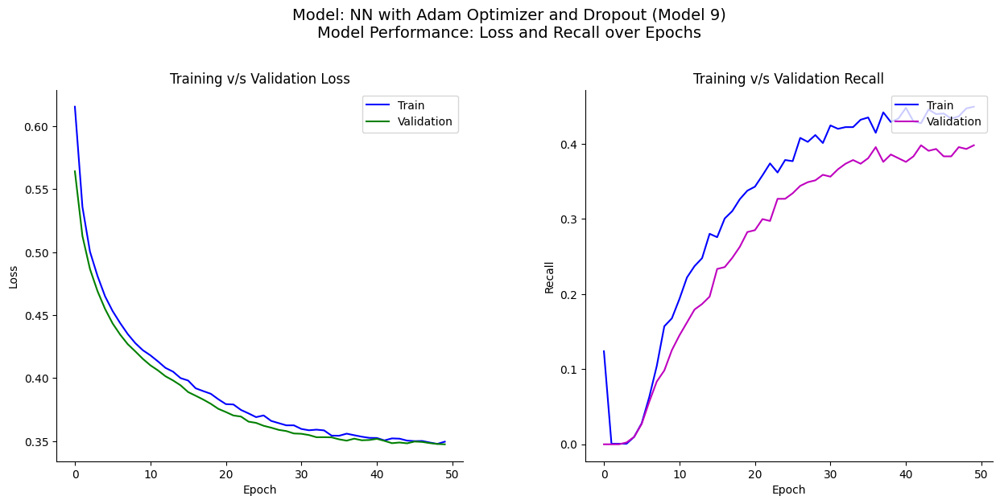

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

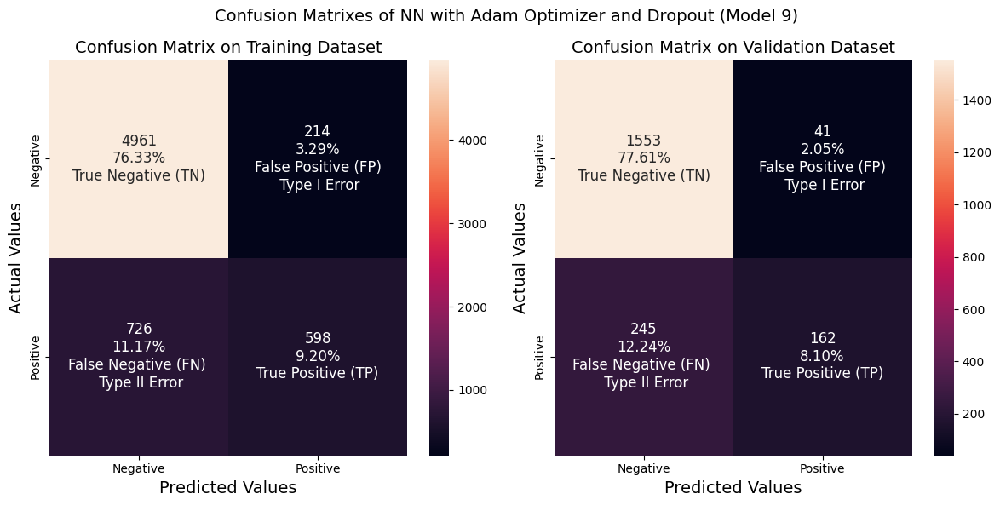

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observations**:

- Reducing the dropout rate has failed to significantly enhance model performance, with minimal impact on recall, accuracy, and precision, suggesting that the model's performance has plateaued and further adjustments are necessary to achieve meaningful improvements. The Confusion Matrix also yields similar performance to the previous model.

**Recommendation**:
- To further enhance the model's performance, we can explore further optimization possibility with alternative batch initialization techniques.


#### **Model 10**

**Model 10**: Build increasing the epoch to 150 and batch size to 32:

 - Hidden layers = 2
 - epochs = 150
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001
 - Regularization Technique: DropOut with rate = 0.5
 - Batch Initilization: he_normal

In [ ]:
#from tensorflow.keras.initializers import he_uniform

model_name = "NN with Adam Optimizer and Dropout"     # Define the model name
model = "Model_10"                                     # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                                                                              # , "kernel_initializer": "he_normal"
                {"Dropout":{"rate": 0.05}},                                                                      # Drpout layer
                {"Dense":{"units": 32, "activation": "relu", "kernel_initializer": "he_normal"}},                # Second hidden layer configuration
                {"Dropout":{"rate": 0.05}},                                   # Drpout layer
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
             "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                    # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 150,                                                # Number of training epochs
                "batch_size" : 64,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with Adam Optimizer and Dropout (Model_10):

Model: "Model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 150

Batch Size: 64

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset
history[model] = models[model].fit(X_train, y_train,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with Adam Optimizer and Dropout (Model_10)...

Epoch 1/150
102/102 [==============================] - 2s 11ms/step - loss: 0.6296 - recall: 0.1805 - val_loss: 0.5750 - val_recall: 0.0074
Epoch 2/150
102/102 [==============================] - 1s 5ms/step - loss: 0.5489 - recall: 0.0121 - val_loss: 0.5215 - val_recall: 0.0000e+00
Epoch 3/150
102/102 [==============================] - 1s 5ms/step - loss: 0.5095 - recall: 0.0038 - val_loss: 0.4922 - val_recall: 0.0000e+00
Epoch 4/150
102/102 [==============================] - 0s 4ms/step - loss: 0.4878 - recall: 0.0045 - val_loss: 0.4720 - val_recall: 0.0000e+00
Epoch 5/150
102/102 [==============================] - 0s 3ms/step - loss: 0.4681 - recall: 0.0083 - val_loss: 0.4552 - val_recall: 0.0025
Epoch 6/150
102/102 [==============================] - 0s 3ms/step - loss: 0.4544 - recall: 0.0234 - val_loss: 0.4410 - val_recall: 0.0123
Epoch 7/150
102/102 [==============================] - 0s 3ms/step - loss: 0.4433 - recall: 0.0589 - val_loss: 0.4296 - val_recall: 0.0516
Epoch 8/150
10

Training Completed for NN with Adam Optimizer and Dropout (Model_10). Total Time taken: 83.93 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train, y_train, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

In [ ]:
# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


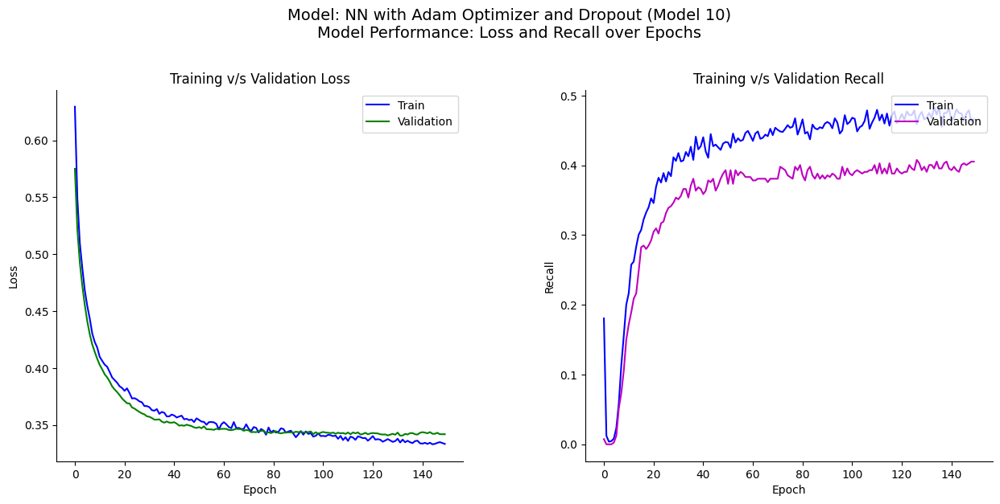

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model], val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model], val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

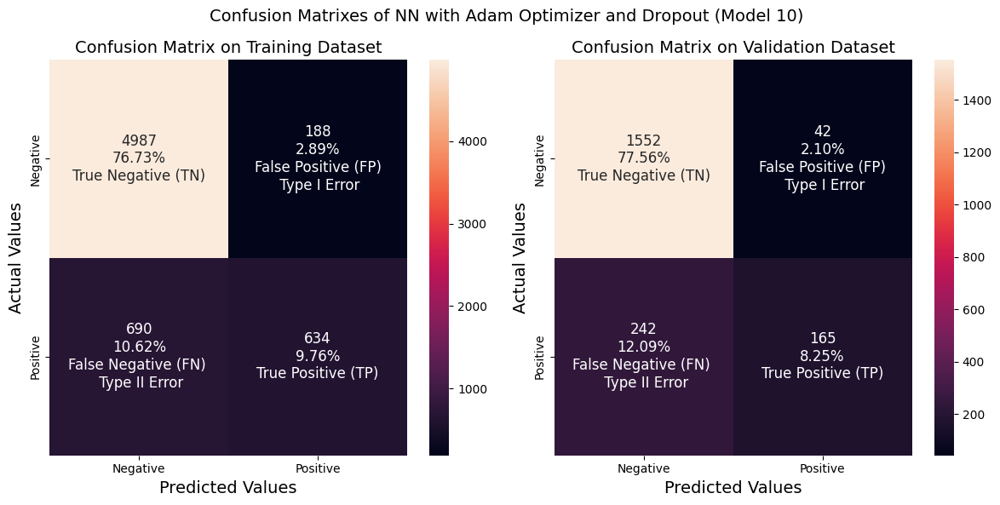

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observations**:
- Increasing the epochs abd reducing the batch size didnt show any significant improvement in model performance.

**Recommendation**:
 - Further we can try to improve the model with Balanced Data.







#### **Conclusion**

It appears that introducing dropout layers alone did not significantly impact the model's performance. Therefore, we need to explore additional techniques, such as training with balanced data or combining balanced data with dropout, to further improve the model's performance.

### Neural Network with Balanced Data (by applying SMOTE) and SGD Optimizer

Further we will build Neural Network model with Balanced Data (by applying SMOTE oversampling) and SGD Optimizer. We'll also explore different combinations of hyperparameters to optimize its performance.

#### **Model 11**

**Model 11**: Build a model with following hyperparameters which will be trained with oversampled data
 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 64
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (suitable for classification problems)
 - Optimizer = SGD (Stochastic Gradient Descent)
 - Training the model on the oversampled train data set (using SMOTE)

In [ ]:
model_name = "NN with SGD Optimizer and Oversampled Data using SMOTE"     # Define the model name
model = "Model_11"                                     # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train_over.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": SGD(),                                           # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 64,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_11):

Model: "Model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 64

Optimizer: SGD

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset with oversampled data
history[model] = models[model].fit(X_train_over, y_train_over,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_11)...

Epoch 1/50
162/162 [==============================] - 1s 4ms/step - loss: 0.6650 - recall: 0.5776 - val_loss: 0.6225 - val_recall: 0.5233
Epoch 2/50
162/162 [==============================] - 0s 2ms/step - loss: 0.6062 - recall: 0.6804 - val_loss: 0.5775 - val_recall: 0.5749
Epoch 3/50
162/162 [==============================] - 0s 3ms/step - loss: 0.5644 - recall: 0.7130 - val_loss: 0.5533 - val_recall: 0.6044
Epoch 4/50
162/162 [==============================] - 0s 2ms/step - loss: 0.5330 - recall: 0.7335 - val_loss: 0.5432 - val_recall: 0.6265
Epoch 5/50
162/162 [==============================] - 0s 3ms/step - loss: 0.5090 - recall: 0.7586 - val_loss: 0.5121 - val_recall: 0.6020
Epoch 6/50
162/162 [==============================] - 0s 3ms/step - loss: 0.4898 - recall: 0.7602 - val_loss: 0.5036 - val_recall: 0.6020
Epoch 7/50
162/162 [==============================] - 0s 2ms/step - loss: 0.4741 - recall: 0.7774 - val_loss: 0.4982 - val_recall: 0.6364
Epoch 8/50
162/162 [==============

Training Completed for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_11). Total Time taken: 24.22 
seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train_over, y_train_over, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


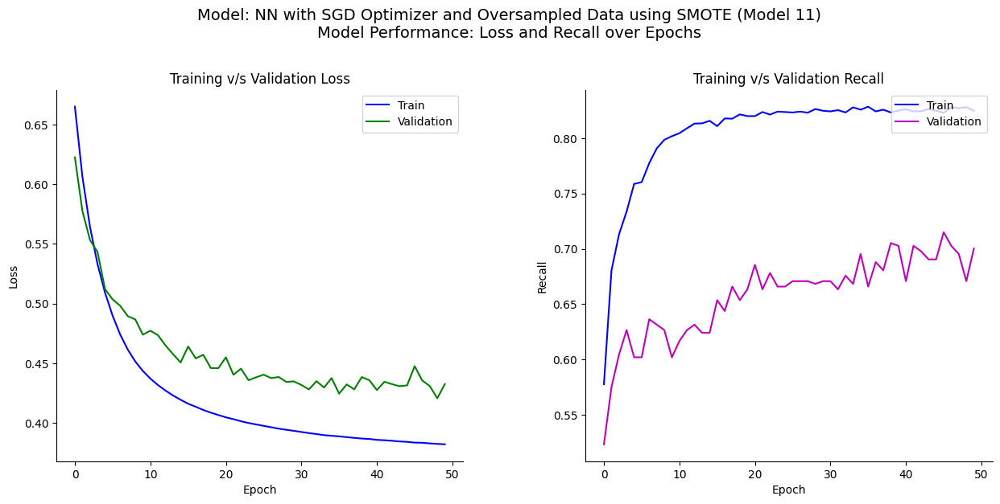

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

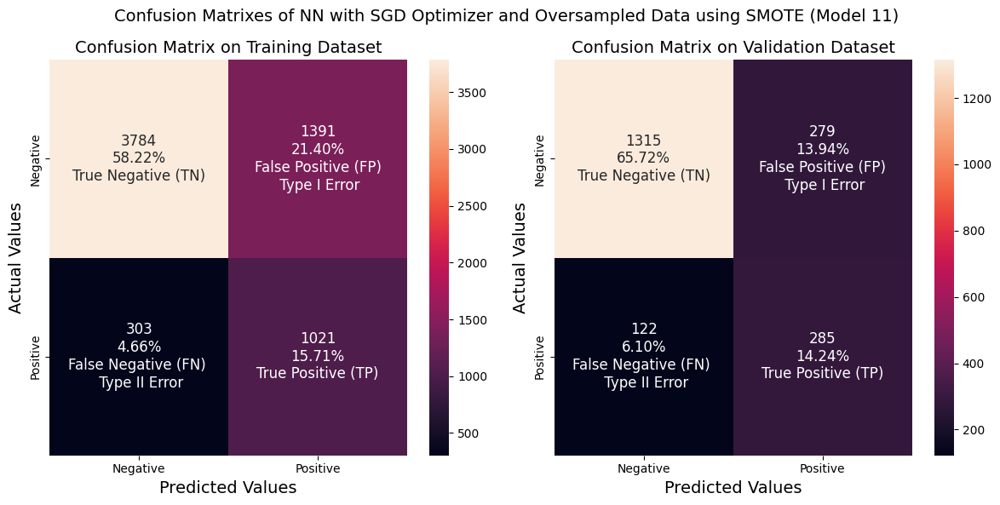

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observation**:
- **Loss**: While training loss decreases smoothly over epochs, validation loss divergence increases, confirming the oversampling issue.

- **Recall**: The range of the training and validation recall improve significantly compared to previous models, but oscillations in validation recall indicate overfitting and possible noise.

- **Precision**: With precision dropping significantly but recall increasing substantially for both training and validation datasets, it suggests that the model has become more aggressive in predicting positive cases, but at the cost of accuracy.

- **Accuracy**:  High accuracy is maintained on both datasets, although slightly lower than the previous model. This reduction is largely due to dataset balancing efforts, a crucial step to prevent overfitting and enhance generalizability.

- **Confusion Matrix**: The Confusion Matrix reveals that the current model has made significant strides in accurately predicting False Negative cases, outperforming the previous model. Nevertheless, this improvement comes at the cost of a considerable decline in the model's ability to predict False Positive cases, aligning with the expected trade-off outlined in the Model Evaluation criteria.

**Recommendation**:
- This tradeoff between precision and recall is a common phenomenon in machine learning and this result is more fevorable to model evaluation criteria.
- Despite good training performance, and an increased range of the Recall value significantly, the model exhibits tendency of overfit on validation data.
- Oversampled data can lead to overfitting so increasing the batch side is helpful. Also Larger batch sizes can improve the model's ability to generalize to new, unseen data.

#### **Model 12**

**Model 12**: Build a model increasing the batch size to 128.
 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 128
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (suitable for classification problems)
 - Optimizer = SGD (Stochastic Gradient Descent)
 - Training the model on the oversampled train data set (using SMOTE)

In [ ]:
model_name = "NN with SGD Optimizer and Oversampled Data using SMOTE"     # Define the model name
model = "Model_12"                                     # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train_over.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": SGD(),                                           # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 128,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_12):

Model: "Model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 128

Optimizer: SGD

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset with oversampled data
history[model] = models[model].fit(X_train_over, y_train_over,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_12)...

Epoch 1/50
81/81 [==============================] - 2s 16ms/step - loss: 0.6830 - recall: 0.5333 - val_loss: 0.6516 - val_recall: 0.5086
Epoch 2/50
81/81 [==============================] - 0s 2ms/step - loss: 0.6466 - recall: 0.6257 - val_loss: 0.6223 - val_recall: 0.5258
Epoch 3/50
81/81 [==============================] - 0s 2ms/step - loss: 0.6180 - recall: 0.6597 - val_loss: 0.6006 - val_recall: 0.5528
Epoch 4/50
81/81 [==============================] - 0s 3ms/step - loss: 0.5937 - recall: 0.6866 - val_loss: 0.5858 - val_recall: 0.5995
Epoch 5/50
81/81 [==============================] - 0s 3ms/step - loss: 0.5728 - recall: 0.7171 - val_loss: 0.5648 - val_recall: 0.6044
Epoch 6/50
81/81 [==============================] - 0s 3ms/step - loss: 0.5550 - recall: 0.7241 - val_loss: 0.5514 - val_recall: 0.5995
Epoch 7/50
81/81 [==============================] - 0s 3ms/step - loss: 0.5395 - recall: 0.7291 - val_loss: 0.5428 - val_recall: 0.6118
Epoch 8/50
81/81 [=============================

Training Completed for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_12). Total Time taken: 22.18 
seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train_over, y_train_over, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


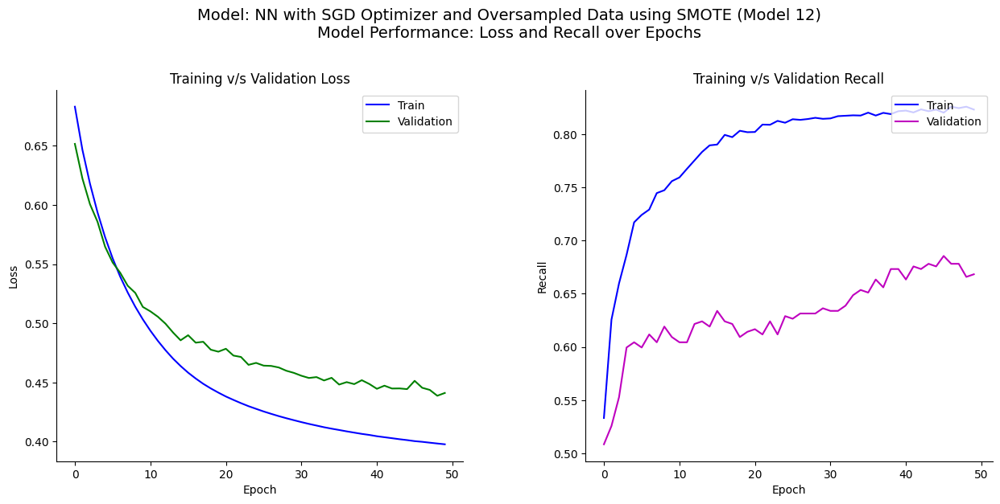

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

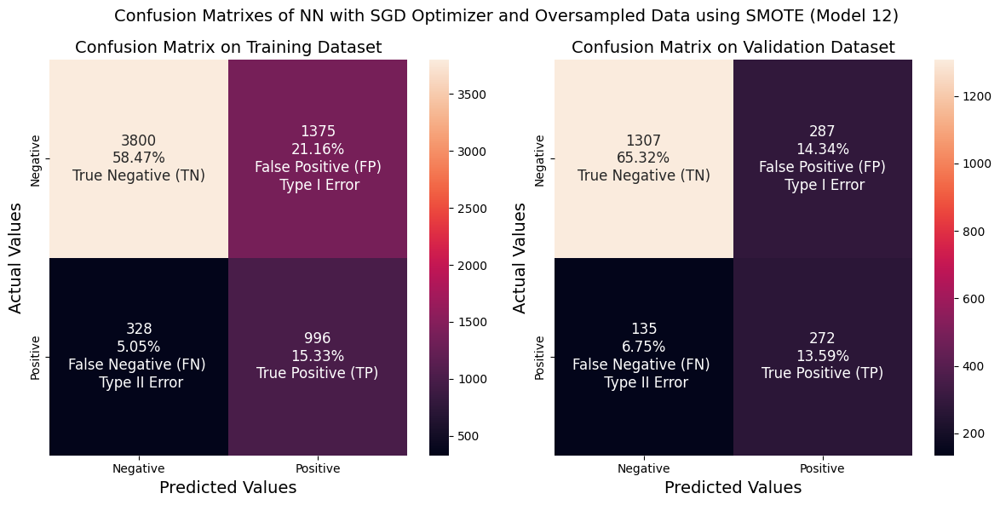

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observations**:
- **Loss**: Increasing the batch size has led to a reduction in the oscillation of validation loss, indicating that the model has improved in reducing noise. However, the divergence rate has not decreased, suggesting that the model still suffers from overfitting.

- **Recall**: The oscillation of validation recall has decreased, indicating a reduction in noise.

- **Precision & Accuracy**: Accuracy and Precision remain alomsot unchanged compared to the previous Model.

  Model prioritizes detecting positive cases (high recall) over accuracy (low precision), as per the requirement of Model evaluation criteria.

- **Confusion Matrix**: The current model's Confusion Matrix aligns with the previous model, achieving better results in predicting Type II errors.

**Recommendations**:
With balanced data, the model yields better performance in predicting Type II errors. However, the model is clearly overfitting, and further regularization techniques, such as L2 Regularization, should be explored to reduce overfitting.

#### **Model 13**

**Model 13**: Build a model including Dropout regularization.
 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 128
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (suitable for classification problems)
 - Optimizer = SGD (Stochastic Gradient Descent)
 - Training the model on the oversampled train data set (using SMOTE)
 -  Regularization Technique: L2 Regularization with 0.01 rate

In [ ]:
from tensorflow.keras.regularizers import l1, l2  # Import L1 and L2 Regularization

model_name = "NN with SGD Optimizer and Oversampled Data using SMOTE"     # Define the model name
model = "Model_13"                                     # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train_over.shape[1],"units": 64, "activation": "relu", "kernel_regularizer": l2(0.01)}},
                                                                              # First hidden layer configuration
                {"Dense":{"units": 32, "activation": "relu", "kernel_regularizer": l2(0.01)}},
                                                                              # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": SGD(),                                           # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 128,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_13):

Model: "Model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 128

Optimizer: SGD

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset with oversampled data
history[model] = models[model].fit(X_train_over, y_train_over,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_13)...

Epoch 1/50
81/81 [==============================] - 1s 7ms/step - loss: 1.2910 - recall: 0.5333 - val_loss: 1.2506 - val_recall: 0.5086
Epoch 2/50
81/81 [==============================] - 0s 4ms/step - loss: 1.2373 - recall: 0.6251 - val_loss: 1.2054 - val_recall: 0.5233
Epoch 3/50
81/81 [==============================] - 1s 7ms/step - loss: 1.1936 - recall: 0.6578 - val_loss: 1.1688 - val_recall: 0.5504
Epoch 4/50
81/81 [==============================] - 0s 4ms/step - loss: 1.1552 - recall: 0.6852 - val_loss: 1.1391 - val_recall: 0.5995
Epoch 5/50
81/81 [==============================] - 0s 5ms/step - loss: 1.1205 - recall: 0.7175 - val_loss: 1.1043 - val_recall: 0.5995
Epoch 6/50
81/81 [==============================] - 0s 5ms/step - loss: 1.0889 - recall: 0.7229 - val_loss: 1.0766 - val_recall: 0.5995
Epoch 7/50
81/81 [==============================] - 0s 5ms/step - loss: 1.0598 - recall: 0.7270 - val_loss: 1.0535 - val_recall: 0.6093
Epoch 8/50
81/81 [==============================

Training Completed for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_13). Total Time taken: 16.70 
seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train_over, y_train_over, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


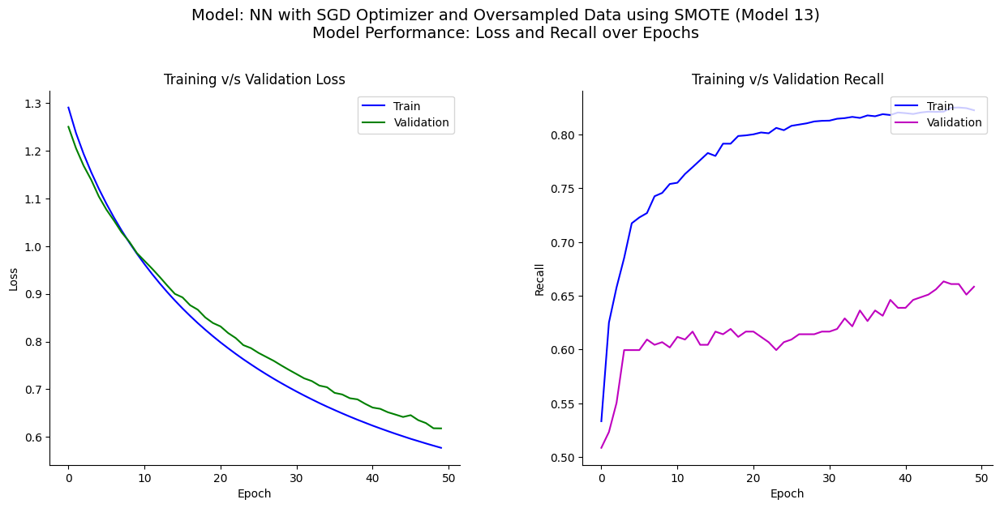

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

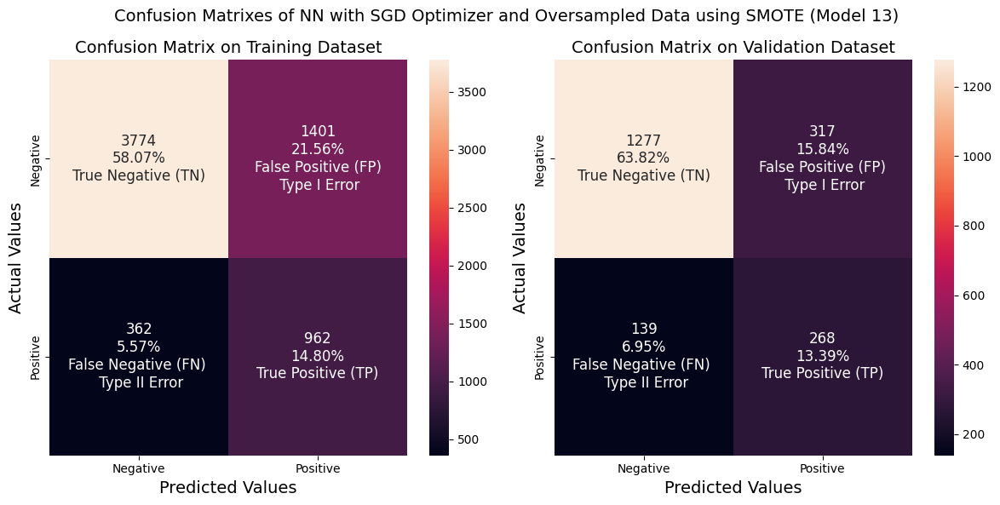

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observation**:
- **Loss**: The introduction of L2 regularization has led to a significant reduction in overfitting, as evidenced by the convergence of validation loss to training loss.

- **Recall**: Validation recall exhibits a similar pattern to the previous model.

- **Precision & Accuracy**: Accuracy and Precision remain alomsot unchanged compared to the previous Model.

- **Confusion Matrix**:

**Recommendation**:
- To further improve model performance, consider replacing the SGD optimizer with Adam, which can adapt learning rates for each parameter and improve convergence.
- Introduce dropout or other regularization techniques to reduce overfitting and improve generalization.

#### **Conclusion**

 - Training with balanced data significantly improves recall, but compromises precision. This result aligns with the model's evaluation criteria, prioritizing recall over precision.
 - Further optimization techniques, such as hyperparameter tuning (e.g., optimizer, epoch, batch size) or regularization methods, applied to the balanced data, can potentially enhance the model's performance.

### Neural Network with Balanced Data (by applying SMOTE) and Adam Optimizer

In our next steps, we will explore building additional models, modifying the optimizer to use the Adam Optimizer, to potentially further improve model performance and stability.

#### **Model 14**

**Model 14**: Build a model with following hyperparameters which will be trained with oversampled data

 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.001
 - Training the model on the oversampled train data set (using SMOTE)


In [ ]:
model_name = "NN with SGD Optimizer and Oversampled Data using SMOTE"     # Define the model name
model = "Model_14"                                                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train_over.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.001),                     # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 64,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_14):

Model: "Model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 64

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset with oversampled data
history[model] = models[model].fit(X_train_over, y_train_over,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_14)...

Epoch 1/50
162/162 [==============================] - 2s 4ms/step - loss: 0.5220 - recall: 0.7328 - val_loss: 0.4759 - val_recall: 0.5872
Epoch 2/50
162/162 [==============================] - 0s 3ms/step - loss: 0.4220 - recall: 0.8064 - val_loss: 0.4289 - val_recall: 0.6167
Epoch 3/50
162/162 [==============================] - 0s 3ms/step - loss: 0.4012 - recall: 0.8187 - val_loss: 0.4551 - val_recall: 0.7101
Epoch 4/50
162/162 [==============================] - 1s 3ms/step - loss: 0.3925 - recall: 0.8199 - val_loss: 0.4534 - val_recall: 0.7174
Epoch 5/50
162/162 [==============================] - 0s 3ms/step - loss: 0.3869 - recall: 0.8247 - val_loss: 0.4095 - val_recall: 0.6486
Epoch 6/50
162/162 [==============================] - 0s 3ms/step - loss: 0.3841 - recall: 0.8224 - val_loss: 0.4362 - val_recall: 0.7002
Epoch 7/50
162/162 [==============================] - 0s 3ms/step - loss: 0.3816 - recall: 0.8197 - val_loss: 0.4172 - val_recall: 0.6339
Epoch 8/50
162/162 [==============

Training Completed for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_14). Total Time taken: 42.53 
seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train_over, y_train_over, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


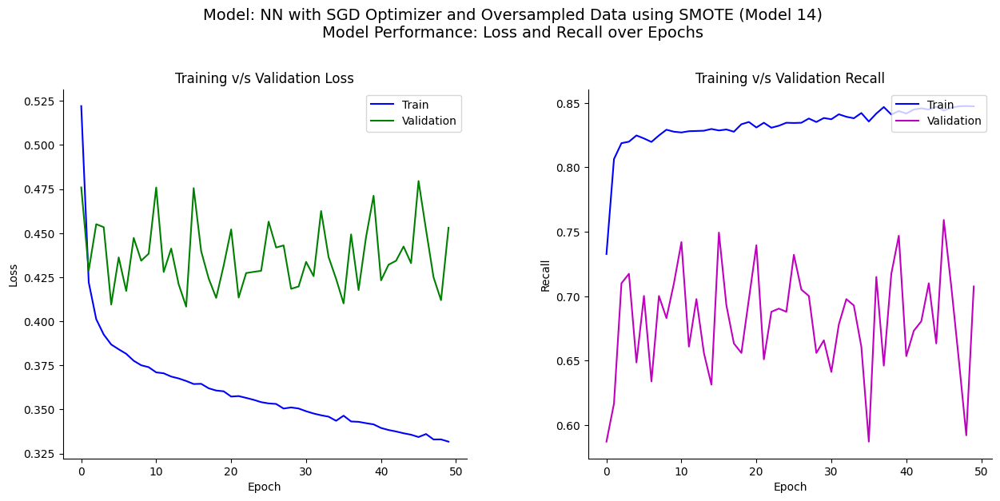

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

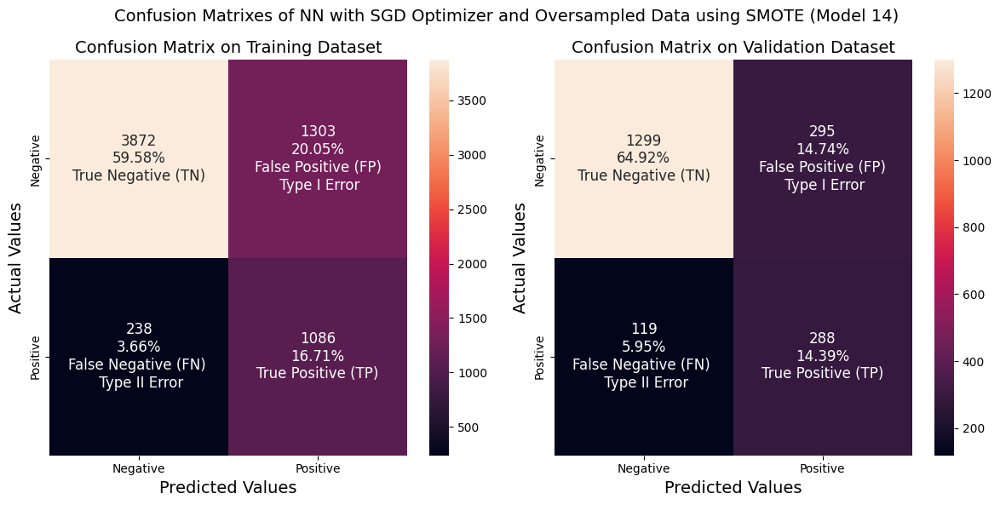

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Ovservations**:

- **Loss**: The training loss exhibits a consistent downward trend across epochs, indicating effective model training. However, the validation loss oscillates and experiences a substantial increase after the initial few epochs, suggesting overfitting. While the model performs exceptionally well on the training set, it struggles with overfitting and instability on the validation data.

- **Recall**: While the training recall shows a steady and promising improvement, the validation recall exhibits pronounced fluctuations, oscillating between 0.6 and 0.7. This disparity starkly highlights the model's instability and overfitting to the training data, ultimately leading to a failure to consistently achieve high recall performance on the validation set.

- **Precision & Accuracy**: Precision and accuracy remain consistently high for both datasets, showing a slight increase compared to the previous model. This improvement indicates a better ability to identify Type I errors (false positives), suggesting that the model has enhanced its predictive capabilities and reduced the likelihood of misclassifying negative cases as positive.

- **Confusion Matrix**:

**Recommendations**:
To combat overfitting, consider employing regularization techniques such as dropout. Furthermore, we can explore the following strategies to prevent the model from training too long and overfitting:
 - Reduce the number of nodes in the hidden layer
 - Further decrease the learning rate. This multi-faceted approach can help strike a balance between model complexity and generalization performance.

#### **Model 15**

**Model 15**: Build a model by decreasing the learning rate:

 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001
 - Training the model on the oversampled train data set (using SMOTE)


In [ ]:
model_name = "NN with SGD Optimizer and Oversampled Data using SMOTE"      # Define the model name
model = "Model_15"                                                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim":  X_train_over.shape[1],"units": 64, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dense":{"units": 32, "activation": "relu"}},                # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                    # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 32,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_15):

Model: "Model_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                768       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 32

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset with oversampled data
history[model] = models[model].fit(X_train_over, y_train_over,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_15)...

Epoch 1/50
324/324 [==============================] - 2s 4ms/step - loss: 0.6465 - recall: 0.6091 - val_loss: 0.5904 - val_recall: 0.5405
Epoch 2/50
324/324 [==============================] - 1s 3ms/step - loss: 0.5642 - recall: 0.7109 - val_loss: 0.5328 - val_recall: 0.5749
Epoch 3/50
324/324 [==============================] - 1s 3ms/step - loss: 0.5130 - recall: 0.7411 - val_loss: 0.5163 - val_recall: 0.6069
Epoch 4/50
324/324 [==============================] - 1s 4ms/step - loss: 0.4797 - recall: 0.7637 - val_loss: 0.5072 - val_recall: 0.6388
Epoch 5/50
324/324 [==============================] - 2s 5ms/step - loss: 0.4584 - recall: 0.7869 - val_loss: 0.4800 - val_recall: 0.6118
Epoch 6/50
324/324 [==============================] - 2s 6ms/step - loss: 0.4442 - recall: 0.7909 - val_loss: 0.4798 - val_recall: 0.6020
Epoch 7/50
324/324 [==============================] - 1s 3ms/step - loss: 0.4339 - recall: 0.8010 - val_loss: 0.4671 - val_recall: 0.6118
Epoch 8/50
324/324 [==============

Training Completed for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_15). Total Time taken: 55.12 
seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train_over, y_train_over, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

In [ ]:
# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


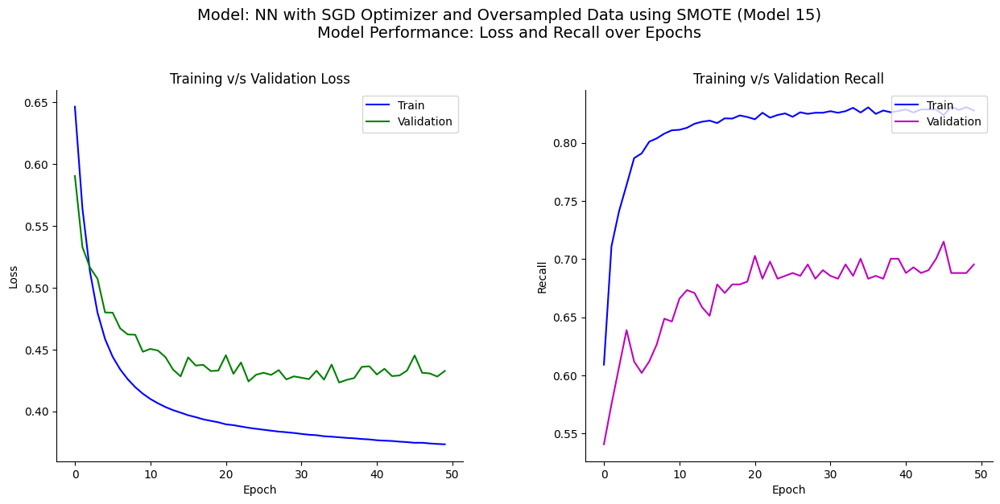

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

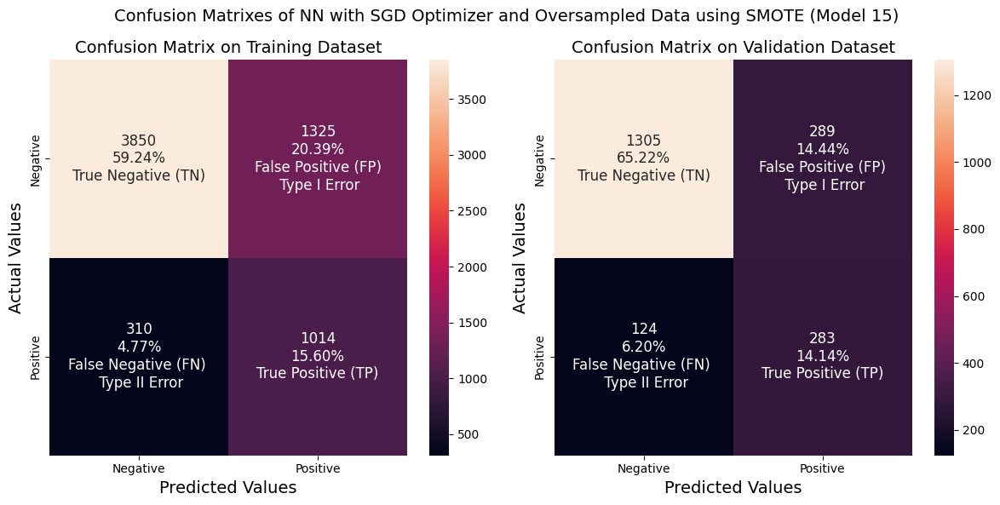

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observations**:

- **Loss**: Reducing the learning rate has led to convergence and stabilization of the validation loss, indicating improved performance. However, the persistent gap between the training and validation loss curves, accompanied by oscillations in the validation loss, suggests that the model may still be overfitting.

- **Recall**: The training recall exhibits a rapid ascent, followed by stabilization at an impressive high level, demonstrating excellent performance on the training set. In contrast, the validation recall displays improved stability compared to the previous attempt, with reduced fluctuations and a consistently higher recall value. However, some residual variability persists, hinting at lingering overfitting.

- **Precision & Accuracy**: Precision and accuracy remain stable, with minimal changes compared to the previous model.

- **Confusion Matrix**:The Confusion Matrix persistently demonstrates superior performance in predicting Type II errors compared to Type I errors. Nevertheless, an analysis of the False Negative percentage between the Training and Validation data suggests potential overfitting.

**Recommendations**: Reducing the learning rate has yielded improved model performance, mitigating overfitting and enhancing stability in recall metrics. However, despite this progress, the model still exhibits significant variance, overfitting, and a lack of generalization. To further optimize performance, consider exploring the reduction of neurons in the hidden layer, which may help to strike a balance between model capacity and generalization capabilities, ultimately leading to more robust and reliable predictions.

#### **Model 16**

**Model 16**: Build a model by reducting the nurons in hidden layers

 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Hidden Layers: Layer 1 with 32 nodes (reduced from 64) and Layer 2 with 16 nodes (reduced from 32)
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001
 - Training the model on the oversampled train data set (using SMOTE)


In [ ]:
model_name = "NN with SGD Optimizer and Oversampled Data using SMOTE"      # Define the model name
model = "Model_16"                                                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim":  X_train_over.shape[1],"units": 32, "activation": "relu"}},
                                                                              # First hidden layer configuration
                {"Dense":{"units": 16, "activation": "relu"}},                # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                    # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 32,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_16):

Model: "Model_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                384       
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 929 (3.63 KB)
Trainable params: 929 (3.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 32

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset with oversampled data
history[model] = models[model].fit(X_train_over, y_train_over,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_16)...

Epoch 1/50
324/324 [==============================] - 4s 7ms/step - loss: 0.6629 - recall: 0.4674 - val_loss: 0.6248 - val_recall: 0.4595
Epoch 2/50
324/324 [==============================] - 1s 3ms/step - loss: 0.6161 - recall: 0.5716 - val_loss: 0.5762 - val_recall: 0.4865
Epoch 3/50
324/324 [==============================] - 2s 5ms/step - loss: 0.5728 - recall: 0.6479 - val_loss: 0.5467 - val_recall: 0.5430
Epoch 4/50
324/324 [==============================] - 2s 5ms/step - loss: 0.5367 - recall: 0.7045 - val_loss: 0.5304 - val_recall: 0.5848
Epoch 5/50
324/324 [==============================] - 2s 5ms/step - loss: 0.5107 - recall: 0.7447 - val_loss: 0.5130 - val_recall: 0.5921
Epoch 6/50
324/324 [==============================] - 1s 4ms/step - loss: 0.4921 - recall: 0.7592 - val_loss: 0.5055 - val_recall: 0.6020
Epoch 7/50
324/324 [==============================] - 1s 3ms/step - loss: 0.4779 - recall: 0.7724 - val_loss: 0.4992 - val_recall: 0.6069
Epoch 8/50
324/324 [==============

Training Completed for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_16). Total Time taken: 63.23 
seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train, y_train, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results  # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


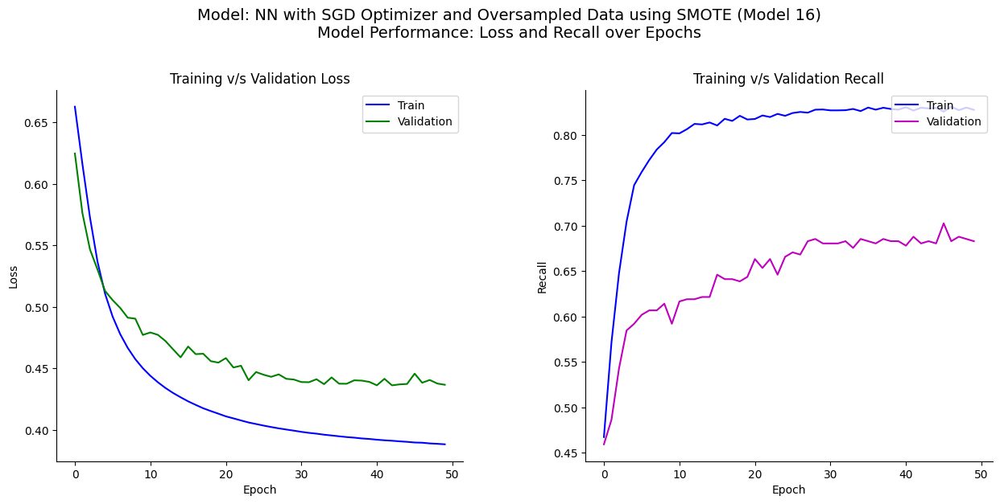

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

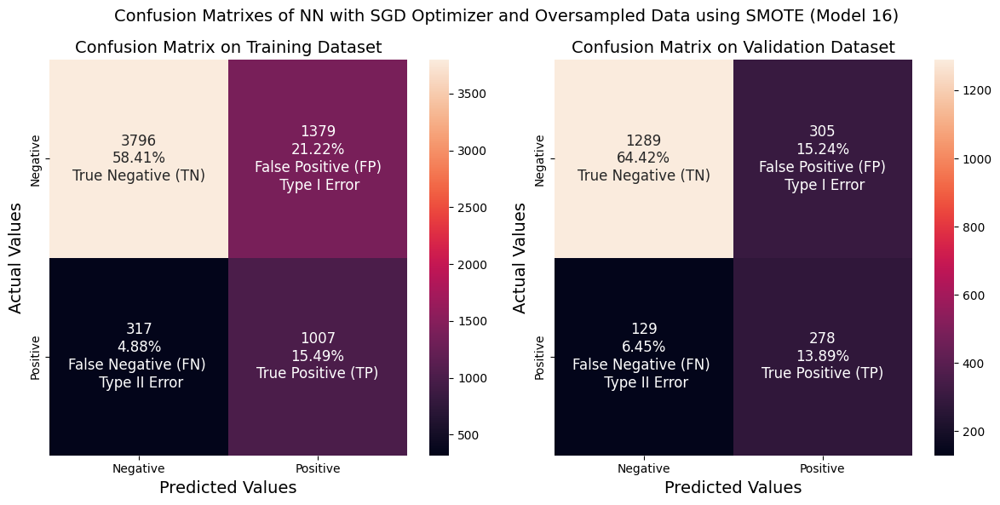

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observations**:
- **Loss**:The training loss continues its steady decline, indicating consistent improvement. Similarly, the validation loss exhibits a downward trend and stabilizes, suggesting enhanced generalization capabilities. However, the gap between the training and validation loss curves widens over epochs, mirroring the behavior of the earlier model, which may indicate persistent overfitting concerns.

- **Recall**:The training recall had no changes i.e. increases rapidly and stabilizes at a high level. The validation recall shows a more stable pattern and achieves higher values compared to previous attempts, though there are still minor fluctuations, indicating better but not perfect generalization.

- **Precision & Accuracy**:Precision and accuracy remain stable compared to the previous model.

- **Confusion Matrix**:The Confusion Matrix consistently shows better performance in predicting Type II errors than Type I errors, but suggests potential overfitting due to a discrepancy in False Negative percentages between Training and Validation data.

**Recommendations**:
The reduction in the number of nodes in the hidden layers has improved the model's ability to generalize, as evidenced by the stable validation loss and recall. To further enhance performance, consider fine-tuning other hyperparameters and/or use  regularization techniques like dropout.








#### **Model 17**

**Model 17**: Build a model by introducing L2 regularization:

 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Hidden Layers: Layer 1 with 32 nodes (reduced from 64) and Layer 2 with 16 nodes (reduced from 32)
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001
 - Regularization Technique: L2 with rate 0.001
 - Training the model on the oversampled train data set (using SMOTE)


In [ ]:
from keras.regularizers import l2  # Import the L2 regularizer from Keras

model_name = "NN with SGD Optimizer and Oversampled Data using SMOTE"      # Define the model name
model = "Model_17"                                                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim":  X_train_over.shape[1],"units": 32, "activation": "relu", "kernel_regularizer": l2(0.01)}},# First hidden layer configuration
                {"Dense":{"units": 16, "activation": "relu", "kernel_regularizer": l2(0.01)}},                # Second hidden layer configuration
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                    # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 32,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_17):

Model: "Model_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                384       
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 929 (3.63 KB)
Trainable params: 929 (3.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 32

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset with oversampled data
history[model] = models[model].fit(X_train_over, y_train_over,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_17)...

Epoch 1/50
324/324 [==============================] - 3s 6ms/step - loss: 1.0282 - recall: 0.4611 - val_loss: 0.9674 - val_recall: 0.4447
Epoch 2/50
324/324 [==============================] - 1s 4ms/step - loss: 0.9395 - recall: 0.5525 - val_loss: 0.8803 - val_recall: 0.4644
Epoch 3/50
324/324 [==============================] - 1s 5ms/step - loss: 0.8619 - recall: 0.6180 - val_loss: 0.8134 - val_recall: 0.5258
Epoch 4/50
324/324 [==============================] - 1s 3ms/step - loss: 0.7951 - recall: 0.6790 - val_loss: 0.7647 - val_recall: 0.5651
Epoch 5/50
324/324 [==============================] - 1s 3ms/step - loss: 0.7407 - recall: 0.7281 - val_loss: 0.7204 - val_recall: 0.5823
Epoch 6/50
324/324 [==============================] - 1s 2ms/step - loss: 0.6981 - recall: 0.7443 - val_loss: 0.6932 - val_recall: 0.5872
Epoch 7/50
324/324 [==============================] - 1s 2ms/step - loss: 0.6640 - recall: 0.7610 - val_loss: 0.6710 - val_recall: 0.5971
Epoch 8/50
324/324 [==============

Training Completed for NN with SGD Optimizer and Oversampled Data using SMOTE (Model_17). Total Time taken: 55.42 
seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train_over, y_train_over, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

In [ ]:
# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


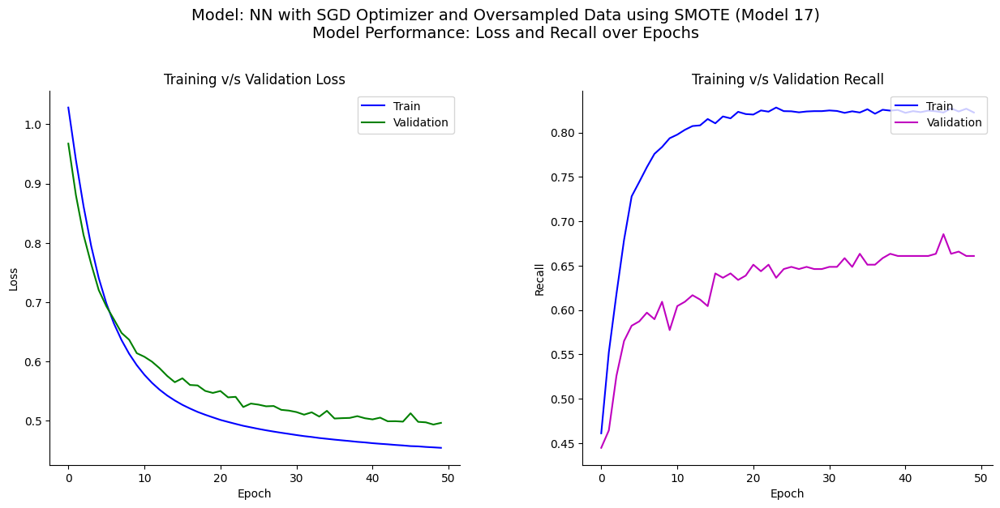

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

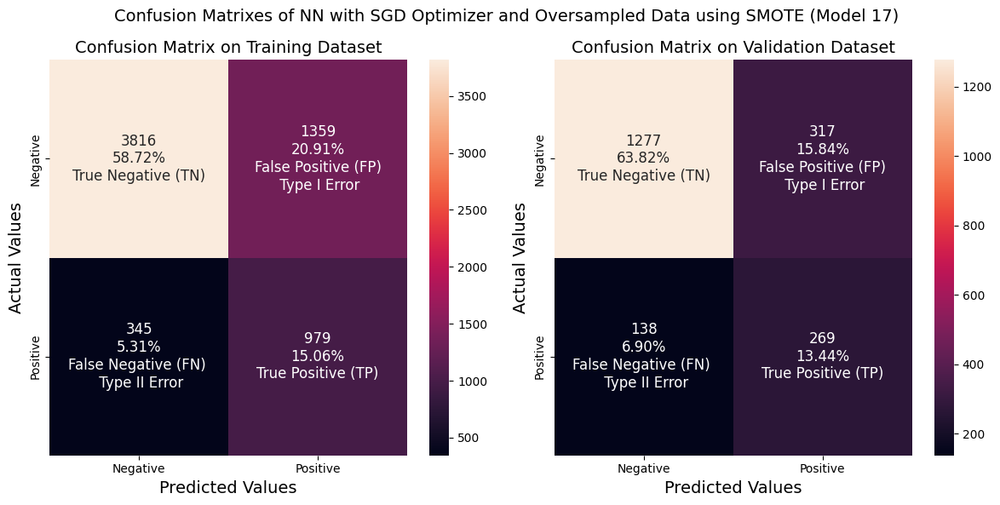

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observation**:
- **Loss**: The implementation of L2 regularization has successfully mitigated overfitting, as demonstrated by the convergence of validation loss to training loss.
- **Recall**: Validation recall exhibits a similar pattern to the previous model.

- **Precision & Accuracy**:Precision and accuracy remain stable compared to the previous model.
- **Confusion Matrix**: Better Type II error prediction, but potential overfitting.
**Recommendation**:
- To further enhance model performance, consider introducing dropout or other regularization techniques to reduce overfitting and improve generalization capabilities.

#### **Conclusion**

So far, we have made significant strides in enhancing model performance. Our next step could be to explore additional improvements by incorporating a dropout layer into the model, which would be optimized using the Adam optimizer.

### Neural Network with Balanced Data (by applying SMOTE), Adam Optimizer, and Dropout

Further we will build Neural Network model using the Adam (Adaptive Moment Estimation) optimizer with Dropout Regularization. We'll explore different combinations of epochs and batch sizes to optimize its performance.

#### **Model 18**

**Model 18**: Build a model with a 50% dropout rate:
 - Hidden layers = 2
 - epochs = 50
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Hidden Layers:
  - Layer 1 with 32 nodes and
  - Layer 2 with 16 nodes
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001
 - Regularization Technique:
  - L2 with rate 0.01
  - Dropout with 0.5 rate
 - Training the model on the oversampled train data set (using SMOTE)

In [ ]:
# Define hyperparameters
model_name = "NN with Adam Optimizer and Dropout with Oversampled Data"
model = "Model_18"                                                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train_over.shape[1],"units": 32, "activation": "relu", "kernel_regularizer": l2(0.01)}},
                                                                              # First hidden layer configuration
                {"Dropout":{"rate": 0.5}},                                     # Drpout layer
                {"Dense":{"units": 16, "activation": "relu", "kernel_regularizer": l2(0.01)}},
                                                                              # Second hidden layer configuration
                {"Dropout":{"rate": 0.5}},                                     # Drpout layer
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                    # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 50,                                                # Number of training epochs
                "batch_size" : 32,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with Adam Optimizer and Dropout with Oversampled Data (Model_18):

Model: "Model_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                384       
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 929 (3.63 KB)
Trainable params: 929 (3.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 50

Batch Size: 32

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset with oversampled data
history[model] = models[model].fit(X_train_over, y_train_over,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with Adam Optimizer and Dropout with Oversampled Data (Model_18)...

Epoch 1/50
324/324 [==============================] - 3s 5ms/step - loss: 1.0862 - recall: 0.5349 - val_loss: 1.0122 - val_recall: 0.4717
Epoch 2/50
324/324 [==============================] - 2s 5ms/step - loss: 1.0231 - recall: 0.5608 - val_loss: 0.9702 - val_recall: 0.5307
Epoch 3/50
324/324 [==============================] - 1s 5ms/step - loss: 0.9661 - recall: 0.6012 - val_loss: 0.9295 - val_recall: 0.5676
Epoch 4/50
324/324 [==============================] - 1s 5ms/step - loss: 0.9260 - recall: 0.5996 - val_loss: 0.8901 - val_recall: 0.5725
Epoch 5/50
324/324 [==============================] - 1s 3ms/step - loss: 0.8847 - recall: 0.6471 - val_loss: 0.8525 - val_recall: 0.6020
Epoch 6/50
324/324 [==============================] - 1s 3ms/step - loss: 0.8474 - recall: 0.6531 - val_loss: 0.8154 - val_recall: 0.6020
Epoch 7/50
324/324 [==============================] - 1s 3ms/step - loss: 0.8181 - recall: 0.6638 - val_loss: 0.7820 - val_recall: 0.5995
Epoch 8/50
324/324 [==============

Training Completed for NN with Adam Optimizer and Dropout with Oversampled Data (Model_18). Total Time taken: 65.88
seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train_over, y_train_over, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


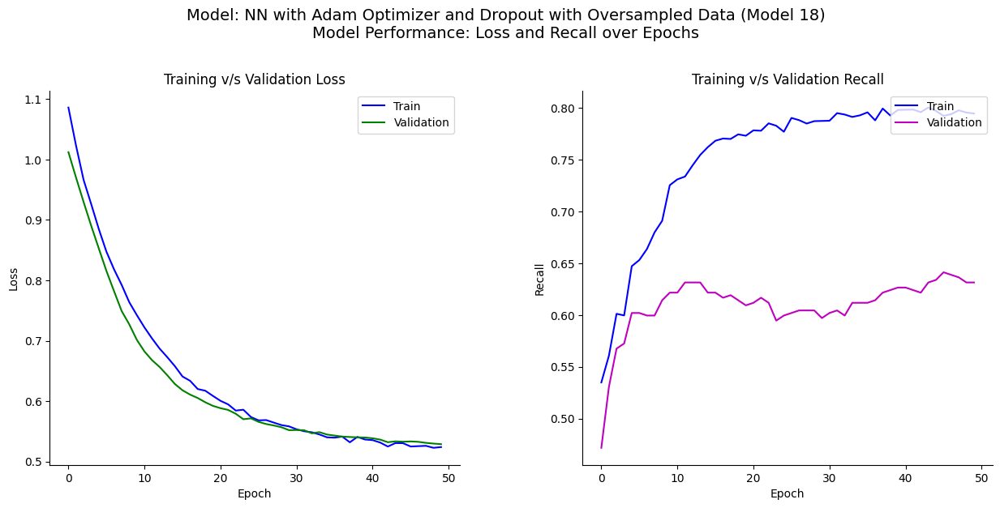

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

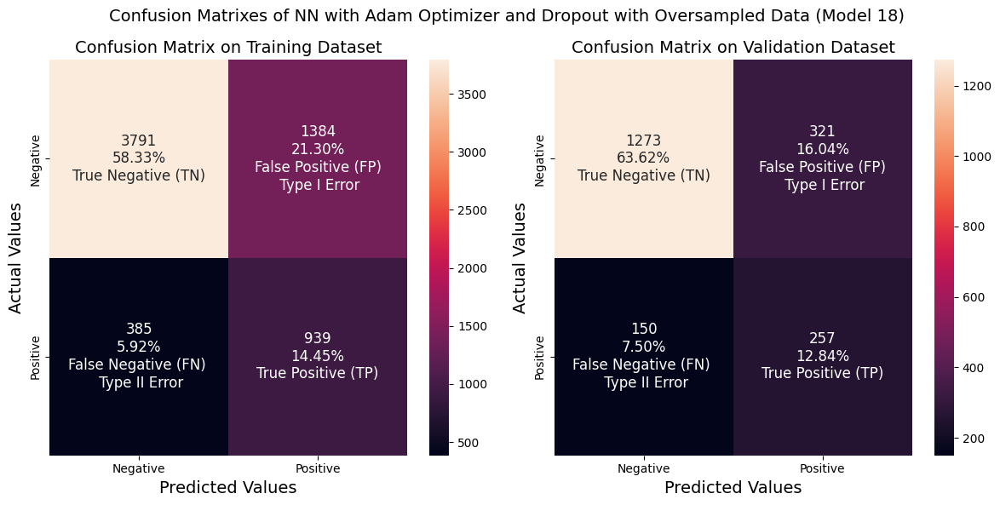

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observation**:
- **Loss**: The model with a 50% dropout rate fails to show significant improvement in conversion rate, with the validation loss and training loss remaining largely unchanged.

- **Recall**: The fluctuating recall on the validation set suggests that the model is inconsistent and possibly overfitting the training data.

- **Precision & Accuracy**: Remain alomost unchanged compared to the previous model.
- **Confusion Matrix**: Yields similar performance to the previous model, excelling in Type II error prediction, but with a risk of overfitting on training data.

**Recommendation**:
It is evident that the model with dropouts and L2 regularization has not received sufficient training iterations, so we should prioritize increasing the number of epochs first to allow the model to train more thoroughly.

#### **Model 19**

**Model 19**: Build a model with increasing the epoch to 150:
 - Hidden layers = 2
 - epochs = 150
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Hidden Layers:
  - Layer 1 with 32 nodes and
  - Layer 2 with 16 nodes
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001
 - Regularization Technique:
  - L2 with rate 0.01
  - Dropout with 0.5 rate
 - Training the model on the oversampled train data set (using SMOTE)

In [ ]:
# Define hyperparameters
model_name = "NN with Adam Optimizer and Dropout with Oversampled Data"
model = "Model_19"                                                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train_over.shape[1],"units": 32, "activation": "relu", "kernel_regularizer": l2(0.01)}},
                                                                              # First hidden layer configuration
                {"Dropout":{"rate": 0.5}},                                    # Drpout layer
                {"Dense":{"units": 16, "activation": "relu", "kernel_regularizer": l2(0.01)}},
                                                                              # Second hidden layer configuration
                {"Dropout":{"rate": 0.5}},                                    # Drpout layer
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                    # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 150,                                                # Number of training epochs
                "batch_size" : 32,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with Adam Optimizer and Dropout with Oversampled Data (Model_19):

Model: "Model_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                384       
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 929 (3.63 KB)
Trainable params: 929 (3.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 150

Batch Size: 32

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset with oversampled data
history[model] = models[model].fit(X_train_over, y_train_over,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with Adam Optimizer and Dropout with Oversampled Data (Model_19)...

Epoch 1/150
324/324 [==============================] - 2s 4ms/step - loss: 1.0862 - recall: 0.5349 - val_loss: 1.0122 - val_recall: 0.4717
Epoch 2/150
324/324 [==============================] - 1s 3ms/step - loss: 1.0231 - recall: 0.5608 - val_loss: 0.9702 - val_recall: 0.5307
Epoch 3/150
324/324 [==============================] - 1s 3ms/step - loss: 0.9661 - recall: 0.6012 - val_loss: 0.9295 - val_recall: 0.5676
Epoch 4/150
324/324 [==============================] - 1s 3ms/step - loss: 0.9260 - recall: 0.5996 - val_loss: 0.8901 - val_recall: 0.5725
Epoch 5/150
324/324 [==============================] - 1s 3ms/step - loss: 0.8847 - recall: 0.6471 - val_loss: 0.8525 - val_recall: 0.6020
Epoch 6/150
324/324 [==============================] - 2s 5ms/step - loss: 0.8474 - recall: 0.6531 - val_loss: 0.8154 - val_recall: 0.6020
Epoch 7/150
324/324 [==============================] - 2s 6ms/step - loss: 0.8181 - recall: 0.6638 - val_loss: 0.7820 - val_recall: 0.5995
Epoch 8/150
324/324 [======

Training Completed for NN with Adam Optimizer and Dropout with Oversampled Data (Model_19). Total Time taken: 
206.02 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train_over, y_train_over, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


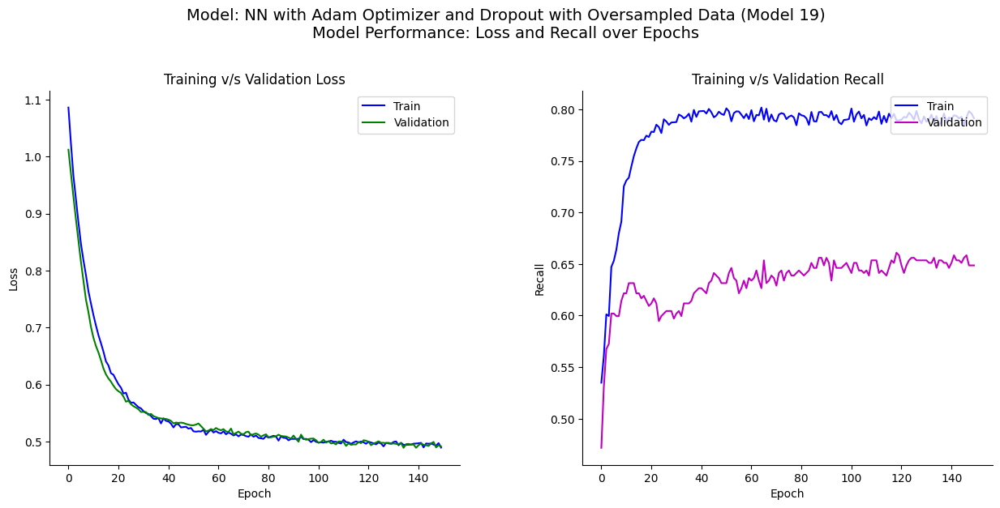

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

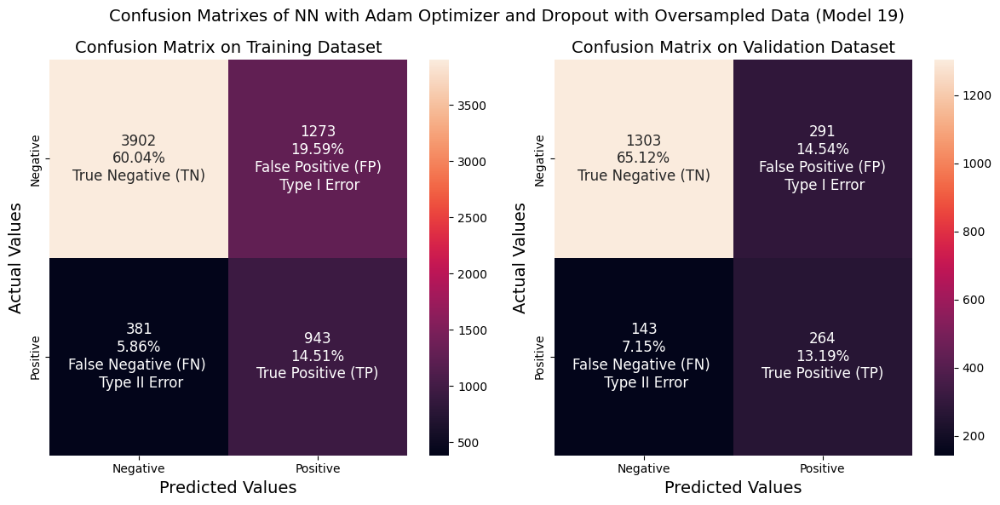

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observation**:
- **Loss**: Increasing the number of epochs did not significantly impact Validation and Training loss, indicating that the model continues to generalize well.

- **Recall**: The recall values for both the training and validation sets have plateaued, showing no notable improvement. This fluctuating and inconsistent performance indicates that the model is likely overfitting the training data, failing to generalize well to new, unseen data.

- **Precision & Accuracy**: Remain alomost unchanged compared to the previous model.

- **Confusion Matrix**: Consistently performs better in predicting Type II errors.

**Recommendation**:
This model takes approximately four times longer to train compared to the previous model, without showing any significant improvements in performance. This suggests that the increased computational resources and time have not resulted in better model accuracy or effectiveness.

#### **Model 20**

**Model 20**: Build a model by decreasing the dropout rate to 0.3:
 - Hidden layers = 2
 - epochs = 150
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Hidden Layers:
  - Layer 1 with 32 nodes and
  - Layer 2 with 16 nodes
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001
 - Regularization Technique:
  - L2 with rate 0.01
  - Dropout with 0.3 rate
 - Training the model on the oversampled train data set (using SMOTE)

In [ ]:
# Define hyperparameters
model_name = "NN with Adam Optimizer and Dropout with Oversampled Data"
model = "Model_20"                                                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train_over.shape[1],"units": 32, "activation": "relu","kernel_regularizer": l2(0.01)}},
                                                                              # First hidden layer configuration
                {"Dropout":{"rate": 0.3}},                                    # Drpout layer
                {"Dense":{"units": 16, "activation": "relu","kernel_regularizer": l2(0.01)}},
                                                                              # Second hidden layer configuration
                {"Dropout":{"rate": 0.3}},                                    # Drpout layer
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                    # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 150,                                               # Number of training epochs
                "batch_size" : 32,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with Adam Optimizer and Dropout with Oversampled Data (Model_20):

Model: "Model_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                384       
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 929 (3.63 KB)
Trainable params: 929 (3.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 150

Batch Size: 32

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset with oversampled data
history[model] = models[model].fit(X_train_over, y_train_over,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with Adam Optimizer and Dropout with Oversampled Data (Model_20)...

Epoch 1/150
324/324 [==============================] - 4s 9ms/step - loss: 1.0546 - recall: 0.4986 - val_loss: 0.9937 - val_recall: 0.4619
Epoch 2/150
324/324 [==============================] - 1s 4ms/step - loss: 0.9819 - recall: 0.5596 - val_loss: 0.9301 - val_recall: 0.4963
Epoch 3/150
324/324 [==============================] - 1s 3ms/step - loss: 0.9207 - recall: 0.6062 - val_loss: 0.8736 - val_recall: 0.5209
Epoch 4/150
324/324 [==============================] - 1s 3ms/step - loss: 0.8678 - recall: 0.6406 - val_loss: 0.8219 - val_recall: 0.5602
Epoch 5/150
324/324 [==============================] - 1s 4ms/step - loss: 0.8211 - recall: 0.6767 - val_loss: 0.7768 - val_recall: 0.5848
Epoch 6/150
324/324 [==============================] - 1s 4ms/step - loss: 0.7829 - recall: 0.6970 - val_loss: 0.7412 - val_recall: 0.5921
Epoch 7/150
324/324 [==============================] - 2s 5ms/step - loss: 0.7469 - recall: 0.7167 - val_loss: 0.7122 - val_recall: 0.6069
Epoch 8/150
324/324 [======

Training Completed for NN with Adam Optimizer and Dropout with Oversampled Data (Model_20). Total Time taken: 
248.16 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train_over, y_train_over, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


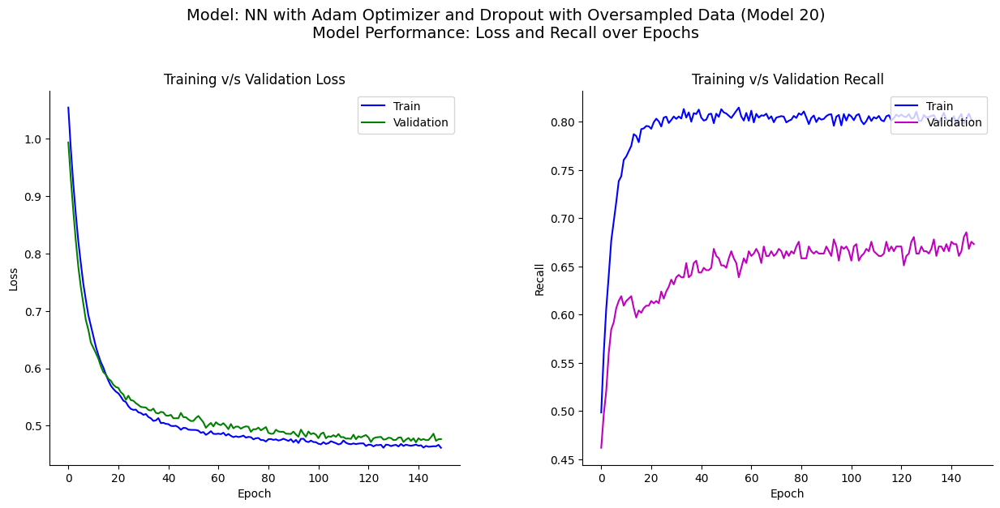

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

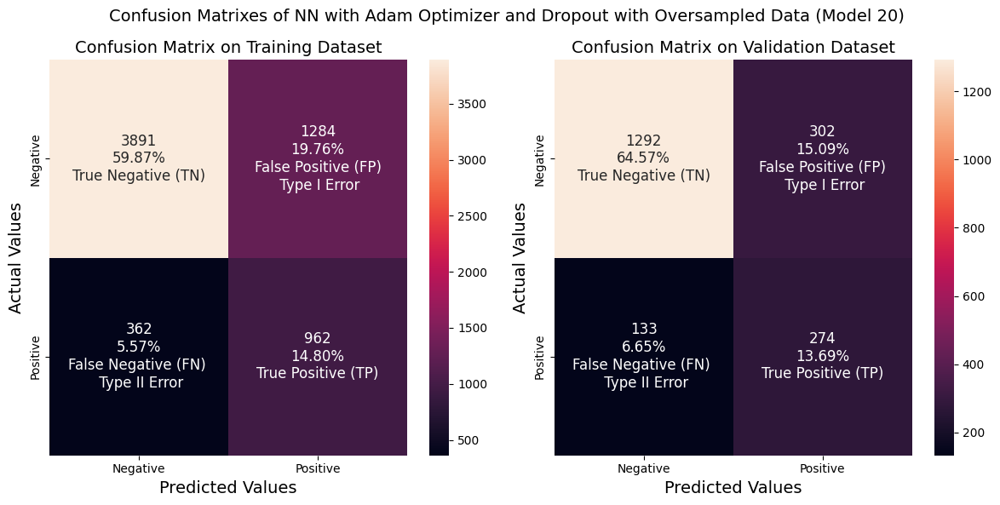

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observation**:
- **Loss**: Decreasing the dropout rate marginally improved the convergence of both Training and Validation Loss, indicating a more stable optimization process.

- **Recall**: The recall value on the Validation set still fluctuating and inconsistent..

- **Accuracy**: Accuracy remail high.
- **Confusion Matrix**: Yield same performance of the privious Model.

**Recommendation**: Further tuning of L2 regularization rate can reduce the overfittling.

#### **Model 21**

**Model 21**: Build a model by reducing the L2 regilarization rate:
 - Hidden layers = 2
 - epochs = 150
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Hidden Layers:
  - Layer 1 with 32 nodes and
  - Layer 2 with 16 nodes
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001
 - Regularization Technique:
  - L2 with rate 0.001 (reduced from 0.01)
  - Dropout with 0.3 rate
 - Training the model on the oversampled train data set (using SMOTE)

In [ ]:
# Define hyperparameters
model_name = "NN with Adam Optimizer and Dropout with Oversampled Data"
model = "Model_21"                                                         # Model Sequence

model_parameters[model] = (               # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                {"Dense":{"input_dim": X_train_over.shape[1],"units": 32, "activation": "relu","kernel_regularizer": l2(0.001)}},
                                                                              # First hidden layer configuration
                {"Dropout":{"rate": 0.3}},                                    # Drpout layer
                {"Dense":{"units": 16, "activation": "relu", "kernel_regularizer": l2(0.001)}},
                                                                              # Second hidden layer configuration
                {"Dropout":{"rate": 0.3}},                                    # Drpout layer
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                    # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 150,                                               # Number of training epochs
                "batch_size" : 32,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with Adam Optimizer and Dropout with Oversampled Data (Model_21):

Model: "Model_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                384       
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 929 (3.63 KB)
Trainable params: 929 (3.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 150

Batch Size: 32

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset with oversampled data
history[model] = models[model].fit(X_train_over, y_train_over,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with Adam Optimizer and Dropout with Oversampled Data (Model_21)...

Epoch 1/150
324/324 [==============================] - 3s 5ms/step - loss: 0.7270 - recall: 0.5034 - val_loss: 0.6877 - val_recall: 0.4693
Epoch 2/150
324/324 [==============================] - 1s 3ms/step - loss: 0.6966 - recall: 0.5675 - val_loss: 0.6619 - val_recall: 0.4988
Epoch 3/150
324/324 [==============================] - 1s 4ms/step - loss: 0.6709 - recall: 0.6100 - val_loss: 0.6379 - val_recall: 0.5356
Epoch 4/150
324/324 [==============================] - 1s 4ms/step - loss: 0.6488 - recall: 0.6400 - val_loss: 0.6155 - val_recall: 0.5602
Epoch 5/150
324/324 [==============================] - 1s 4ms/step - loss: 0.6281 - recall: 0.6844 - val_loss: 0.5962 - val_recall: 0.5872
Epoch 6/150
324/324 [==============================] - 1s 4ms/step - loss: 0.6140 - recall: 0.6989 - val_loss: 0.5821 - val_recall: 0.5897
Epoch 7/150
324/324 [==============================] - 2s 6ms/step - loss: 0.5986 - recall: 0.7084 - val_loss: 0.5712 - val_recall: 0.5995
Epoch 8/150
324/324 [======

Training Completed for NN with Adam Optimizer and Dropout with Oversampled Data (Model_21). Total Time taken: 
203.64 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train_over, y_train_over, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


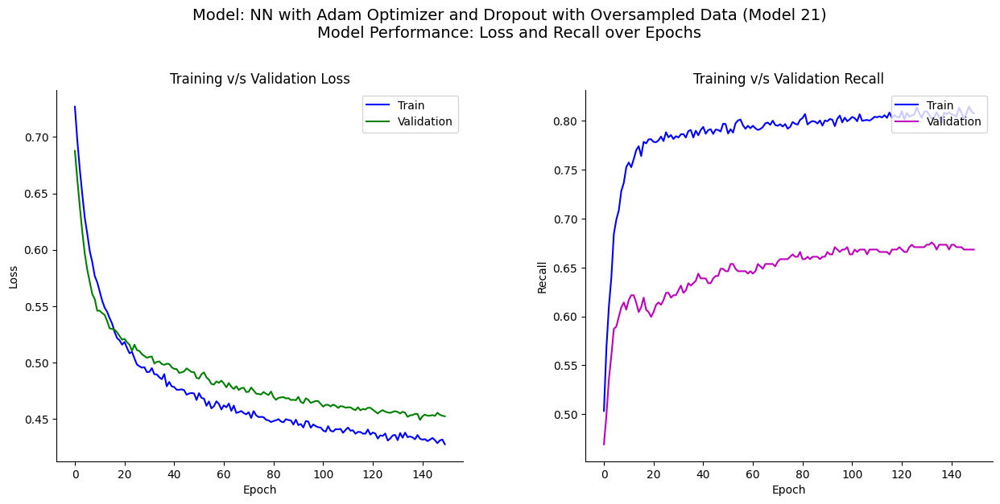

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

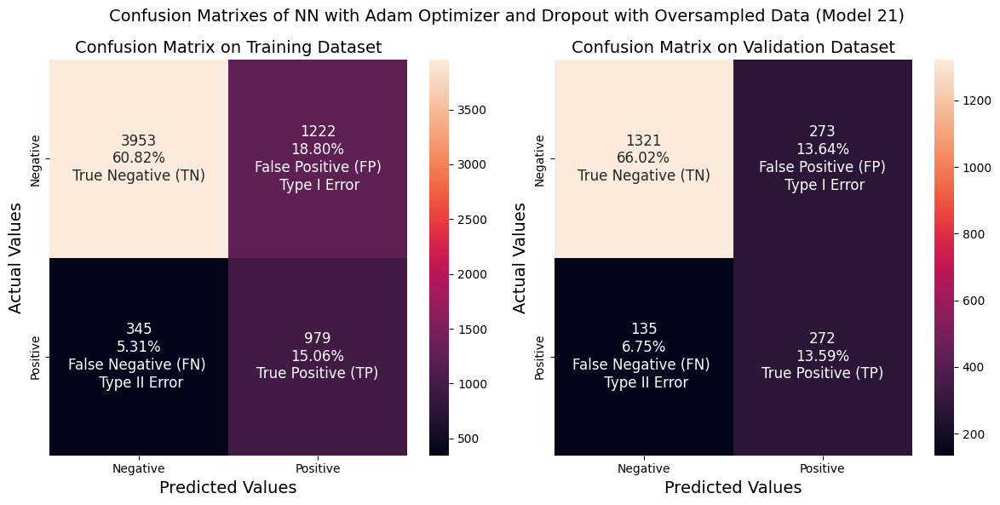

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observation**:
- **Loss**: Reducing the L2 regularization rate led to a slight deterioration in the Training and Validation data loss, but the loss values remain within an acceptable range, however Loss reduced for both the dataset.

- **Recall**: The recall value on the validation set is virtually identical to the previous model's result, indicating no significant improvement in the model's ability to detect true positives.

- **Precision & Accuracy**: Precision and Accuracy remail almost unchanged.

- **Confusion Matrix**: Similar to previous model, persistently.

**Recommendation**:
- Compared to the last four models, this model appears to be the best performer. Notably, it achieves the highest F1 score for both datasets, surpassing the previous models' performance. This suggests that this model has made significant improvements in balancing precision and recall, resulting in superior overall performance.
- Additional adjustments to the batch initialization hyperparameters may potentially enhance the recall performance.

#### **Model 22**

**Model 22**: Build a model by tuning Batch Initilizer:
 - Hidden layers = 2
 - epochs = 150
 - Batch Size = 32
 - Activation function for hidden layers = Relu
 - Hidden Layers:
  - Layer 1 with 32 nodes and
  - Layer 2 with 16 nodes
 - Output layer with 1 node
 - Outout Activation function = Sigmoid
 - Output loss function = Cross Entropy (since this is a classification problem)
 - Optimizer = Adam (Adaptive Moment Estimation)
 - Learning Rate = 0.0001
 - Batch Initilization = he uniform (default is Xavier also known as Glorot)
 - Regularization Technique:
  - L2 with rate 0.001 (redced from 0.01)
  - Dropout with 0.3 rate
 - Training the model on the oversampled train data set (using SMOTE)

In [ ]:
# Define hyperparameters
model_name = "NN with Adam Optimizer and Dropout with Oversampled Data"
model = "Model_22"                                                            # Model Sequence

model_parameters[model] = (                                                   # Define a tuple with model hyperparameters
        {
            "model_name": model_name,                                         # Model Name
            "model": model,                                                   # Model Sequence
            "layers": (                                                       # Model Layers
                                                                              # First hidden layer configuration
                {"Dense":{"input_dim": X_train_over.shape[1],"units": 32, "activation": "relu",'kernel_initializer':'he_uniform',"kernel_regularizer": l2(0.001)}},
                {"Dropout":{"rate": 0.2}},                                    # Drpout layer
                                                                              # Second hidden layer configuration
                {"Dense":{"units": 16, "activation": "relu",'kernel_initializer':'he_uniform', "kernel_regularizer": l2(0.001)}},
                {"Dropout":{"rate": 0.2}},                                    # Drpout layer
                {"Dense":{"units": 1, "activation": "sigmoid"}}               # Output layer configuration
              ),
            "compile": {
                "optimizer": Adam(learning_rate = 0.0001),                    # Optimizer configuration with learning rate
                "loss": binary_crossentropy,                                  # Loss function
                "metrics" : [Recall()],                                       # Metrics to monitor during training
            },
            "fit": {
                "epochs" : 150,                                               # Number of training epochs
                "batch_size" : 32,                                            # Batch size for training
            }
        }
)

In [ ]:
models[model] = create_model(models, model_parameters[model])  # Create the model

**Print the Model Summary**

In [ ]:
# Print the model summary
print(f"Training initiated for {model_name} ({model}):")
print_model_summary(models[model], model_parameters[model])

Training initiated for NN with Adam Optimizer and Dropout with Oversampled Data (Model_22):

Model: "Model_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                384       
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 929 (3.63 KB)
Trainable params: 929 (3.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch: 150

Batch Size: 32

Optimizer: Adam

Loss function: binary_crossentropy

Metrics: Recall

**Train the Model**

In [ ]:
print(f"Training initiated for {model_name} ({model})...\n")  # Print a message to indicate the start of tuning
start = time.time()  # Start the timer

# Fitting the model on train and validation Dataset with oversampled data
history[model] = models[model].fit(X_train_over, y_train_over,
                                 validation_data = (X_val, y_val) ,
                                 batch_size = model_parameters[model]['fit']['batch_size'],
                                 epochs = model_parameters[model]['fit']['epochs'])

duration = time.time() - start  # Calculate the duration of training
print(f"\n\nTraining Completed for {model_name} ({model}). Total Time taken: {(duration):.2f} seconds\n")

Training initiated for NN with Adam Optimizer and Dropout with Oversampled Data (Model_22)...

Epoch 1/150
324/324 [==============================] - 4s 7ms/step - loss: 0.8160 - recall: 0.4893 - val_loss: 0.7427 - val_recall: 0.4742
Epoch 2/150
324/324 [==============================] - 2s 5ms/step - loss: 0.7634 - recall: 0.5666 - val_loss: 0.7119 - val_recall: 0.4963
Epoch 3/150
324/324 [==============================] - 1s 3ms/step - loss: 0.7342 - recall: 0.6012 - val_loss: 0.6896 - val_recall: 0.5356
Epoch 4/150
324/324 [==============================] - 2s 5ms/step - loss: 0.7062 - recall: 0.6338 - val_loss: 0.6721 - val_recall: 0.5749
Epoch 5/150
324/324 [==============================] - 2s 5ms/step - loss: 0.6841 - recall: 0.6736 - val_loss: 0.6551 - val_recall: 0.5921
Epoch 6/150
324/324 [==============================] - 2s 5ms/step - loss: 0.6701 - recall: 0.6860 - val_loss: 0.6415 - val_recall: 0.5921
Epoch 7/150
324/324 [==============================] - 1s 4ms/step - loss: 0.6541 - recall: 0.6962 - val_loss: 0.6331 - val_recall: 0.5921
Epoch 8/150
324/324 [======

Training Completed for NN with Adam Optimizer and Dropout with Oversampled Data (Model_22). Total Time taken: 
185.42 seconds

**Evaluate the Model Performance**

In [ ]:
# Evaluate models on training and validation sets
train_result, val_result = evaluate_multiple_models(models, [model], X_train_over, y_train_over, X_val, y_val)

# Update performance dictionaries with evaluation results
train_perf.update(train_result)
val_perf.update(val_result)

# Generate classification report
result = classification_report(models[model], model_parameters[model], history[model], train_perf[model], val_perf[model], duration)

# Step 1: Concatenate 'result' data frame to 'results' where 'Model' values are different else update
# Step 2: reset the index
results = pd.concat([results[~results['Model'].isin(result['Model'])], result]).reset_index(drop = True)

results   # print the result

,Model,Model Name,Hidden Layers,Units,Activation,Epochs,Batch Size,Weight Initializer,Weight Regularizer,"Optimizer, Learning Rate, Momentum",Duration (Sec),Train Loss,Validation Loss,Train Recall,Validation Recall,Train Precision,Validation Precision,Train Accuracy,Validation Accuracy,Train F1 Score,Validation F1 Score
0,Model_1,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",10,6499,['GlorotUniform'],-,"[SGD,0.01000,0.0]",3.0033,0.6459,0.6490,0.1790,0.2064,0.1806,0.1799,0.6673,0.6472,0.1798,0.1922
1,Model_2,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",34.4245,0.3346,0.3431,0.4728,0.4079,0.7551,0.8098,0.8614,0.8601,0.5815,0.5425
2,Model_3,NN with SGD Optimizer,2,"[64, 32]","['relu', 'relu']",100,32,['GlorotUniform'],-,"[SGD,0.01000,0.0]",66.3081,0.3203,0.3452,0.4736,0.4079,0.7977,0.8058,0.8683,0.8596,0.5943,0.5416
3,Model_4,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,32,['GlorotUniform'],-,"[Adam,0.00100,-]",42.1821,0.2845,0.3633,0.5574,0.4324,0.8218,0.7822,0.8852,0.8601,0.6643,0.5570
4,Model_5,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],-,"[Adam,0.00010,-]",19.0711,0.3428,0.3473,0.4562,0.4103,0.7357,0.7915,0.8558,0.8581,0.5632,0.5405
5,Model_6,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",100,64,['GlorotUniform'],-,"[Adam,0.00010,-]",83.1373,0.3303,0.3462,0.4607,0.3980,0.7741,0.8020,0.8627,0.8576,0.5777,0.5320
6,Model_7,NN with Adam Optimizer,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Batch_Normalization'],"[Adam,0.00010,-]",26.1090,0.3273,0.3517,0.4811,0.3956,0.7893,0.7970,0.8681,0.8566,0.5978,0.5287
7,Model_8,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.05)'],"[Adam,0.00010,-]",22.0517,0.3539,0.3472,0.4479,0.3980,0.7348,0.8020,0.8546,0.8576,0.5565,0.5320
8,Model_9,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",50,64,['GlorotUniform'],['Dropout(0.03)'],"[Adam,0.00010,-]",24.4903,0.3496,0.3475,0.4517,0.3980,0.7365,0.7980,0.8554,0.8571,0.5599,0.5311
9,Model_10,NN with Adam Optimizer and Dropout,2,"[64, 32]","['relu', 'relu']",150,64,['he_normal'],['Dropout(0.05)'],"[Adam,0.00010,-]",83.9257,0.3333,0.3418,0.4789,0.4054,0.7713,0.7971,0.8649,0.8581,0.5909,0.5375


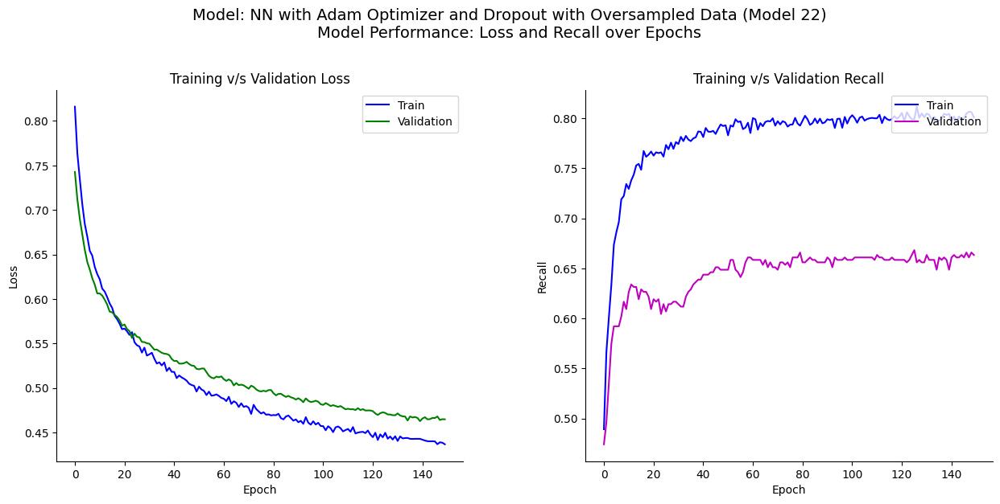

In [ ]:
# Extract the Loss Data of Training and Validation Set
train_loss[model], val_loss[model] = [history[model].history['loss']], [history[model].history['val_loss']]

# Extract the Recall Data of Training and Validation Set
train_recall[model],val_recall[model] = [history[model].history['recall']], [history[model].history['val_recall']]

# Plot the Loss and Recall Curve side by side
plot_side_by_side([plot, plot],
                   [
                       [train_loss[model], val_loss[model]],
                       [train_recall[model],val_recall[model]],
                   ],
                   (Loss_Matrics, Recall_Matrics),
                   title=f"Model: {model_name} ({model})\nModel Performance: Loss and Recall over Epochs".replace('_', ' '),
                   figsize = (15, 6),
                   fontsize = 14,
                   )

**Confusion Matrix**

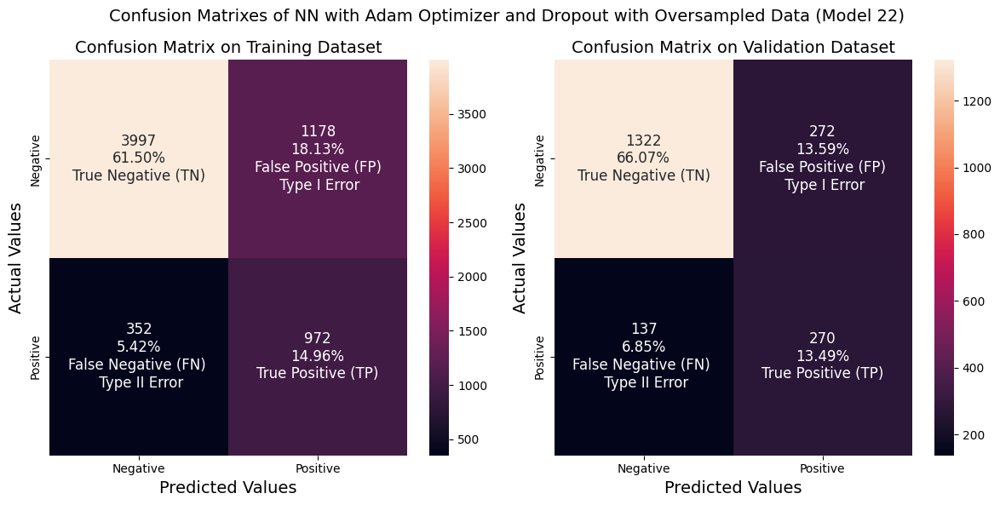

In [ ]:
# Predicting using the independent variables
y_train_pred[model] = prediction(models[model], X_train, 0.5)
y_val_pred[model] = prediction(models[model], X_val, 0.5)

preds = [y_train_pred[model], y_val_pred[model]]       # Predictions for training and validation sets
targets = [y_train, y_val]                              # Actual targets for training and validation sets

 # Plot the confusion matrix for the current model
plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )

**Observation**:
- **Loss**: The validation loss is still highly correlated with the training loss, indicating a consistent convergence pattern.

- **Recall**: No significant improvement in detecting true positives, with a recall value on the validation set similar to the previous model.

- **Precision and Accuracy**: Virtually unchanged, with no notable improvements or declines.

- **Confusion Matrix**: Similar to the previous model, with a focus on improving False Negative predictions over False Positive ones.

  **Note** - the only difference between the previous and current model is Karnel Initilizer. For current Model 'he_initilizer' is used.

#### **Conclusion**

**Over the last five models, we have employed the Dropout layer for tuning and trained them on balanced data, yielding promising results. The next step is to conduct a comprehensive model performance comparison to determine the optimal model among these candidates, paving the way for further improvements.**

## Model Performance Comparison and Final Model Selection

### Define Useful Functions and Variables

In [ ]:
# Function to visualize the performance of Training and Validation Set for Models
def Visualize_Perf_compariason(data ,perf,
                               kind = "bar",
                               title = None,
                               xlabel = None,
                               fontsize = 10,
                               width = 6, lenght = 6, degree = 0,
                               legend_pos = None):

  ncols = len(perf)  # Number of columns to display
  spines_pos = ['top', 'right','left']  # Set the spines to be visible

  # Create a figure and axes object
  fig, axes = plt.subplots(ncols = ncols, figsize = (width*ncols, lenght))
  xlabel = "Model" if xlabel is None else xlabel         # set xLabel

  # Loop through each column in the DataFrame
  for i, column in enumerate(perf):
    # Set y-axis limits based on the lowest value of Recall
    lower = (np.min(data[column]) - 0.025)               # Set the lower boundary of ylim
    upper = (np.max(data[column]) + 0.05)                # Set the upper boundary of ylim

    axs = axes if ncols == 1 else axes[i]                # Get the current axis

    data[column].plot(kind = kind, ax = axs)             # Plot the bar chart for the current column

    # Set dynamic title based on the performance metric
    title_text = f"Compare the {column} of Training vs Validation sets" if title is None else title
    axs.set_title(title_text)                            # Set the title of the plot
    axs.set_xlabel(xlabel, fontsize = fontsize)          # Set the x-axis label
    axs.set_ylabel(column, fontsize = fontsize)          # Set the y-axis label
    axs.set_ylim(lower, upper)                           # Set the y-axis limits
    axs.legend(fontsize='small', bbox_to_anchor = legend_pos)
                                                        # Set the legend font size and position
    axs.set_xticklabels(axs.get_xticklabels(),          # Set the x-axis tick labels
                            rotation = degree, ha='right', fontsize = fontsize)
    axs.set_yticklabels(axs.get_yticklabels(), fontsize = fontsize)
                                                        # Set the y-axis tick labels
    # Hide the specified spine
    [axs.spines[pos].set_visible(False) for pos in spines_pos]

  fig.tight_layout() # Adjust the layout of the subplots
  plt.show()         # Display the plot

In [ ]:
# Display performance metrics for a given machine learning model on a specified set (e.g., Training or Validation).
def display_model_performance(model, perf, Set, model_name = None, display = False):
    """
    Parameters:   - model_class (class): Class of the machine learning model.
                  - perf (dict): Dictionary containing performance metrics for the model.
                  - Set (str): Name of the performance set (e.g., 'Training', 'Validation').
    """
    # Get the performance metrics for the model

    # Get the model performance summary
    df = model_performance_summary(perf, Set, display_perf_columns, model_name)  # Get the model performance summary

    # Caption for the display
    caption = f"{model} {Set} performance:" if model_name == None else f"{model_name} ({model}) {Set} performance:"

    # Display the performance summary of the model on the specified set
    display_grid(
        caption  ,                              # Caption for the display
        Bold = True,                            # Display the caption in Bold
        df = df                                 # Call the function to get the model performance summary
    ) if display else None

    return df  # Return the model performance summary

In [ ]:
# Summarizes performance metrics for multiple models into a DataFrame
def model_performance_summary(perf, Set, columns, model_name = None ):
    """
    Parameters:   - perf (dict): Dictionary containing performance metrics for multiple models.
                  - Set (str): Name of the performance set (e.g., 'Training', 'Validation').
                  - columns (list): List of column names to include in the summary.
                  - model_name (str, optional): Name of the model. Default is None.
    Returns:      DataFrame: Summary of performance metrics for multiple models.
    """
    # Initialize an empty list to store DataFrames
    df_list = []  # Initialize an empty list to store DataFrames

    # Loop through each model and its performance metrics
    for model, metrics in perf.items():
        #Add 'Model' and 'Set' columns to the metrics dictionary
        metrics['Model'] = model
        metrics['Set'] = Set

        # Create a DataFrame from the metrics dictionary and then reorder columns
        df = pd.DataFrame(metrics, index=[0])[columns]
        # Add Model Name column is Model Name exist
        df.insert( loc = 1, column = 'Model Name', value = model_name) if model_name != None else None

        df_list.append(df)  # Append each DataFrame to the list

    # Concatenate all DataFrames into a single DataFrame and return
    return pd.concat(df_list, ignore_index = True)

In [ ]:
from IPython.display import Markdown, display  # Import the Library

# Displays a caption in Markdown format and a DataFrame
def display_grid(caption, df, Bold = False):
    """
    Parameters:   - caption (str): Caption to display.
                  - df (DataFrame): DataFrame to display.
                  - Bold (bool, optional): Flag to display the caption in bold. Default is False.
    """
    # Display the caption in bold if Bold is True, otherwise in regular font
    display(Markdown(f"**{caption}**")) if Bold else display(Markdown(caption))

    display(df)   # Display the DataFrame

### Display Model Performance

In [ ]:
from rich import print

models_train_comp_df = pd.DataFrame()  # Initialize an empty DataFrame to store the results

# Loop through each model and its corresponding parameter grid
for model in model_parameters.keys():

  # Append the results to the DataFrame
  models_train_comp_df = pd.concat(
      [
        models_train_comp_df,
        # Display the Models if display set to True
        display_model_performance(model, {model: train_perf[model].copy()}, "Training", model_parameters[model]['model_name'], display = False),
        display_model_performance(model, {model: val_perf[model].copy()}, "Validation", model_parameters[model]['model_name'], display = False),
      ],
    axis = 0,
  )

# Create a Pivot table of the Performance results
models_train_comp_df.set_index(['Model', 'Model Name'], inplace=True)
performance_pivot = models_train_comp_df.pivot_table(index = models_train_comp_df.index, columns = "Set", values = perf_column)

print("[bold]Training vs Validatrion Performance comparison on hypertuned Models:[/bold]\n")

performance_pivot['Model_Number'] = [int(idx[0].split('_')[1]) for idx in performance_pivot.index]        # Extracting model numbers
performance_pivot = performance_pivot.sort_values('Model_Number').drop('Model_Number', axis=1)            # Shot by model number and drop the column

performance_pivot.index = [f"{idx[0].replace(',',':')}: {idx[1]}" for idx in performance_pivot.index]     # Create a new index with the desired format
performance_pivot = performance_pivot.loc[:, perf_column]                                                 # Reorder the columns for better visibility

# Display the Pivot Table
performance_pivot.style.highlight_max(axis = 0)                                                           # Highlight the maximum value in each column

Training vs Validatrion Performance comparison on hypertuned Models:

To select the best models based on minimizing Type II error (which can be inferred from maximizing recall, especially validation recall), while maintaining a good balance in precision and recall, and avoiding overfitting, we need to look at the following:

1. **Validation Recall**: Prioritize high validation recall to minimize the False Negative or Type II errors.
2. **Validation Precision**: Optimize the precision, avoiding excessive false positives or Type I error.
3. **Validation Accuracy**: Ensure that validation accuracy is also reasonably high.
4. **Validation F1 Score**: Optimize for a high F1 score, which balances recall and precision.
5. **Training vs Validation Performance**: Avoid models with a large discrepancy between training and validation metrics to avoid overfitting.
6. **Training Process**: stability and consistent learning during the training process is an important factor.

Here’s how we can approach this:
1. Filter out models with very low validation recall or accuracy.
2. Rank the remaining models by validation recall and validation accuracy.
3. Ensure the selected models are not overfitting (i.e., training and validation performance should be reasonably close).
4. When selecting from the top-performing models, prioritize the one that demonstrates the most stable learning behavior during training, as evidenced by a consistent and smooth validation recall curve. This indicates a more robust and reliable model that is less prone to overfitting and better generalizes to new, unseen data.

**Use this approach we should identify the top 6 models based on their performance metrics for further evaluation**

In [ ]:
# Filter out models with very low validation recall
per_lower_limit = 0.5
best_count = 8    # count for the top 6 models

best_models = performance_pivot[performance_pivot[('Recall', 'Validation')] > per_lower_limit]

# Sort by validation recall and then by validation precision and after validation F1 Score
best_models = best_models.sort_values(by=[('Recall', 'Validation'), ('Precision', 'Validation'),('F1 Score', 'Validation')], ascending=False)

best_models.head(best_count).style.highlight_max(axis = 0)        # display the top models

To further evaluate the best model among the top 6, we need to analyze following for these models -
1. Graphical representation of the performance of the Training and Validation Sets.
2. Stable learning behavior during training.

### Data Visualization and Insights

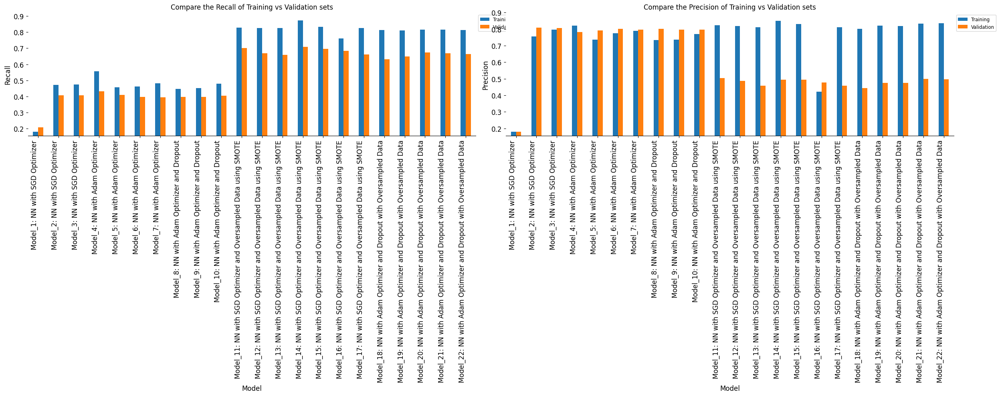

In [ ]:
# Visualize the performance of Training and Validation Set for Models
Visualize_Perf_compariason( pd.concat([performance_pivot]),   # Performance Data
                            ['Recall', 'Precision'],     # array of Performance parameters
                            degree = 90,
                            width = 12,
                            lenght = 10,
                            legend_pos = (1, 1),
                            fontsize = 12
                            )

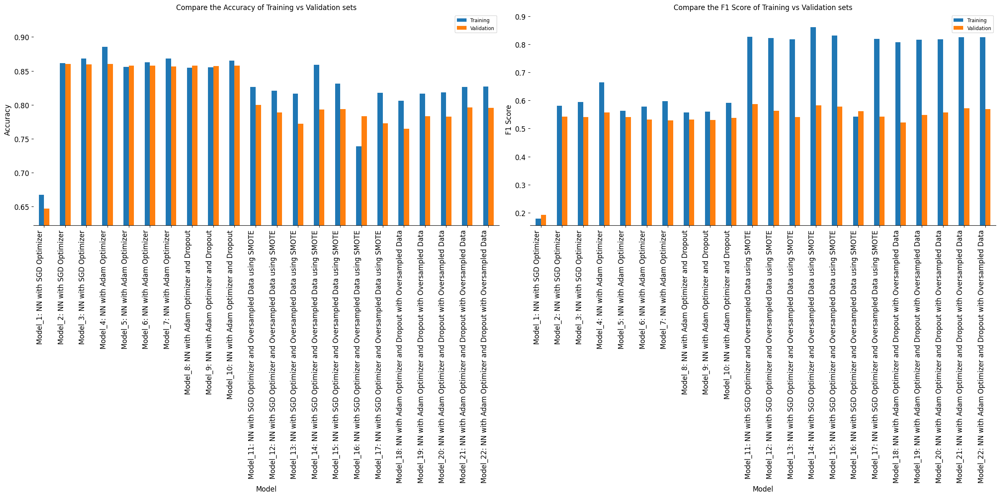

In [ ]:
# Visualize the performance of Training and Validation Set for Models
Visualize_Perf_compariason( pd.concat([performance_pivot]),   # Performance Data
                            ['Accuracy', 'F1 Score'],     # array of Performance parameters
                            degree = 90,
                            width = 12,
                            lenght = 12,
                            legend_pos = (1, 1),
                            fontsize = 12,
                            )

Increasing recall often comes at the expense of precision due to the inherent trade-offs between precision, recall, and accuracy in classification tasks. To achieve high recall, a model might predict positive more often, even if it's uncertain, to ensure that most actual positives are caught. This can lead to more false positives (instances incorrectly classified as positive), reducing precision, which in turn reduces overall accuracy.In the above plots it is evident that -

1. **The tuned models exhibit higher Recall rates, whereas in the Precision plot, these models display decreasing Precision and Accuracy trends. This contrast is clearly discernible across both plots.**

2. **While increasing recall is beneficial for capturing more true positives, it comes at the cost of precision. The F1 Score graph effectively highlights this trade-off and helps in understanding the overall performance and balance of the model.**

<font size=4> Graphical representation of Best 8 Models </font>

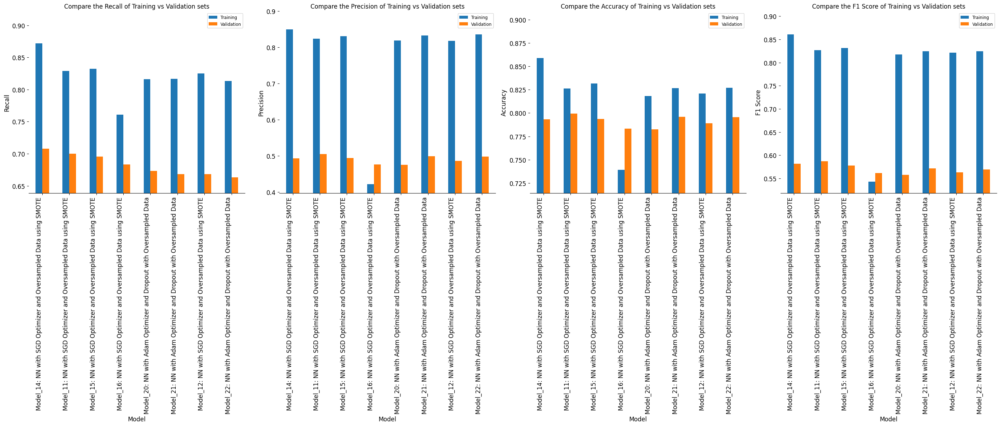

In [ ]:
# Visualize the performance of Training and Validation Set for Models
Visualize_Perf_compariason( pd.concat([best_models.head(best_count)]),   # Performance Data
                            perf_column,                                 # array of Performance parameters
                            degree = 90,
                            width = 7,
                            lenght = 12,
                            fontsize = 12,
                            legend_pos = (1, 1),
                            )

Despite the impressive recall and accuracy values in both the training and validation datasets, which suggest that the 8 models above are the top performers, we must exercise caution due to the risk of overfitting in the training dataset.for that we need to analyze the learning during the training process for all the models.Here is the Observation.


To further assess their performance and avoid overfitting, first we will analyze the traninig we will conduct a more in-depth analysis using confusion matrices. By analyzing the Type I and Type II error rates in the Confusion Matrix and the Learning

In [ ]:
plots_each_row = 4  # Number of plots in each row
matrics_comp_columns = ['Loss', 'Recall']  # Column names for the loss and recall matrices
best_models_param = pd.DataFrame(columns = matrics_comp_columns)  # Initialize an empty DataFrame to store the results

# Initialize an empty list to store dictionaries
best_models_ = [model.split(':')[0] for model in best_models.head(best_count).index]

# Create metadate for Recall Graph for all the Best Models
best_models_param['Recall'] = tuple(Recall_Matrics.copy() for _ in range(best_count))
best_models_param['Loss'] = tuple(Loss_Matrics.copy() for _ in range(best_count))

# Loop modify the Plot tiltle of each Model
for i, model in enumerate(best_models_):
    best_models_param['Recall'][i]['title'] = model #Set the Title of the Recall Matrix for the current model
    best_models_param['Loss'][i]['title'] = model   #Set the Title of the Loss Matrix for the current model

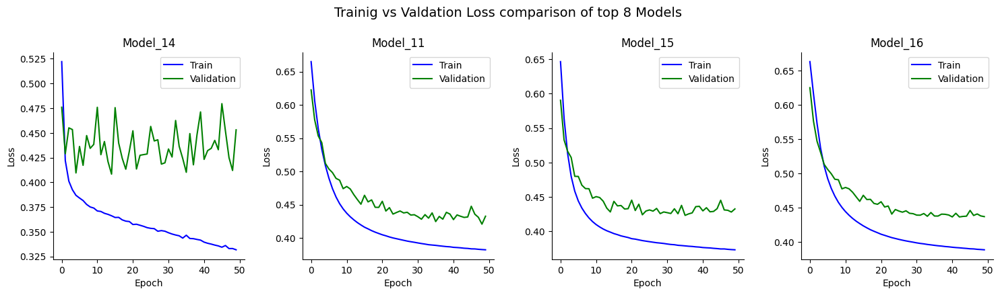

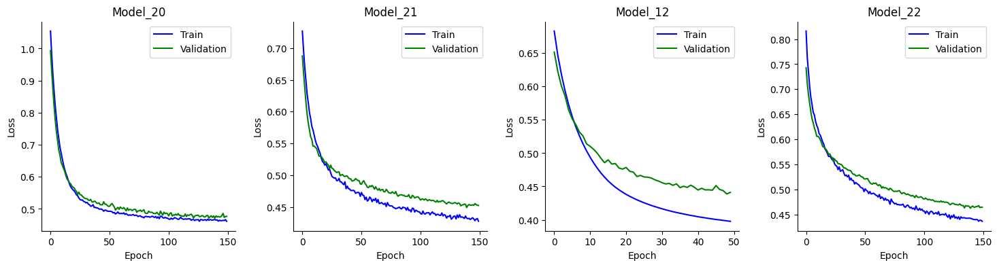

In [ ]:
# Plot the first 3 Models in First Row
plot_side_by_side([plot]*plots_each_row,
                   [
                       [train_loss[model], val_loss[model]] for model in best_models_[:plots_each_row]
                   ],
                   best_models_param['Loss'][:plots_each_row],
                   title = f"Trainig vs Valdation Loss comparison of top {best_count} Models",
                   figsize = (18, 4),
                   fontsize = 14,
                   )
# Plot the next 3 Models in 2nd Row
plot_side_by_side([plot]*plots_each_row,
                   [
                       [train_loss[model], val_loss[model]] for model in best_models_[plots_each_row:]
                   ],
                   best_models_param['Loss'][plots_each_row:],
                   figsize = (18, 4),
                   fontsize = 14,
                   )

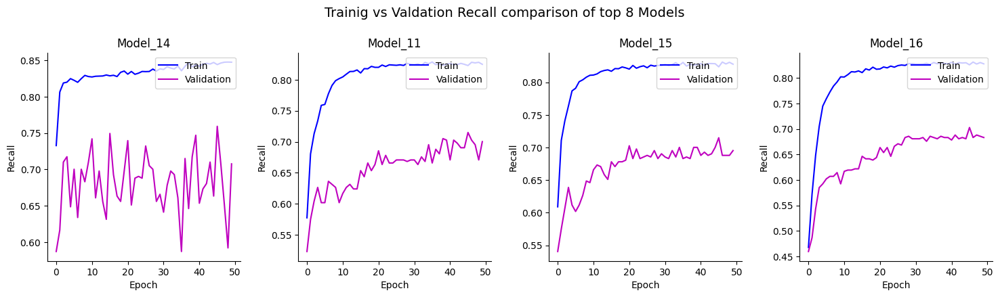

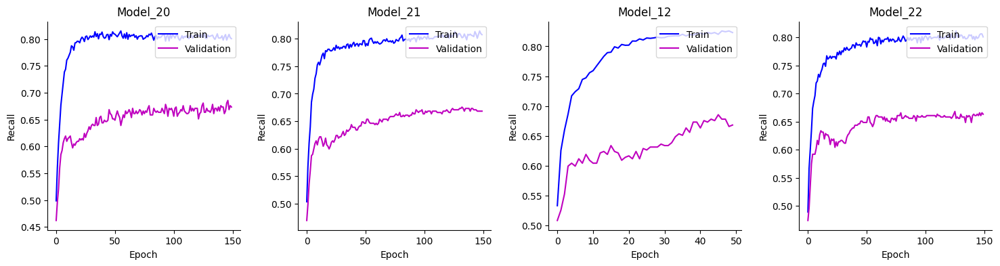

In [ ]:
# Plot the first 3 Models in First Row
plot_side_by_side([plot]*plots_each_row,
                   [
                       [train_recall[model], val_recall[model]] for model in best_models_[:plots_each_row]
                   ],
                   best_models_param['Recall'][:plots_each_row],
                   title = f"Trainig vs Valdation Recall comparison of top {best_count} Models",
                   figsize = (18, 4),
                   fontsize = 14,
                   )
# Plot the next 3 Models in 2nd Row
plot_side_by_side([plot]*plots_each_row,
                   [
                       [train_recall[model], val_recall[model]] for model in best_models_[plots_each_row:]
                   ],
                   best_models_param['Recall'][plots_each_row:],
                   figsize = (18, 4),
                   fontsize = 14,
                   )

After analyzing the graphs of Loss and Recall over epochs for all six models, we have identified three models that can be eliminated from further consideration:

 - **Model 14** has the highest Recall and F1 Score for both training and validation datasets, but exhibits high variance in Loss and Recall on the validation dataset. Similarly, **Model 15** and **Model 16** demonstrate high Recall and Accuracy, with competitive Precision and F1 Score, but also show high variance in Recall and Loss on the validation dataset.

 - Therefore, the final 5 models for further evaluation are mentinoed below. A comparison of their performance metrics, Loss, and Recall graphs for training versus validation datasets reveals very similar performance.

 1. **Model 12**
 2. **Model 16**
 3. **Model 20**
 4. **Model 21**
 5. **Model 22**

For further comparison of these final 5 models, we will utilize the **Confusion Matrix**.

### Confusion Matrix

**Interpretation of Confusion Matrix in business terms for Bank Crunch Prediction**:

1. As per the Model Evaluation creterion, considering the high cost of customer churn, our primary objective is to minimize **False Negatives (FN)** or **Type II error**, which represent missed opportunities to retain valuable customers.

2. However, we must also strike a balance by minimizing **False Positives (FP)** or **Type I error** to avoid unnecessary retention efforts and excessive costs.

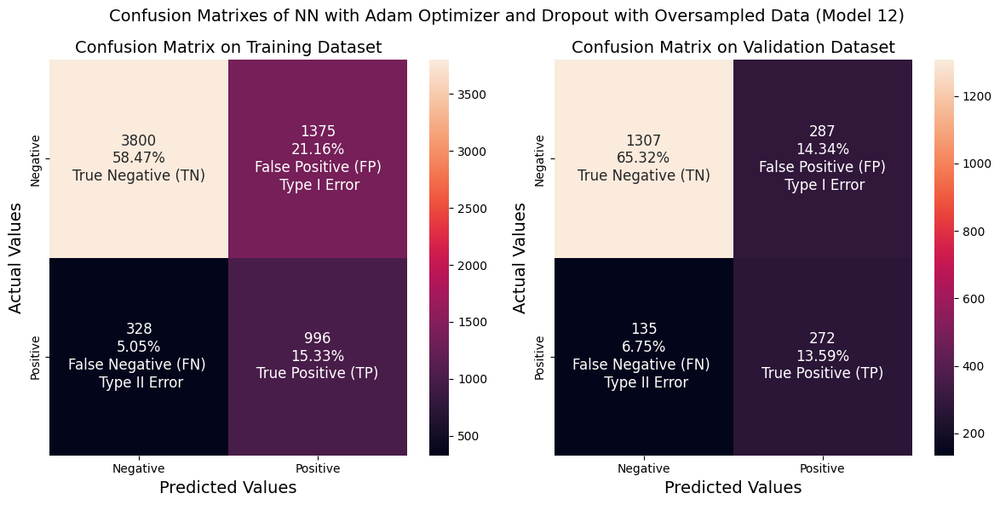

===================================================================================================================

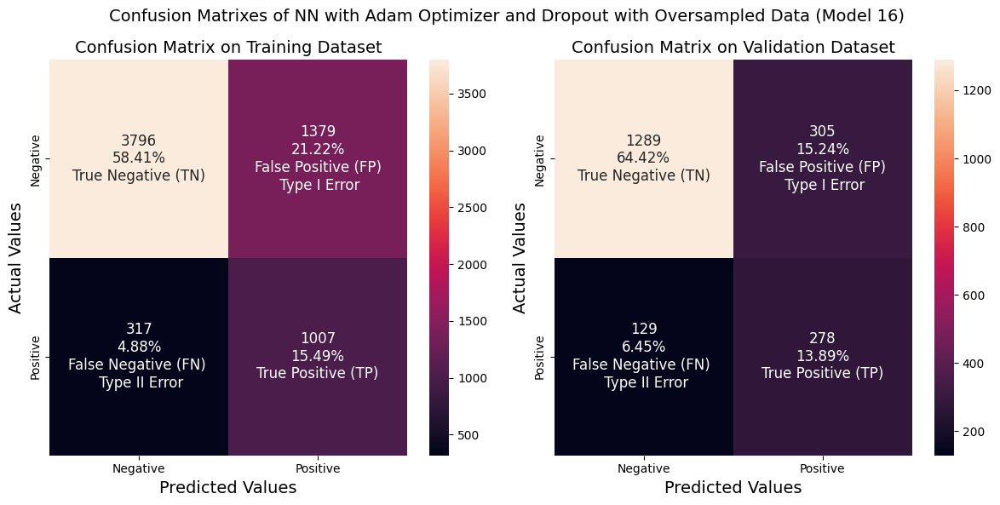

===================================================================================================================

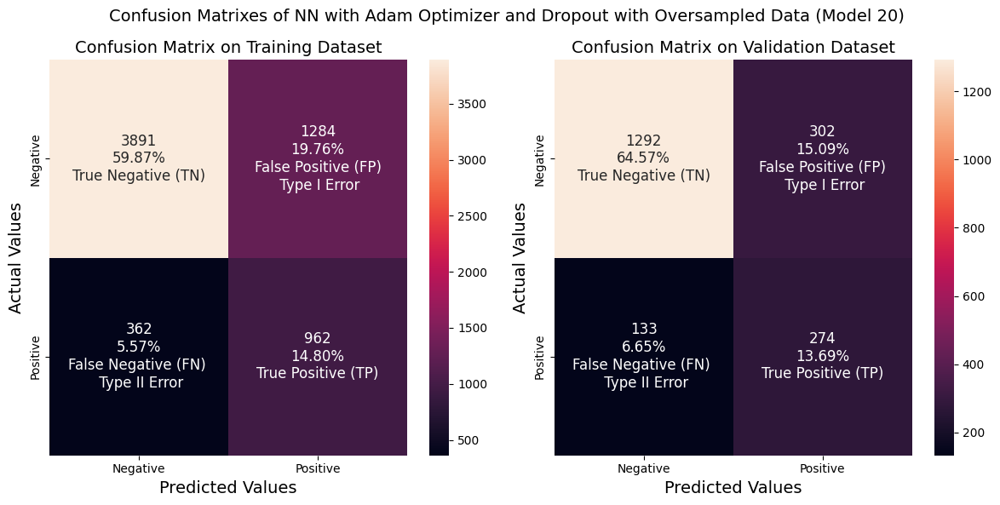

===================================================================================================================

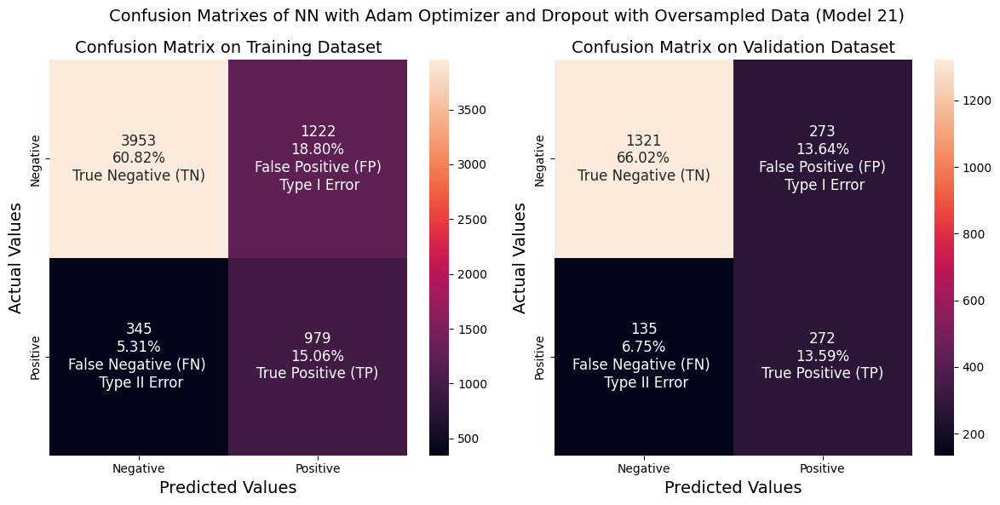

===================================================================================================================

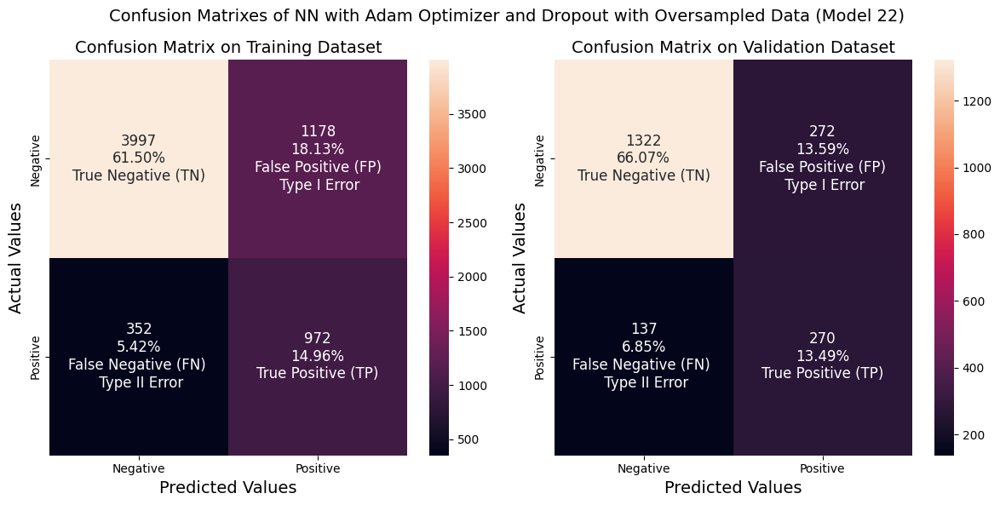

===================================================================================================================

In [ ]:
# Store the best 5 Models
best_models_ = ["Model_12", "Model_16", "Model_20", "Model_21", "Model_22"]

# Set the Parameters for the coufision Matrix Structure
for model in best_models_:
  # Predicting using the independent variables
  y_train_pred[model] = prediction(models[model], X_train, 0.5)
  y_val_pred[model] = prediction(models[model], X_val, 0.5)

  preds = [y_train_pred[model], y_val_pred[model]]                  # Predictions for training and validation sets
  targets = [y_train, y_val]
  #cm_structure = set_cm_structure_param(Frame_Size = 5, Frame_Fontsize = 12, Model_Fontsize = 12, Model_Annotsize = 10)                                      # Actual targets for training and validation sets

  # Plot the confusion matrix for the current model
  plot_confusion_matrices_side_by_side(preds, targets, cm_caption, set_cm_structure_param(),
                                       model_name = ("{} ({})".format(model_name, model.replace("_", " "))),
                                       )
  print("="*115)

Following is the analysis of the Confusion matrices of all the 5 Models:

**Model 16**:
- Achieved the highest recall on both training and validation datasets
- Demonstrated the lowest false negative rate on both datasets
- Showed lower precision on both datasets, with the highest false positive rate

**Model 12**:
- Exhibited the second-best recall on both datasets
- Displayed balanced precision on the training dataset

**Model 20**:
- Had lower recall and the lowest precision on both datasets
- Showed middling overall performance compared to other models

**Model 21**:
- Achieved the second-best precision on both datasets
- Demonstrated balanced recall on both datasets

- **Model 22**:
- Attained the best precision on both datasets
- Showed the lowest false positive rate on both datasets
- Had the lowest recall on both datasets, with the highest false negative rate

**Conclusion**:

The best model would be a trade-off between Model 22 and Model 16. Considering the model evaluation criteria, where reducing False Negatives (Type II error) is the primary goal, Model 16 emerges as the best model for Bank Crunch prediction. While Model 22 offers advantages in terms of precision, Model 16 strikes a better balance between minimizing False Negatives and controlling False Positives, making it the preferred choice for this specific problem.

### Determine Best Model

Here's a summarized architecture and training details of **Model 16 (Neural Network with Balanced Data (by applying SMOTE) and Adam Optimizer)** :

- Hidden Layers: 2 layers
 - Layer 1: 32 nodes (reduced from 64), ReLU activation
 - Layer 2: 16 nodes (reduced from 32), ReLU activation
- Output Layer: 1 node, Sigmoid activation
- Loss Function: Cross Entropy (for classification)
- Optimizer: Adam (Adaptive Moment Estimation) with Learning Rate 0.0001
- Training Data: Oversampled train dataset (using SMOTE)
- Training Epochs: 50
- Training Batch Size: 32

### Performance Curve of Best Model

Display of the performance curves (ROC and CAP) for Model 16

In [ ]:
best_model = "Model_16"                                               # Declare base model
best_model_name = model_parameters[best_model]['model_name']          # Extract the Base Model Name

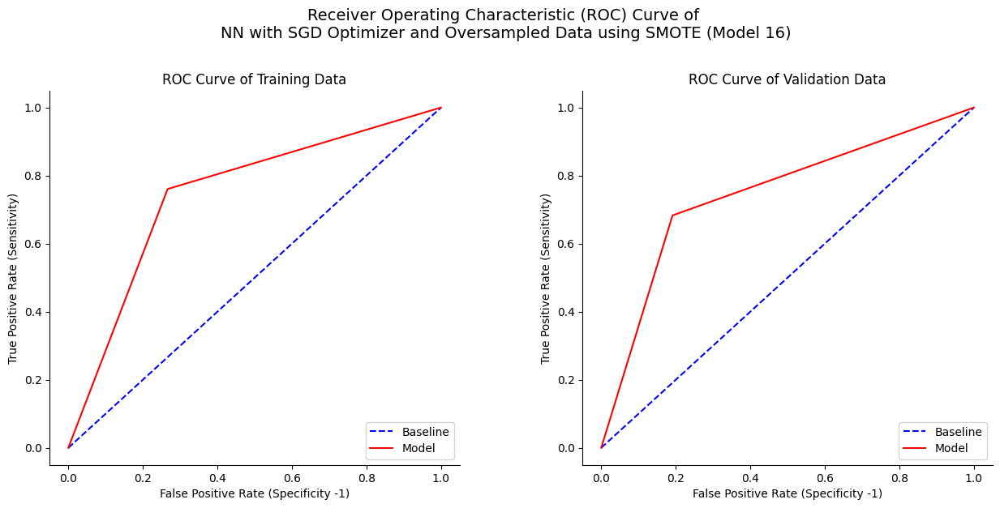

In [ ]:
roc_training = calculate_roc_curve(y_train, y_train_pred[best_model])   # Calculate the ROC curve data for Training Set
roc_val = calculate_roc_curve(y_val, y_val_pred[best_model])            # Calculate the ROC curve data for Validation Set

# Plot the ROC Curves on Training and Validation data side by side
plot_side_by_side([plot, plot],
                   [
                    [[roc_training['base_fpr'], roc_training['base_tpr']],[roc_training['model_fpr'], roc_training['model_tpr']]],
                    [[roc_val['base_fpr'], roc_val['base_tpr']],[roc_val['model_fpr'], roc_val['model_tpr']]],
                  ],
                   ROC_curve_metadata,
                   title=f"Receiver Operating Characteristic (ROC) Curve of \n{best_model_name} ({best_model.replace('_', ' ')})",
                   figsize=(15, 6),
                   fontsize=14,
                   )

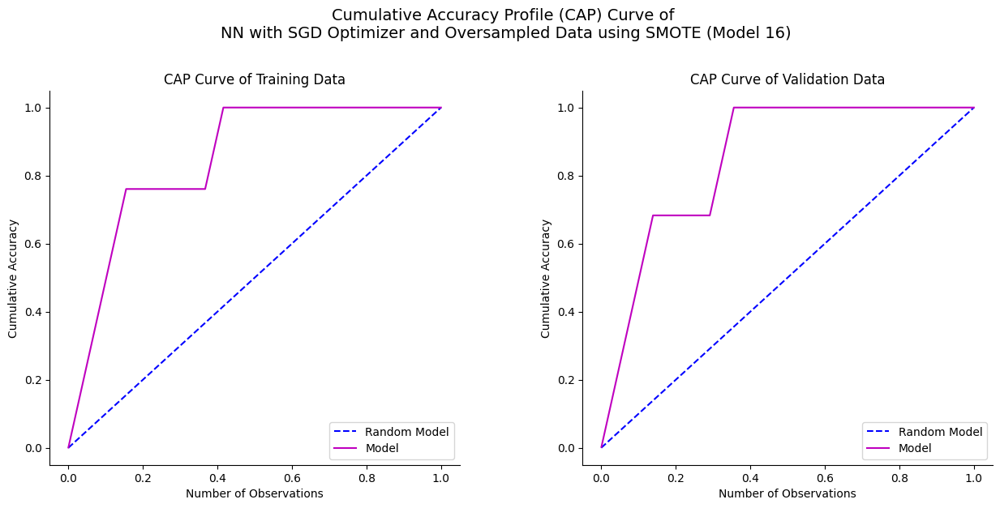

In [ ]:
cap_training = calculate_CAP(np.array(y_train), np.array((y_train_pred[best_model][:, 0])))   # Calculate the CAP Curve for Training Dataset
cap_val = calculate_CAP(np.array(y_val), np.array((y_val_pred[best_model][:, 0])))            # Calculate the CAP Curve Validation Dataset

# Plot the ROC Curves on Training and Validation data side by side
plot_side_by_side([plot, plot],
                   [
                    [[cap_training['base_fpr'], cap_training['base_tpr']],[cap_training['model_fpr'], cap_training['model_tpr']]],
                    [[cap_val['base_fpr'], cap_val['base_tpr']],[cap_val['model_fpr'], cap_val['model_tpr']]],
                   ],
                   CAP_curve_metadata,
                   title = f"Cumulative Accuracy Profile (CAP) Curve of \n{best_model_name} ({best_model.replace('_', ' ')})",
                   figsize = (15, 6),
                   fontsize = 14,
                   )

### Performance of the Best Model on the Test Set

In [ ]:
print("[bold]Performance of {} ({}) on Training, Validation & Test Datasets:[/bold]\n".format(best_model_name, best_model.replace("_", " ")))

test_perf = model_performance_classification_sklearn(models[best_model], X_test, y_test, threshold = 0.5)

pd.DataFrame(
 pd.concat(
      [
        # Display the Models if display set to True
        train_perf[best_model],
        val_perf[best_model],
        display_model_performance(models[best_model], {best_model: test_perf}, "Test", display = False),
      ],
    axis = 0,
    ).reset_index(drop=True), columns = display_perf_columns
  )


Performance of NN with SGD Optimizer and Oversampled Data using SMOTE (Model 16) on Training, Validation & Test 
Datasets:

,Model,Set,Recall,Precision,Accuracy,F1 Score
0,NaN,NaN,0.7606,0.4220,0.7390,0.5429
1,NaN,NaN,0.6830,0.4768,0.7831,0.5616
2,Model_16,Test,0.6667,0.5000,0.7960,0.5714


**Conclusion**:

The performance metrics clearly indicate that **Model 16** is a top-performing model, with results that closely align with the Validation Dataset. This strong performance suggests that Model 16 generalize well and is an effective and reliable choice for predicting Bank Crunch outcomes.

(
    'True Negative (TN)',
    'False Positive (FP)\n Type I Error',
    'False Negative (FN) \n Type II Error',
    'True Positive (TP)'
)

[['990\n66.00%\nTrue Negative (TN)'
  '204\n13.60%\nFalse Positive (FP)\n Type I Error']
 ['102\n6.80%\nFalse Negative (FN) \n Type II Error'
  '204\n13.60%\nTrue Positive (TP)']]

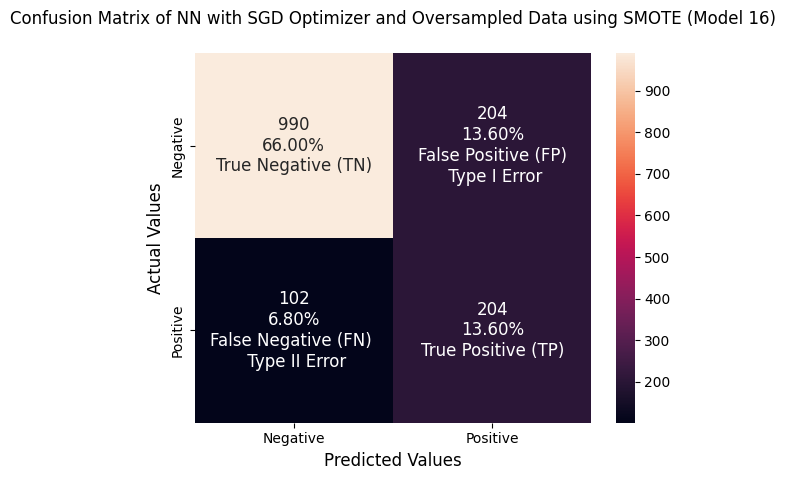

In [ ]:
# Predicting using the independent variables
y_test_pred = prediction(models[best_model], X_test, 0.5) #  Predictions for Test Set

title = ("Confusion Matrix of {} ({})\n".format(best_model_name, best_model.replace("_", " ")))

# Plot the confusion matrix for the current model on test data
confusion_matrix_sklearn(y_test_pred,  y_test, cm_caption, title).show()

**Conclusion**:

The confusion matrix demonstrate that **Model 16** is well-suited for predicting **Type II error (False Negatives)** on unseen data while maintaining a balance with **Type I error (False Positives)**.

The close match between the false positive and false negative rates in the training and validation sets suggests that the model has learned to generalize effectively. This balance is crucial in Bank Crunch prediction, where both false negatives (failing to detect actual crunches) and false positives (flagging non-crunches) have significant consequences. With **Model 16**, we can confidently predict Type II errors while keeping Type I errors in check.


## Actionable Insights and Business Recommendations

**Actionable Insights**:
1. **Customer Age**: Younger customers tend to stay with the bank longer. The median age of customers who left is around 45, while those who stayed is around 35. This suggests focusing on retention efforts for middle-aged and older customers.

2. **Customer Gender**:Females have a higher attrition rate compared to males. Initiatives to better understand and address the needs and preferences of female customers could help improve retention rates.

3. **Geographic Distribution**:Retention rates vary significantly by geography. Customers in Germany show a notably lower retention rate (\~65%) compared to France and Spain (\~85%). This suggests a need for targeted retention strategies in Germany.

4. **Credit Score**: Customers with a credit score below 400 are very likely to leave. Special attention and personalized financial products or advisory services could be provided to customers with low credit scores to improve their experience and loyalty.

5. **Customer Tenure**: Customers with less than one year or more than nine years of tenure are more likely to leave. Developing programs that engage new customers and re-engage long-term customers could help reduce churn.

6. **Number of Products**: Customers using only one product are more likely to leave, while those using two products are more loyal. Encourage customers to use multiple products through cross-selling and bundling offers.

7. **Account Balance**: Customers with higher balances are more likely to leave. Personalized financial advice and exclusive benefits for high-balance customers could help improve retention among this group.

8. **Active Membership**: Inactive customers have a higher attrition rate (\~25%) compared to active ones (\~15%). Engagement campaigns aimed at inactive customers could help increase their activity and reduce churn.

**Business Recommendations**:

1. **Personalized Customer Engagement**:Develop targeted communication and engagement strategies for different customer segments (age, gender, geography, credit score, tenure, product usage). Personalized emails, offers, and services can make customers feel valued and understood.

2. **Enhance Customer Experience**: Conduct surveys and focus groups to understand the specific needs and pain points of female customers, older customers, and those in Germany. Use this feedback to improve services and address specific concerns.

3. **Financial Advisory Services**: Offer personalized financial planning and advisory services, especially to customers with low credit scores and high balances. This can help them better manage their finances and build loyalty to the bank.

4. **Loyalty Programs**:Implement or enhance loyalty programs that reward long-term customers and those who use multiple products. Offer incentives for new customers to stay beyond their first year and for long-term customers to stay engaged.

5. **Cross-Selling and Bundling**: Promote the use of multiple products by bundling them into attractive packages. This can help increase product usage and reduce the likelihood of customers leaving.

6. **Proactive Retention Strategies**: Use predictive analytics to identify at-risk customers and proactively reach out to them with personalized offers and services. For example, offer a special check-in for customers who have been with the bank for nine years.

7. **Engagement Campaigns for Inactive Customers**:Launch campaigns to re-engage inactive customers. This could include special offers, personalized messages, and reminders of the benefits of being an active member.

8. **Monitor and Adapt**: Continuously monitor customer feedback and churn rates. Use this data to adapt and refine strategies over time, ensuring they remain effective in reducing customer attrition.

By implementing these insights and recommendations, the bank can improve customer retention, enhance customer satisfaction, and ultimately drive business growth.

<font size=6 color='blue'>Power Ahead</font>
___